## Objective
Run algorithm on spikeinterface recording

si_rec3.ipynb -> si_rec4.ipynb: Using DL inputs for prop

## General setup

In [1]:
%load_ext autoreload

In [186]:
from importlib import reload
from IPython.display import display

import numpy as np
import matplotlib.pyplot as plt

from multiprocessing import Pool
from sklearn.mixture import GaussianMixture
from pandas import DataFrame

from tqdm import tqdm

%autoreload 2
from src.run_alg import si_rec4 as F
from src.sorters.prop_signal import PropSignal, PropUnit
from src.sorters.kilosort import get_experts_kilosort
from src.sorters.base import SpikeSorter, Unit
from src.comparison import Comparison, DummySorter
from src import utils, plot
from src.sorters.kilosort import get_experts_kilosort

In [3]:
import pickle
from joblib import Parallel, delayed
from copy import deepcopy
from pathlib import Path

# Test parallel processing with joblib
# from joblib import Parallel, delayed
# def test(_):
#     data = np.random.random(1000).reshape((-1, 2))
#     gmm = GaussianMixture(n_components=6, init_params="kmeans", covariance_type="diag")
#     gmm.fit(data)
#     return None
    
# # Full run 
# # all_props = []
# Parallel(n_jobs=20)(delayed(test)(x) for x in tqdm(range(300)))

In [4]:
recording = RECORDING = utils.rec_si()  # lowercase for easier implementation in .py functions. uppercase for jupyter notebook
samp_freq = RECORDING.get_sampling_frequency()
chans_rms = CHANS_RMS = utils.chans_rms_si()
num_elecs = RECORDING.get_num_channels()

COC_DICT_ROOT = Path("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/prop_signal/coc_dicts")  # /{elec}.pickle

cross_times = np.load("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/spike_times.npy", allow_pickle=True)
cross_amps = np.load("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/spike_amps.npy", allow_pickle=True)
# NOTE: For DL, cross_amps retain sign of original data (i.e. positive or negative)

# Need to eliminate some crosses with 0 amplitude (bug in raw_recording.ipynb in DL project, not sure why/where) --> handle this when forming coc_dicts
# cross_times = []
# cross_amps = []
# for times, amps in tqdm(zip(cross_times_og, cross_amps_og), total=len(cross_times_og)):
#     ind = ~np.isclose(amps, 0)
#     cross_times.append(np.array(times)[ind])
#     cross_amps.append(np.array(amps)[ind])

# TODO: How DL detects cross_amps needs to be fixed
# total = 0
# for amps in tqdm(cross_amps):
#     amps = np.array(amps)
#     ind = amps < 0
#     total += sum(ind)
# print(total)

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'hdmf-common' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'core' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])


Recording does not have scaled traces. Setting gain to 0.195


In [5]:
TIME_FRAME_5_10 = (5*60*1000, 10*60*1000)  # 5 min to 10 min in recording (in ms)

In [6]:
"""  closest_elecs
Index in closest_elecs is electrode index.
Each element is list containing electrode indices sorted by
ascending distance from index electrode (excluding index electrode itself)
"""
all_closest_elecs = []

elec_locs = RECORDING.get_channel_locations()
for elec in range(num_elecs):
    elec_ind = []
    dists = []
    x1, y1 = elec_locs[elec]
    for elec2 in range(RECORDING.get_num_channels()):
        if elec == elec2:
            continue
        x2, y2 = elec_locs[elec2]
        dists.append(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))
        elec_ind.append(elec2)
    order = np.argsort(dists)
    all_closest_elecs.append(np.array(elec_ind)[order])   
    

def calc_elec_dist(elec1, elec2):
    # Calculate the spatial distance between two electrodes
    x1, y1 = elec_locs[elec1]
    x2, y2 = elec_locs[elec2]
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

def get_nearby_elecs(ref_elec, max_dist=100):
    nearby_elecs = []
    for elec in all_closest_elecs[ref_elec]:
        if calc_elec_dist(ref_elec, elec) <= max_dist:
            nearby_elecs.append(elec)
    return nearby_elecs

def get_merge_elecs(ref_elec, max_dist=100):
    # [ref_elec] + get_nearby_elecs
    return [ref_elec] + get_nearby_elecs(ref_elec, max_dist)

mean amp: -52.3660774230957


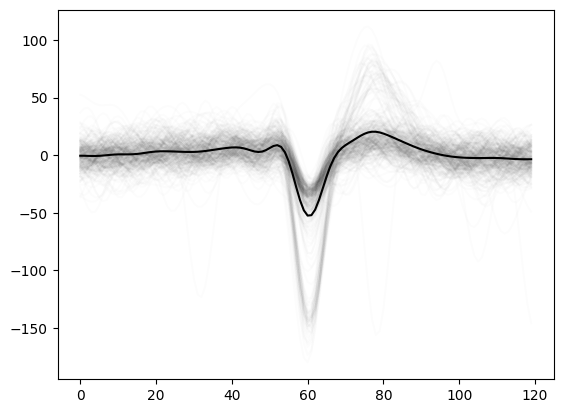

In [ ]:
# Plot cross times on one channel
CHAN = 0
N = 300

N_BEFORE = 60
N_AFTER = 60

np.random.seed(231)
##
traces = [] 
for _ in range(N):
    time_ms = np.random.choice(cross_times[CHAN])
    time = int(time_ms * RECORDING.get_sampling_frequency())
    trace = RECORDING.get_traces_filt(time-N_BEFORE, time+N_AFTER, CHAN).flatten()
    
    plt.plot(trace, color="black", alpha=0.01)
    
    traces.append(trace)
traces = np.stack(traces)
trace_mean = np.mean(traces, axis=0)
print(f"mean amp: {np.min(trace_mean)}")

plt.plot(trace_mean, color="black")

plt.show()

## Form propagations

In [ ]:
# Reformat cross_times into one long array
all_crossings = []  # [(elec_idx, time, amp)]
elec_crossings_ind = [[] for _ in range(len(cross_times))]  # ith element for elec idx i. Contains ind in all_crossings for elec idx i's crossings

pointers = [0] * len(cross_times)  # Where to index next time in each electrode's crossings (So all_crossings is sorted in time)
for t in tqdm(range(sum((len(t) for t in cross_times)))):
    next_time = np.inf
    next_amp = None
    next_elec = None
    for elec, idx in enumerate(pointers):
        if idx == len(cross_times[elec]):
            continue
        
        time = cross_times[elec][idx]
        if time < next_time:
            next_time = time
            next_amp = cross_amps[elec][idx]
            next_elec = elec
    
    all_crossings.append((next_elec, next_time, next_amp))
    elec_crossings_ind[next_elec].append(t)
    pointers[next_elec] += 1

100%|██████████| 7034141/7034141 [08:49<00:00, 13296.60it/s]


In [ ]:
# np.save("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/prop_signal/all_crossings.npy", np.array(all_crossings, dtype=object))
# np.save("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/prop_signal/elec_crossings_ind.npy", np.array(elec_crossings_ind, dtype=object))

# Reformat for faster retrieval
# all_crossings = [tuple(cross) for cross in all_crossings]
# elec_crossings_ind = [tuple(ind) for ind in elec_crossings_ind]  # [(elec's cross times ind in all_crossings)]

In [ ]:
def find_elec_cocs(elec_idx,
                   min_amp_ratio=0.9, coactivation_window=0.5,
                   max_elec_dist=200):
    """
    For electrode, return dictionary of
    {
        (elec cross time, elec cross amp): [(other elec idx, other elec cross time, other elec amp)]
    }
    
    If (elec cross time, elec cross amp) not in dictionary, then there was no cooccurrence with another electrode
    
    min_amp_ratio: For all tar_amps for ref_amp, ref_amp / tar_amp has to be at least min_amp_ratio for coocurrence to count as one
    """
    
    coc_dict = {}
    for ref_idx in elec_crossings_ind[elec_idx]:
        _, ref_time, ref_amp = all_crossings[ref_idx]       
        cocs = []
        
        # while idx-1 >= 0 and ref_time - all_crossings[idx-1][1] <= coactivation_window:
        #     idx -= 1
        #     cocs.append(all_crossings[idx])
                   
        # while idx+1 < len(all_crossings) and all_crossings[idx+1][1] - ref_time <= coactivation_window:
        #     idx += 1
        #     cocs.append(all_crossings[idx])
        
        for inc in (-1, 1):  # to handle cocs occurring before and after ref_time, respectively
            idx = ref_idx
            while (0 <= idx+inc < len(all_crossings)) and np.abs(ref_time - all_crossings[idx + inc][1]) <= coactivation_window:
                idx += inc
                tar_crossing = all_crossings[idx]
                
                # TODO: Implement a better solution? (check 231012_prop_notes, around slide 6)                
                if ref_amp / tar_crossing[2] < min_amp_ratio and calc_elec_dist(elec_idx, tar_crossing[0]) <= max_elec_dist:
                    break
                cocs.append(tar_crossing)
            else:
                continue  # Check next inc for cocs
            break  # If while loop was broken, then stop looking for cocs
        else:  # If for loop was not broken, then add cocs
            if len(cocs) > 0:                
                coc_dict[(ref_time, ref_amp)] = cocs
        
        # Not using for loop (instead, this needs copy and pasting)
        # idx = ref_idx
        # while idx-1 >= 0 and ref_time - all_crossings[idx-1][1] <= coactivation_window:  # Add cocs occurring before ref_time
        #     idx -= 1
        #     tar_crossing = all_crossings[idx]
        #     if np.abs(ref_amp / tar_crossing[2]) < min_amp_ratio:
        #         break
        #     cocs.append(tar_crossing)
        # else:           
        #     idx = ref_idx
        #     while idx+1 < len(all_crossings) and all_crossings[idx+1][1] - ref_time <= coactivation_window:  # Add cocs occurring after ref_time
        #         idx += 1
        #         tar_crossing = all_crossings[idx]           
        #         if np.abs(ref_amp / tar_crossing[2]) < min_amp_ratio:
        #             break
        #         cocs.append(tar_crossing)
        #     else:
        #         if len(cocs) > 0:
        #             coc_dict[(ref_time, ref_amp)] = cocs
                    
    return coc_dict

def save_coc_dict(elec):
    coc_dict = find_elec_cocs(elec)
    # with open(f"/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/prop_signal/coc_dicts/{elec}.pickle", "wb") as f:
    #     pickle.dump(coc_dict, f, pickle.HIGHEST_PROTOCOL)

with Pool(processes=20) as pool:
    tasks = range(num_elecs)
    for _ in tqdm(pool.imap(save_coc_dict, tasks), total=len(tasks)):
        pass

100%|██████████| 248/248 [00:26<00:00,  9.37it/s]


In [7]:
def load_coc_dict(elec, time_frame=None):
    with open(COC_DICT_ROOT / f"{elec}.pickle", "rb") as f:
        coc_dict = pickle.load(f)
    if time_frame is not None:
        start_ms, end_ms = time_frame
        new_coc_dict = {}
        for (root_time, root_amp), cocs in coc_dict.items():
            if start_ms <= root_time <= end_ms:
                new_cocs = []
                for elec, time, amp in cocs:
                    if start_ms <= time <= end_ms:
                        new_cocs.append((elec, time, amp))
                if len(new_cocs) > 0:
                    new_coc_dict[(root_time, root_amp)] = new_cocs
        coc_dict = new_coc_dict
    return coc_dict

4819
430


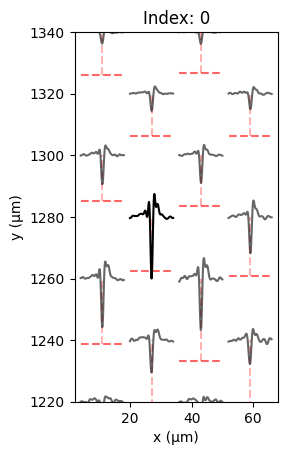

In [ ]:
# Testing find_elec_cocs   
# coc_dict = find_elec_cocs(0, min_amp_ratio=0.9, max_elec_dist=200)
ref_elec = 100
##
coc_dict = load_coc_dict(ref_elec)
print(len(coc_dict))
    
times = []
for (ref_time, ref_amp), cocs in coc_dict.items():
    for elec, time, amp in cocs:
        if elec == 97:
            times.append(ref_time)
print(len(times))

unit = Unit(0, times, ref_elec, RECORDING)
unit.plot(chans_rms=CHANS_RMS)
plt.show()

In [12]:
def get_coc_matrix(comp_elec, coc_dict, allowed_root_times=None):
    coc_matrix = []
    for (root_time, root_amp), cocs in coc_dict.items():
        if allowed_root_times is not None and root_time not in allowed_root_times:
            continue
        
        comp_times = []  # For multiple comp_elec crossings cooccuring with same root_elec crossing 
        comp_amps = []   # (this is slower and probably unnecessary than assuming only 1:1 cooccurrence)
        # ref_amps = []  # rel comp amp is comp_amp/mean(ref_amps)
        for tar_elec, tar_time, tar_amp in cocs:
            # crosses_thresh = tar_amp >= rms_thresh * chans_rms[tar_elec]
            if tar_elec == comp_elec:
                # if crosses_thresh:
                comp_times.append(tar_time)
                comp_amps.append(tar_amp)
                
        for comp_time, comp_amp in zip(comp_times, comp_amps):
            coc_matrix.append([comp_time - root_time, comp_amp/root_amp, root_time]) 

    return coc_matrix
        
        
class CocCluster:
    def __init__(self, coc) -> None:
        self.cocs = [coc]
        self.mean_latency = coc[0]
        self.mean_rel_amp = coc[1]
        
    def add_coc(self, coc):        
        mean_latency = len(self.cocs) * self.mean_latency + coc[0]
        mean_rel_amp = len(self.cocs) * self.mean_rel_amp + coc[1]
        
        self.cocs.append(coc)
        self.mean_latency = mean_latency / len(self.cocs)
        self.mean_rel_amp = mean_rel_amp / len(self.cocs)
        
    def calc_latency_diff(self, other):
        if isinstance(other, CocCluster):
            other_mean_latency = other.mean_latency
        else:  # Other is coc
            other_mean_latency = other[0]
        return np.abs(self.mean_latency - other_mean_latency)
    
    def calc_rel_amp_diff(self, other):
        if isinstance(other, CocCluster):
            other_mean_rel_amp = other.mean_rel_amp
        else:  # Other is coc
            other_mean_rel_amp = other[1]
        return np.abs(self.mean_rel_amp - other_mean_rel_amp) / self.mean_rel_amp 
    
    def merge(self, other):
        mean_latency = len(self.cocs) * self.mean_latency + len(other.cocs) * other.mean_latency
        mean_rel_amp = len(self.cocs) * self.mean_rel_amp + len(other.cocs) * other.mean_rel_amp
        
        self.cocs += other.cocs
        self.mean_latency = mean_latency / len(self.cocs)
        self.mean_rel_amp = mean_rel_amp / len(self.cocs)
        
    @property
    def spike_train(self):
        return np.sort([c[2] for c in self.cocs])
        

def cluster_elec_pair(coc_matrix, min_diff_start=1/samp_freq, min_cocs=100):
    # min_diff_start = 0.2
    # min_diff_start = 1e-5
    
    elec_clusters = [CocCluster(coc_matrix[0])]
    for coc in coc_matrix[1:]:
        closest_cluster = None
        min_diff = min_diff_start
        for cluster in elec_clusters:
            diff = cluster.calc_latency_diff(coc)
            if diff <= min_diff:
                closest_cluster = cluster
                min_diff = diff
        if closest_cluster is not None:
            closest_cluster.add_coc(coc)
        else:
            elec_clusters.append(CocCluster(coc))
            
    dead_clusters = set()
    while True:
        merge = None
        min_diff = min_diff_start
        for i in range(len(elec_clusters)):        
            cluster_i = elec_clusters[i]
            if cluster_i in dead_clusters:
                continue
            for j in range(i+1, len(elec_clusters)):            
                cluster_j = elec_clusters[j]
                if cluster_j in dead_clusters:
                    continue
                diff = cluster_i.calc_latency_diff(cluster_j)
                if diff <= min_diff:
                    merge = [cluster_i, cluster_j]
                    min_diff = diff
                    
        if merge is None:
            break
        
        merge[0].merge(merge[1])
        dead_clusters.add(merge[1])
    
    elec_clusters = [c for c in elec_clusters if len(c.spike_train) >= min_cocs and c not in dead_clusters]
    # elec_clusters = [c for c in elec_clusters if len(c.spike_train) >= min_cocs]
 
    return elec_clusters


def form_coc_clusters(root_elec, 
                       elec_patience=6, max_elec_dist=100,
                       time_frame=(0, 5*60*1000), min_cocs=100,
                       verbose=False):
    if verbose:
        print(f"Starting with elec {root_elec}, loc: {elec_locs[root_elec]}")
    
    coc_dict = load_coc_dict(root_elec, time_frame=time_frame)
    allowed_root_times = set(key[0] for key in coc_dict.keys())
    elec_patience_counter = 0
    all_coc_clusters = []
    for comp_elec in all_closest_elecs[root_elec]: 
        if calc_elec_dist(root_elec, comp_elec) > max_elec_dist:
            if verbose:
                print(f"\nStopping search early due to max dist {max_elec_dist}")
            break
        
        if len(allowed_root_times) < min_cocs:
            if verbose:
                print(f"\nNot enough cocs to continue")
            break
                 
        if verbose: 
            print(f"\nComparing to elec {comp_elec}, loc: {elec_locs[comp_elec]}")

        coc_matrix = get_coc_matrix(comp_elec, coc_dict, allowed_root_times)
        if len(coc_matrix) == 0:
            continue
        coc_clusters = cluster_elec_pair(coc_matrix, min_cocs=min_cocs)
        
        if verbose:
            print(f"Found {len(coc_clusters)} clusters")
            
        if len(coc_clusters) > 0:
            for cluster in coc_clusters:
                allowed_root_times.difference_update(cluster.spike_train)
                cluster.root_elec = root_elec
                cluster.comp_elec = comp_elec
                all_coc_clusters.append(cluster)
        else:
            elec_patience_counter += 1
            if elec_patience_counter == elec_patience:
                break
            
    if verbose:
        print(f"\nFound {len(all_coc_clusters)} total clusters")
    return all_coc_clusters
 
# root_elec = 17
# coc_matrix = get_coc_matrix(root_elec, load_coc_dict(root_elec, time_frame=(0, 5*60*1000)))
# coc_clusters = cluster_elec_pair(coc_matrix)
# len(coc_clusters)

# root_elec = 17
# coc_clusters = form_coc_clusters(root_elec, verbose=False)
# print(len(coc_clusters))
# merged_clusters = merge_coc_clusters(root_elec, coc_clusters, verbose=True)

# all_coc_clusters = []
# for root_elec in range(num_elecs):
#     coc_clusters = form_coc_clusters(root_elec, coc_matrix)
#     merged_clusters = merge_coc_clusters(root_elec, coc_clusters)
#     print(root_elec, len(coc_clusters), len(merged_clusters))

In [130]:
def setup_coc_clusters(coc_clusters, prob_thresh=0.1):
    # Set important data needed for merging and other analyses
    for idx, cluster in enumerate(coc_clusters):        
        setup_cluster(cluster)
        
        # Only needed for merging verbose
        cluster.idx = idx
        
def setup_cluster(cluster):
    all_elec_probs = extract_detection_probs(cluster)
    elec_probs = np.mean(all_elec_probs, axis=0)
    
    latencies = np.argmax(elec_probs, axis=1)
    cluster.latencies = latencies - elec_probs.shape[1] // 2 # in frames
    cluster.all_elec_probs = all_elec_probs
    cluster.elec_probs = elec_probs
    # cluster.elecs = np.flatnonzero(np.max(elec_probs, axis=1)>=prob_thresh)  # No longer needed
    
    waveforms = extract_waveforms(cluster)
    wf_amps = waveforms[:, range(waveforms.shape[1]), (latencies).astype(int)]  # (n_wfs, n_chans)
    mean_amps = np.abs(np.mean(wf_amps, axis=0))
    
    cluster.waveforms = waveforms
    cluster.mean_amps = mean_amps


def calc_isi_viol_p(spike_train, isi_viol=1.5):
    diff = np.diff(spike_train)
    num_viols = np.sum(diff <= isi_viol)
    return num_viols / len(spike_train) * 10

class Merge:
    # Represent a CocCluster merge
    def __init__(self, cluster_i, cluster_j, closest_elecs) -> None:
        self.cluster_i = cluster_i
        self.cluster_j = cluster_j
        self.closest_elecs = closest_elecs  # NOTE: First elec in closest_elecs must be root elec
        
        i_probs = np.max(cluster_i.elec_probs, axis=1)
        j_probs = np.max(cluster_j.elec_probs,axis=1)
        # self.elec_probs = (i_probs + j_probs) / 2  # /2 to find average between two elecs
        self.elec_probs = np.max(np.vstack((i_probs, j_probs)), axis=0)  # Max between two elecs
        
    def get_elec_weights(self, elecs):
        # Get elec weights for weighted average using :param elecs:
        elec_probs = self.elec_probs[elecs]
        elec_prob_weights = elec_probs / np.sum(elec_probs)
        return elec_prob_weights
        
    def score_latencies(self):
        elecs = self.closest_elecs[1:]
        elec_weights = self.get_elec_weights(elecs)
        
        latency_diff = np.abs(self.cluster_i.latencies[elecs] - self.cluster_j.latencies[elecs])
        latency_diff = elec_weights * latency_diff
        latency_diff = np.sum(latency_diff)
        
        return latency_diff
        
    def score_rel_amps(self):
        elecs = self.closest_elecs
        elec_weights = self.get_elec_weights(elecs)
        
        # Clusters' amps relative to different electrodes
        # i_amps = self.cluster_i.mean_amps[elecs]
        # i_rel_amps = i_amps / np.mean(-np.sort(-i_amps)[:3])
        # j_amps = self.cluster_j.mean_amps[elecs]
        # j_rel_amps = j_amps / np.mean(-np.sort(-j_amps)[:3])
            
        # To the same electrodes
        i_amps = self.cluster_i.mean_amps[elecs]
        i_rel_amps = i_amps / np.mean(i_amps[:3])
        j_amps = self.cluster_j.mean_amps[elecs]
        j_rel_amps = j_amps / np.mean(j_amps[:3])
        
        # rel_amp_div = np.min(np.vstack((i_rel_amps, j_rel_amps)), axis=0)
        rel_amp_div = np.mean(np.vstack((i_rel_amps, j_rel_amps)), axis=0)
        
        rel_amp_diff = np.abs(i_rel_amps - j_rel_amps) / rel_amp_div
        rel_amp_diff = elec_weights * rel_amp_diff
        rel_amp_diff = np.sum(rel_amp_diff)
        return rel_amp_diff
    
    def can_merge(self, max_latency_diff, max_rel_amp_diff):
        return (self.score_latencies() <= max_latency_diff) and (self.score_rel_amps() <= max_rel_amp_diff)

    def merge(self):
        # if-statement to allow merging Unit after detecting spikes
        if isinstance(self.cluster_i, CocCluster):  # Before detecting spikes
            self.cluster_i.cocs += self.cluster_j.cocs
        else:  # After detecting spikes
            self.cluster_i.spike_train = np.sort(np.concatenate((self.cluster_i.spike_train, self.cluster_j.spike_train)))
        setup_cluster(self.cluster_i)
        return self.cluster_j  # Return to update dead_clusters

    def is_better(self, other, max_latency_diff=1, max_rel_amp_diff=1):
        """
        Determine if self is a better merge than other
        
        Parameters
        ----------
        max_latency_diff:
            Scale latency diff by this to normalize it, so it can be compared to rel amp
        max_rel_amp_diff:
            Scale rel amp diff by this to normalize it, so it can be compared to latency 
        """
        
        self_diff = self.score_latencies() / max_latency_diff + self.score_rel_amps() / max_rel_amp_diff
        other_diff = other.score_latencies() / max_latency_diff + other.score_rel_amps() / max_rel_amp_diff
        return self_diff < other_diff
        

def merge_coc_clusters(coc_clusters,
                       max_root_elec_dist=0, max_merge_elec_dist=100,
                       max_latency_diff=2.5, max_rel_amp_diff=0.35,
                       setup_coc_clusters=True, verbose=False):
    """
    Parameters
    ----------
    max_root_elec_dist:
        For merge to happen, root elecs have to be within max_root_elec_dist
    max_merge_elec_dist:
        Only compare electrodes within max_merge_elec_dist micrometers of root elec
    
    """
    
    if setup_coc_clusters:
        setup_coc_clusters(coc_clusters)
        
    # region study merge scores
    # elec_overlap_matrix = np.full((len(coc_clusters), len(coc_clusters)), -1.0)
    # rel_amp_diff_matrix = np.full((len(coc_clusters), len(coc_clusters)), np.nan)
    # latency_diff_matrix = np.full((len(coc_clusters), len(coc_clusters)), np.nan)
    # isi_viol_pass_matrix = np.full((len(coc_clusters), len(coc_clusters)), np.nan)
    # for i in range(len(coc_clusters)):
    #     cluster_i = coc_clusters[i]
    #     for j in range(i+1, len(coc_clusters)):            
    #         cluster_j = coc_clusters[j]
    #         merge = Merge(cluster_i, cluster_j, elecs)
            
    #         # elecs = list(set(cluster_i.elecs).intersection(cluster_j.elecs))
            
    #         # For calculating weighted mean
    #         # max_probs = (np.max(cluster_i.elec_probs,axis=1) + np.max(cluster_j.elec_probs,axis=1)) / 2 # /2 to find average between two elecs
            
    #         # Rel amps
    #         # max_probs_elecs = max_probs[elecs]
    #         # elec_weights = max_probs_elecs / np.sum(max_probs_elecs)
            
    #         # i_amps = cluster_i.mean_amps[elecs]
    #         # i_rel_amps = i_amps / np.mean(-np.sort(-i_amps)[:3])
    #         # j_amps = cluster_j.mean_amps[elecs]
    #         # j_rel_amps = j_amps / np.mean(-np.sort(-j_amps)[:3])
            
    #         # rel_amp_diff = np.abs(i_rel_amps - j_rel_amps)
    #         # rel_amp_diff = elec_weights * rel_amp_diff
    #         # rel_amp_diff = np.sum(rel_amp_diff)
    #         # rel_amp_diff_matrix[i, j] = rel_amp_diff
    #         rel_amp_diff_matrix[i, j] = merge.score_rel_amps()
            
    #         # Latencies. Ignore root_elec since latency is guaranteed to be 0 
    #         # elecs = [e for e in elecs if e != root_elec]
    #         # max_probs_elecs = max_probs[elecs]
    #         # elec_weights = max_probs_elecs / np.sum(max_probs_elecs)
            
    #         # latency_diff = np.abs(cluster_i.latencies[elecs] - cluster_j.latencies[elecs])
    #         # latency_diff = elec_weights * latency_diff
    #         # latency_diff = np.sum(latency_diff)
    #         # latency_diff_matrix[i, j] = latency_diff
    #         latency_diff_matrix[i, j] = merge.score_latencies()
            
    #         # ISI violations
    #         # i_train = cluster_i.spike_train
    #         # i_viol_p = calc_isi_viol_p(i_train)
    #         # j_train = cluster_j.spike_train
    #         # j_viol_p = calc_isi_viol_p(j_train)
    #         # ij_viol = calc_isi_viol_p(np.sort(np.concatenate((i_train, j_train))))
    #         # isi_viol_pass_matrix[i, j] = ij_viol - min(i_viol_p, j_viol_p)
            
    # df = DataFrame(rel_amp_diff_matrix)
    # display(df)
        
    # df = DataFrame(latency_diff_matrix)
    # display(df)
    
    # # df = DataFrame(isi_viol_pass_matrix)
    # # display(df)

    # # print("use isi violation")
    # endregion
        
    # region Merge
    # Find best merge
    dead_clusters = set()
    while True:
        # Find best merge
        best_merge = None
        for i in range(len(coc_clusters)):   
            # Load cluster i     
            cluster_i = coc_clusters[i]
            if cluster_i in dead_clusters:
                continue
            
            for j in range(i+1, len(coc_clusters)):    
                # Load cluster j        
                cluster_j = coc_clusters[j]
                if cluster_j in dead_clusters:
                    continue
                
                # Check if root elecs are close enough
                if calc_elec_dist(cluster_i.root_elec, cluster_j.root_elec) > max_root_elec_dist:
                    continue
                    
                # Get comparison electrodes (the root elec for get_merge_elecs should not matter since these clusters should be close enough)
                elecs = get_merge_elecs(cluster_i.root_elec, max_dist=max_merge_elec_dist)
                
                # Calculate quality of merge
                cur_merge = Merge(cluster_i, cluster_j, elecs)
                if not cur_merge.can_merge(max_latency_diff, max_rel_amp_diff):
                    continue
                if best_merge is None or cur_merge.is_better(best_merge, max_latency_diff, max_rel_amp_diff):
                    best_merge = cur_merge
                    
        # if len(dead_clusters) == 1:
        #     break
                    
        # If no merges are good enough
        if best_merge is None:
            break
        
        # Merge best merge
        if verbose:
            cluster_i, cluster_j = best_merge.cluster_i, best_merge.cluster_j            
            # message = f"Merged {cluster_i.idx}"
            # if hasattr(cluster_i, "merge_history"):
            #     message += f"+{cluster_i.merge_history}"
            #     cluster_i.merge_history.append(cluster_j.idx)                
            # else:
            #     cluster_i.merge_history = [cluster_j.idx]
            
            # message += f" with {cluster_j.idx}"
            # if hasattr(cluster_j, "merge_history"):
            #     cluster_i.merge_history += cluster_j.merge_history
            #     message += f"+{cluster_j.merge_history}"
            
            # Without +[]
            if hasattr(cluster_i, "merge_history"):
                message = f"\nMerged {cluster_i.merge_history} with "
                cluster_i.merge_history.append(cluster_j.idx)                
            else:
                message = f"\nMerged {cluster_i.idx} with "
                cluster_i.merge_history = [cluster_i.idx, cluster_j.idx]
            
            if hasattr(cluster_j, "merge_history"):
                cluster_i.merge_history += cluster_j.merge_history[1:]
                message += str(cluster_j.merge_history)
            else:
                message += f"{cluster_j.idx}"
            print(message)
            print(f"Latency diff: {best_merge.score_latencies():.2f}. Rel amp diff: { best_merge.score_rel_amps():.2f}")
        
            print(f"#spikes:")
            num_overlaps = Comparison.count_matching_events(cluster_i.spike_train, cluster_j.spike_train)
            print(f"Index {cluster_i.idx}: {len(cluster_i.spike_train)}, Index {cluster_j.idx}: {len(cluster_j.spike_train)}, Overlaps: {num_overlaps}")
            
            # Find ISI violations after merging
            cat_spikes = np.sort(np.concatenate((cluster_i.spike_train, cluster_j.spike_train)))
            diff = np.diff(cat_spikes)
            num_viols = np.sum(diff <= 1.5)
            print(f"ISI viols: {num_viols}")
            
            # Plot footprints
            # amp_kwargs, prob_kwargs = plot_elec_probs(cluster_i)
            # plt.show()
            # plot_elec_probs(cluster_j, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
            # plt.show()            
        
        dead_clusters.add(best_merge.merge())
            
            
    merged_clusters = [cluster for cluster in coc_clusters if cluster not in dead_clusters]
    
    if verbose:       
        print(f"\nFormed {len(merged_clusters)} merged clusters:")
        for m, cluster in enumerate(merged_clusters):
            # message = f"cluster {m}: {cluster.idx}"
            # if hasattr(cluster, "merge_history"):
            #     message += f",{cluster.merge_history}"
            # print(message)
            
            # Without +[]
            if hasattr(cluster, "merge_history"):
                print(f"cluster {m}: {cluster.merge_history}")
            else:
                print(f"cluster {m}: {cluster.idx}")
        # print(f"Formed {len(merged_clusters)} merged clusters")  # Reprint this because jupyter notebook cuts of middle of long outputs
    return merged_clusters
    #endregion
        
# merged_clusters = merge_coc_clusters(root_elec, deepcopy(coc_clusters), verbose=True)

In [16]:
def job(root_elec):
    coc_clusters = form_coc_clusters(root_elec)
    if len(coc_clusters) == 0:
        return []
    
    merged_clusters = merge_coc_clusters(root_elec, coc_clusters)
    return merged_clusters

all_coc_clusters = []
with Pool(processes=20) as pool:
    tasks = range(num_elecs)
    for merged_clusters in tqdm(pool.imap(job, tasks), total=len(tasks)):
        all_coc_clusters += merged_clusters
len(all_coc_clusters)

  0%|          | 0/248 [00:00<?, ?it/s]

100%|██████████| 248/248 [00:46<00:00,  5.28it/s]


247

### Testing

In [119]:
elecs = [root_elec]
for elec in all_closest_elecs[root_elec]:
    if calc_elec_dist(root_elec, elec) <= 100:
        elecs.append(elec)
        
merge = Merge(merged_clusters[0], merged_clusters[1], elecs)
print(merge.score_latencies(), merge.score_rel_amps())

2.9044876098632812 0.08097732


In [ ]:
IND = [0, 1]

elecs = []
for i in IND:
    elecs.extend(coc_clusters[i].elecs)

for i in IND:
    print(coc_clusters[i].latencies[elecs])

[0 0 2 3 4 0 2 0 2 3]
[1 0 2 1 2 1 2 0 2 1]


In [ ]:
elecs = [root_elec]
for elec in all_closest_elecs[root_elec]:
    if calc_elec_dist(root_elec, elec) <= 100:
        elecs.append(elec)

for i, cluster in enumerate(coc_clusters):
    all_latencies = np.argmax(cluster.all_elec_probs, axis=2)  # (n_wfs, n_chans)
    max_probs = np.max(cluster.elec_probs, axis=1)
    total_prob = np.sum(max_probs[elecs])
    print(total_prob)

    # Mean, median, or mean then argmax?
    # print(np.median(all_latencies, axis=0)[elecs[:5]] - 15)
    # print(np.mean(all_latencies, axis=0)[elecs[:5]] - 15)
    # print(cluster.latencies[elecs[:5]])
    
    # std_latencies = np.std(all_latencies, axis=0, ddof=1)
    # std_latencies = np.mean(np.abs(all_latencies - np.mean(all_latencies, axis=0)), axis=0)  # MAD (not std)
     
    # max_probs = np.max(cluster.elec_probs, axis=1)
    
    # elecs = np.flatnonzero((std_latencies <= 3) * (max_probs >= 0.1))
    # print(i, elecs)
    # print(std_latencies[16])
    
    # print(std_latencies[[17, 18, 19, 20]])
    # print(cluster.latencies[[17, 18, 19, 20]])
    print()

1.99

2.04

3.492

2.377

1.3

1.233

1.104



In [ ]:
for cluster in coc_clusters:
    print(cluster.elecs)
    diff = np.diff(cluster.spike_train)
    num_viols = np.sum(diff <= 1.5)
    print(num_viols/diff.size * 100)

AttributeError: 'CocCluster' object has no attribute 'elecs'

100%|██████████| 15/15 [00:05<00:00,  2.64it/s]


1583


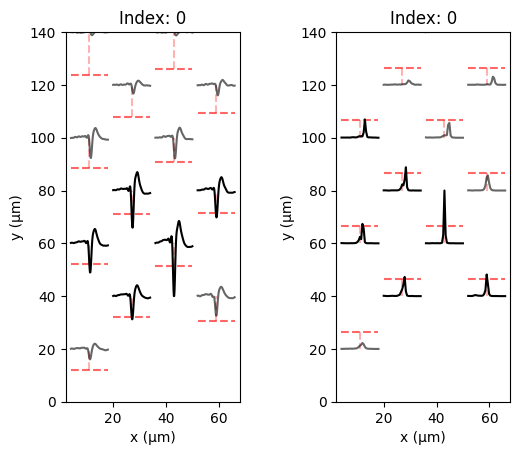

680


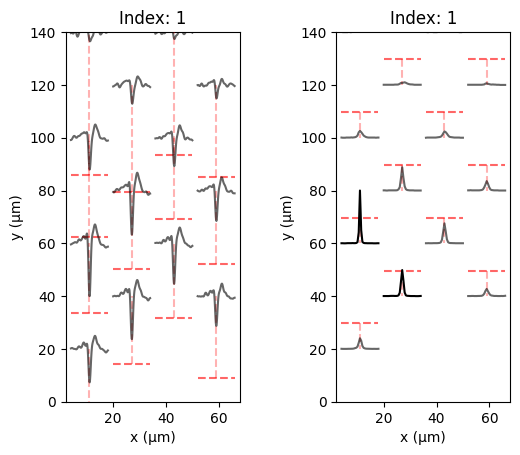

713


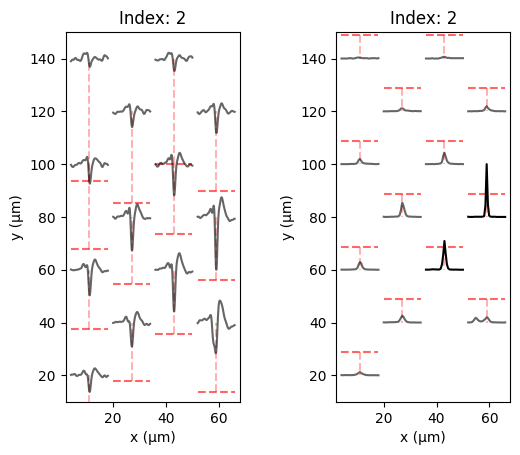

102


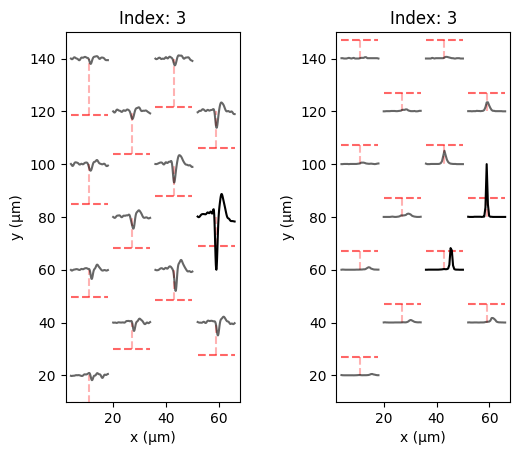

363


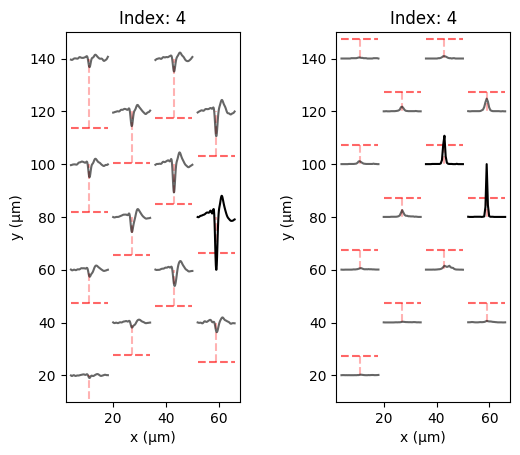

1104


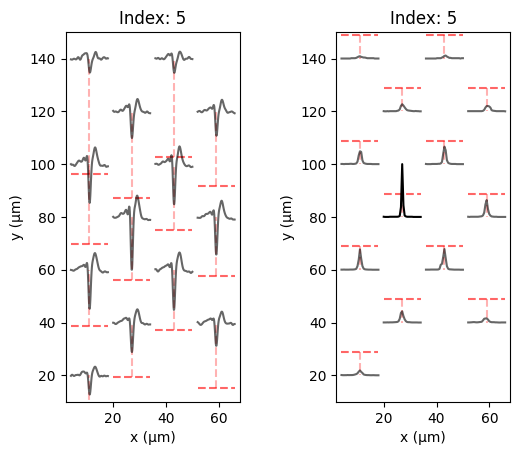

1754


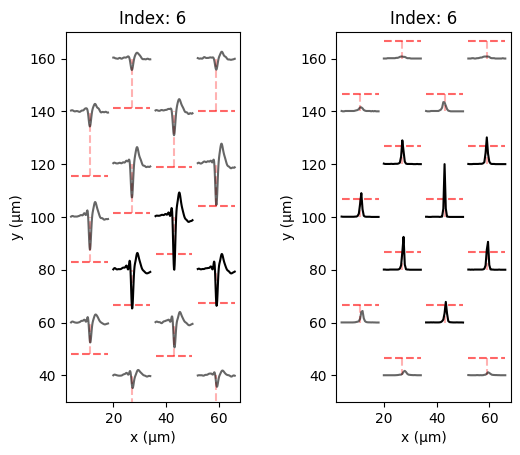

5731


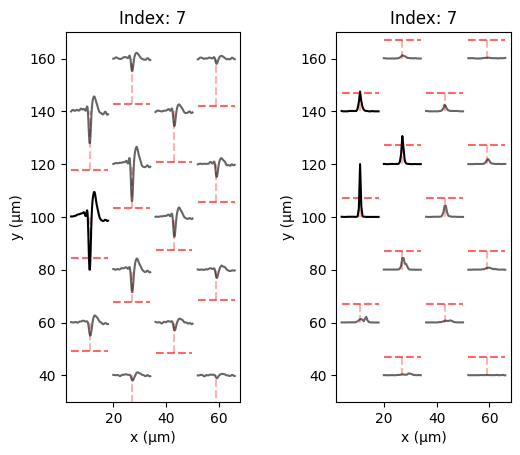

4373


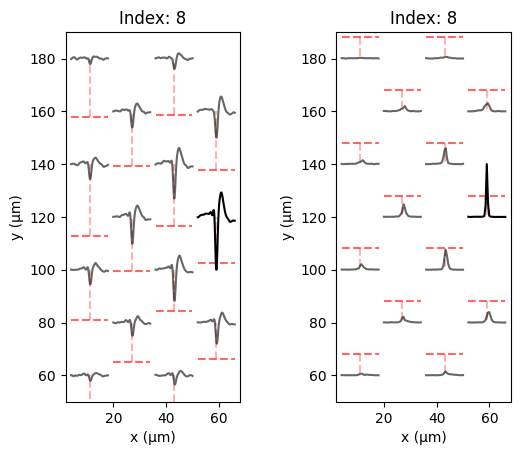

5583


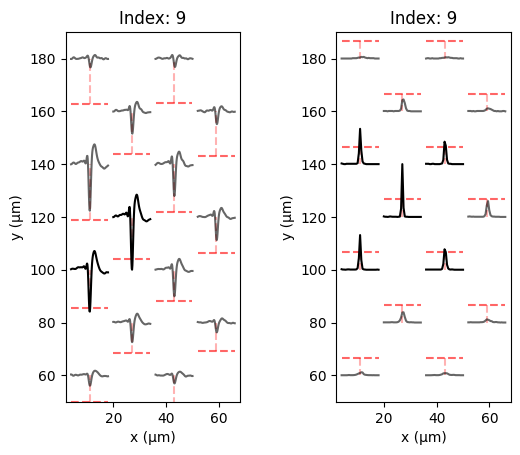

4169


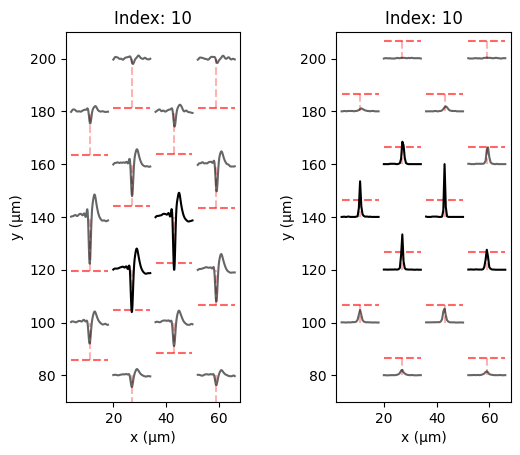

311


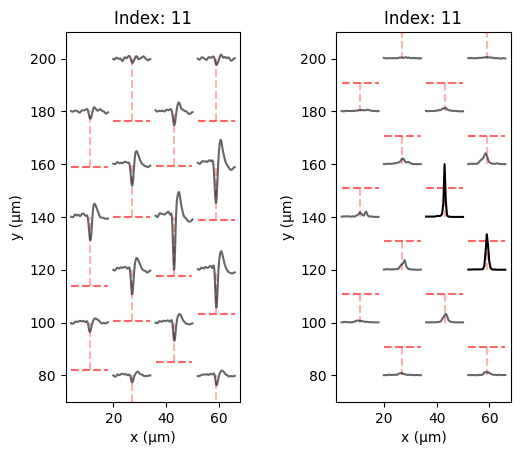

13343


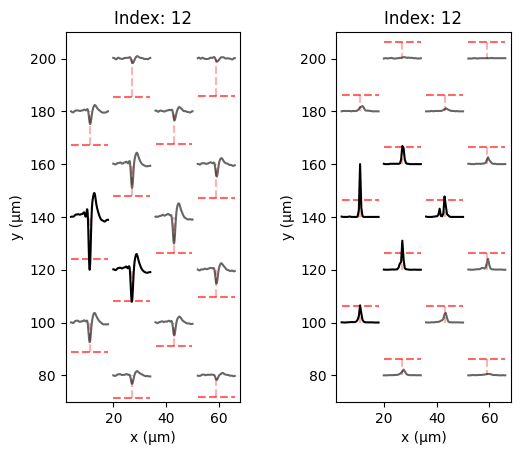

319


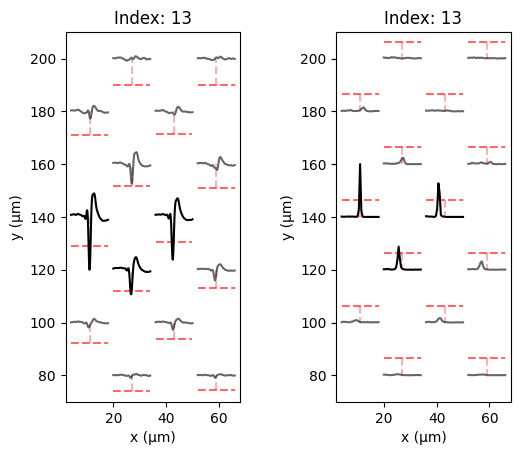

189


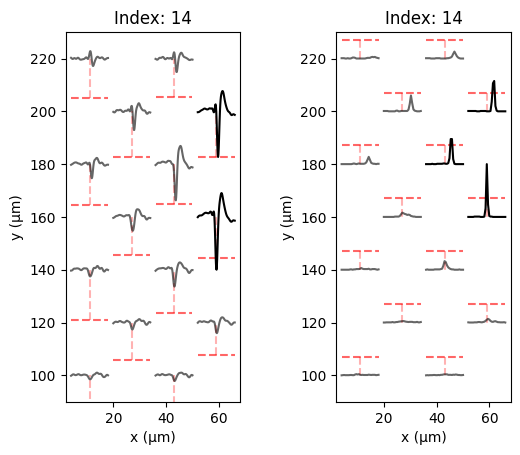

In [307]:
# Plot clusters
# roots = [Unit(0, [c[2] for c in coc_matrix], 17, None)]
# roots[0].elecs = [17]
# elec_clusters = merged_clusters
elec_clusters = all_coc_clusters[5:20]
ref_elec = root_elec

# setup_coc_clusters(elec_clusters)

# for cluster in elec_clusters:
#     all_elec_probs = extract_detection_probs(cluster)
#     elec_probs = np.mean(all_elec_probs, axis=0)
    
#     cluster.latencies = np.argmax(elec_probs, axis=1) - elec_probs.shape[1]//2
#     cluster.all_elec_probs = all_elec_probs
#     cluster.elec_probs = elec_probs
#     cluster.elecs = np.flatnonzero(np.max(elec_probs, axis=1)>=prob_thresh)

units = []
def get_unit_templates(cluster_idx):
    cluster = elec_clusters[cluster_idx]
    unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.root_elec, recording=RECORDING)
    return cluster_idx, unit.get_templates(ms_before=2, ms_after=2)

with Pool(processes=20) as pool:
    tasks = range(len(elec_clusters))
    for cluster_idx, templates in tqdm(pool.imap(get_unit_templates, tasks), total=len(tasks)):
        cluster = elec_clusters[cluster_idx]
        unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.root_elec, recording=RECORDING)
        unit.templates = templates
        units.append(unit)
# Plot
# kwargs = None
# for i, unit in enumerate(units):
#     print(len(unit.spike_train))
#     if kwargs is None:
#         kwargs = unit.plot(chans_rms=CHANS_RMS)
#     else:
#         kwargs = unit.plot(**kwargs) 
#     plt.show()

# Plot with detection probabilities

amp_kwargs = None
for i, unit in enumerate(units):
    amp_kwargs = None
    elec_probs = elec_clusters[i].elec_probs # extract_detection_probs(elec_clusters[i])
    
    # print(f"comp elec: {19}, loc={elec_locs[19]}")
    # print(f"comp elec: {elec_clusters[i].elec}, loc={elec_locs[elec_clusters[i].elec]}")
    print(len(unit.spike_train))
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit, elec_probs)
    else:
        plot_elec_probs(unit, elec_probs, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()
    
    # Plot latency histogram
    # plt.hist([c[0]*30 for c in elec_clusters[i].cocs], bins=91)
    # plt.show()

In [305]:
amp_kwargs = None
for i, unit in enumerate(units[4:15]):
    amp_kwargs = None
    elec_probs = elec_clusters[i].elec_probs # extract_detection_probs(elec_clusters[i])
    
    # print(f"comp elec: {19}, loc={elec_locs[19]}")
    # print(f"comp elec: {elec_clusters[i].elec}, loc={elec_locs[elec_clusters[i].elec]}")
    print(len(unit.spike_train))
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit, elec_probs)
    else:
        plot_elec_probs(unit, elec_probs, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()
    
    # Plot latency histogram
    # plt.hist([c[0]*30 for c in elec_clusters[i].cocs], bins=91)
    # plt.show()

764


AttributeError: 'Unit' object has no attribute 'elecs'

In [ ]:
# Get unit templates for plotting (only needed for manual testing)

elec_clusters = all_roots  # test2  # all_props[:10]
units = []

def get_unit_templates(cluster_idx):
    cluster = elec_clusters[cluster_idx]
    unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.elecs[0], recording=RECORDING)
    return cluster_idx, unit.get_templates()

with Pool(processes=20) as pool:
    tasks = range(len(elec_clusters))
    for cluster_idx, templates in tqdm(pool.imap(get_unit_templates, tasks), total=len(tasks)):
        cluster = elec_clusters[cluster_idx]
        unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.elecs[0], recording=RECORDING)
        unit.templates = templates
        units.append(unit)
        
# region Get units without parallel processing
# units = []
# for i, cluster in enumerate(elec_clusters[1:]):
#     unit = Unit(idx=i+1, spike_train=cluster.spike_train, channel_idx=0, recording=RECORDING)
#     unit.set_templates()
#     # wfs = []
#     # for _ in range(300):
#     #     wfs.append(unit.get_waveforms())
#     # wfs = np.array(wfs).transpose(1, 0, 2)
    
#     units.append(unit)
# endregion

# Plot
# kwargs = None
# for i, unit in enumerate(units):
#     print(len(unit))
#     # display(elec_clusters[i].df)
    
#     if kwargs is None:
#         kwargs = unit.plot(chans_rms=CHANS_RMS)
#     else:
#         unit.plot(**kwargs)
    
#     plt.show()

100%|██████████| 242/242 [01:21<00:00,  2.99it/s]


### Improve merging by looking at roots on each electrode

In [ ]:
# Need to have task be a single unit since elecs have different number of roots (task cannot be all roots on an elec)
def get_unit(task):
    elec, idx, root = task
    
    unit = Unit(idx=idx, spike_train=root.spike_train, channel_idx=root.elecs[0], recording=RECORDING)    
    unit.set_templates()
    unit.recording = None  # h5py objects cannot be pickled
    return elec, unit

elecs_units = [[] for _ in range(len(all_roots_with_footprints))]
with Pool(processes=20) as pool:
    tasks = []
    for e, roots in enumerate(all_roots_with_footprints):
        for i, root in enumerate(roots):
            tasks.append((e, i, root))
            
    for elec, unit in tqdm(pool.imap(get_unit, tasks), total=len(tasks)):
        unit.recording = RECORDING
        elecs_units[elec].append(unit)        

100%|██████████| 299/299 [01:40<00:00,  2.98it/s]


In [ ]:
for i, unit in enumerate(units[:5]):
    print(len(unit))
    # display(elec_clusters[i].df)
    unit.plot(chans_rms=CHANS_RMS)
    # if kwargs is None:
    #     kwargs = unit.plot(chans_rms=CHANS_RMS)
    # else:
    #     unit.plot(**kwargs)
    
    plt.show()

In [ ]:
elec_ind_with_roots = [elec for elec in range(len(all_roots_with_footprints)) if len(all_roots_with_footprints[elec]) >= 1]
print(elec_ind_with_roots)

[0, 3, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 36, 40, 41, 42, 44, 46, 47, 49, 50, 51, 52, 53, 73, 75, 77, 79, 80, 81, 82, 83, 86, 87, 90, 95, 97, 98, 121, 123, 124, 132, 135, 137, 139, 140, 141, 143, 144, 145, 146, 147, 149, 150, 151, 152, 154, 155, 156, 158, 159, 160, 162, 199, 202, 203, 204, 205, 206, 207, 208, 209, 211, 215, 217, 218, 221, 227, 238]





Elec: 75, loc=[  11. 1020.]


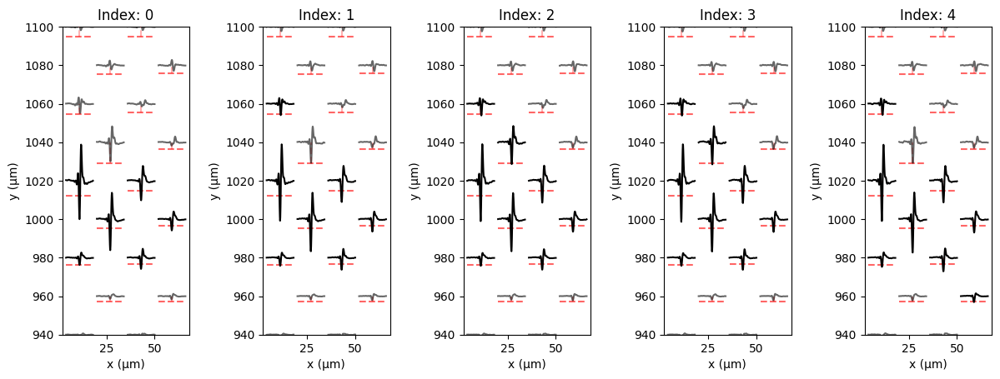

#spikes: [394, 1680, 1389, 1030, 458]

Formed root 1 into prop 0
Merged root 2 with prop 0 [1]
Merged root 3 with prop 0 [1, 2]
Merged root 4 with prop 0 [1, 2, 3]
Merged root 0 with prop 0 [1, 2, 3, 4]

Formed 1 props
prop 0: [1, 2, 3, 4, 0]
#spikes: [2441]


75 [-0.0051, 0.0502, 1.619, 0.1636, 12.5126]
73 [-0.0107, 0.0352, 1.3069, 0.1669, 16.4663]
74 [-0.0069, 0.0472, 0.8254, 0.1214, 10.1385]
77 [0.0144, 0.0752, 0.7733, 0.1594, 4.4101]

75 [0.0, 0.0, 1.5813, 0.102, 13.1406]
73 [-0.015, 0.0166, 1.2572, 0.0867, 17.0314]
74 [-0.01, 0.0153, 0.8417, 0.0845, 11.1168]
77 [0.0242, 0.0263, 0.8297, 0.0987, 5.0877]

75 [-0.0001, 0.0021, 1.5778, 0.1011, 13.2675]
73 [-0.0147, 0.0166, 1.2459, 0.0903, 17.0789]
77 [0.0233, 0.0153, 0.8457, 0.0874, 5.2477]
74 [-0.0117, 0.0159, 0.8453, 0.083, 11.2975]

75 [0.0, 0.0, 1.5692, 0.1029, 13.4034]
73 [-0.0155, 0.0166, 1.2364, 0.0952, 17.2156]
74 [-0.0113, 0.0158, 0.8565, 0.0848, 11.627]
77 [0.0226, 0.0157, 0.8457, 0.1033, 5.3299]

75 [0.0, 0.0, 1.5528, 0.1171

In [ ]:
# For each electrode, look at roots to see how to improve merging
# elec_idx = elec_ind_with_roots[7]
##
for elec_idx in elec_ind_with_roots[38:39]:
    print("\n\n")
    roots = all_roots_with_footprints[elec_idx]
    units = elecs_units[elec_idx]

    print(f"Elec: {elec_idx}, loc={RECORDING.get_channel_locations()[elec_idx]}")
    fig, axes = plt.subplots(1, len(roots), figsize=(3*len(roots), 4.8))
    axes = np.atleast_1d(axes)

    kwargs = None
    for a, unit in enumerate(units):
        if kwargs is None:
            kwargs = unit.plot(chans_rms=CHANS_RMS, axis=axes[a])
        else:
            unit.plot(**kwargs, axis=axes[a])
    plt.show()
    
    print(f"#spikes: {[len(unit.spike_train) for unit in units]}\n")
        
    merges = merge_roots(deepcopy(roots), verbose=True)
    print(f"#spikes: {[len(merge.spike_train) for merge in merges]}\n")
    
    for root in roots:
        print()
        for elec in root.prop_elecs_:
            print(elec, [round(s, 4) for s in root.footprint_stats_[elec]])

In [ ]:
for elec in merges[0].prop_elecs_:
    print(elec, [round(s, 4) for s in merges[0].footprint_stats_[elec]])

75 [-0.0008, 0.0202, 1.5791, 0.1182, 0.0]
73 [-0.0145, 0.0208, 1.2618, 0.1102, 0.0]
74 [-0.0101, 0.024, 0.8432, 0.0957, 0.0]
77 [0.0217, 0.0351, 0.8232, 0.1167, 0.0]


In [ ]:
for root in roots:
    print()
    print(len(root.spike_train))
    print(root.prop_elecs_)
    for elec in root.prop_elecs_:
        print(elec, [round(s, 2) for s in root.footprint_stats_[elec]])


526
[3, 6, 4, 5, 8, 2]
3 [0.0, 0.0, 1.65, 0.13, 24.49]
6 [0.09, 0.02, 1.13, 0.08, 16.04]
4 [0.08, 0.02, 0.87, 0.08, 13.98]
5 [0.03, 0.02, 0.71, 0.07, 10.86]
8 [0.14, 0.08, 0.64, 0.14, 7.15]
2 [0.06, 0.02, 0.64, 0.08, 10.51]

595
[3, 6, 4, 5, 8, 2]
3 [0.0, 0.0, 1.64, 0.13, 24.45]
6 [0.09, 0.02, 1.13, 0.1, 16.16]
4 [0.08, 0.02, 0.87, 0.1, 14.07]
5 [0.03, 0.02, 0.71, 0.09, 10.93]
8 [0.14, 0.08, 0.64, 0.15, 7.26]
2 [0.06, 0.02, 0.64, 0.1, 10.55]


In [ ]:
len(set(roots[0].spike_train).intersection(roots[1].spike_train))

525

In [ ]:
for i, unit in enumerate(units):
    print(len(unit))
    # display(elec_clusters[i].df)
    
    kwargs = unit.plot(chans_rms=CHANS_RMS)

    plt.show()

### OLD Merge

In [ ]:
all_props = []
for roots in tqdm(all_roots_with_footprints):
    if len(roots) <= 1:
        all_props += roots
    else:
        all_props += merge_roots(roots)

# Total number of propagations
print(len(all_props))

  0%|          | 0/248 [00:00<?, ?it/s]

100%|██████████| 248/248 [00:00<00:00, 447.64it/s]

103


In [ ]:
new_props = merge_roots(all_props, verbose=True)

Merged 89 with 90
Merged 85 with 91
Merged 85+[91] with 89+[90]
Merged 81 with 82
Merged 72 with 74
Merged 85+[91, 89, 90] with 87
Merged 55 with 57
Merged 97 with 98
Merged 20 with 22
Merged 45 with 47
Merged 45+[47] with 46
Merged 59 with 60
Merged 68 with 71
Merged 32 with 34
Merged 40 with 41
Merged 4 with 6
Merged 17 with 19
Merged 86 with 88
Merged 7 with 8
Merged 10 with 12
Merged 93 with 96
Merged 59+[60] with 61
Merged 78 with 80
Merged 10+[12] with 13
Merged 10+[12, 13] with 11
Merged 63 with 65
Merged 93+[96] with 95
Merged 55+[57] with 56
Merged 25 with 26
Merged 24 with 25+[26]
Merged 73 with 75
Merged 37 with 38
Merged 35 with 37+[38]
Merged 35+[37, 38] with 36
Merged 85+[91, 89, 90, 87] with 86+[88]
Merged 77 with 79
Merged 28 with 29
Merged 21 with 24+[25, 26]
Merged 81+[82] with 83

Formed 64 props
prop 0: 0
prop 1: 1
prop 2: 2
prop 3: 3
prop 4: 4,[6]
prop 5: 5
prop 6: 7,[8]
prop 7: 9
prop 8: 10,[12, 13, 11]
prop 9: 14
prop 10: 15
prop 11: 16
prop 12: 17,[19]
prop 13: 

In [ ]:
# Look at footprints of units that are merged
for idx in [85, 91, 89, 90]:
    prop = all_props[idx]
    unit = Unit(idx, prop.spike_train, prop.prop_elecs_[0], RECORDING)
    unit.plot(chans_rms=CHANS_RMS)
    plt.show()

In [ ]:
# Get units of props for plotting (only needed for manual testing)

elec_clusters = all_props
units = []

def get_unit_templates(cluster_idx):
    cluster = elec_clusters[cluster_idx]
    unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.elecs[0], recording=RECORDING)
    return cluster_idx, unit.get_templates()

with Pool(processes=20) as pool:
    tasks = range(len(elec_clusters))
    for cluster_idx, templates in tqdm(pool.imap(get_unit_templates, tasks), total=len(tasks)):
        cluster = elec_clusters[cluster_idx]
        unit = Unit(idx=cluster_idx, spike_train=cluster.spike_train, channel_idx=cluster.elecs[0], recording=RECORDING)
        unit.templates = templates
        units.append(unit)

# Plot
kwargs = None
for i, unit in enumerate(units):
    unit.plot(chans_rms=CHANS_RMS)    
    plt.show()

#### Additional testing

In [ ]:
# # Convert ElecClusters in all_props to F.Propagations --> UNFINISHED
# prop_rms_thresh = 4.5  # Elecs need to cross this to be a part of the final propagation

# import pandas as pd

# merged_propagations = []
# for prop in all_props:
#     # Get elecs that cross 4.5RMS
#     elecs_sorted = np.argsort(-prop.footprint_stats_[:, 4])  # - to sort in descending order
#     dataframe = []
#     for elec in elecs_sorted:
#         if prop.footprint_stats_[elec, 4] >= prop_rms_thresh:
#             dataframe.append((elec, prop.footprint_stats[elec, 0], 100, 1))
#         else:
#             break
#     dataframe = pd.DataFrame(dataframe, columns=["ID", "latency", "cooccurrences", "ccg_ratio"])
#     dataframe = dataframe.astype({"ID": int, "latency": float, "cooccurrences": int, "ccg_ratio": float})
    
#     propagation = F.Propagation(dataframe=dataframe, recording=RECORDING)
#     propagation.mean_amps_all = prop.footprint_stats_[:, 4] * CHANS_RMS
#     merged_propagations.append(propagation)

# Convert Units in units to F.Propagations
prop_rms_thresh = 4.5  # Elecs need to cross this to be a part of the final propagation

import pandas as pd

merged_propagations = []
for prop in all_props:
    # Get elecs that cross 4.5RMS
    elecs_sorted = np.argsort(-prop.footprint_stats_[:, 4])  # - to sort in descending order
    dataframe = []
    for elec in elecs_sorted:
        if prop.footprint_stats_[elec, 4] >= prop_rms_thresh:
            dataframe.append((elec, prop.footprint_stats[elec, 0], 100, 1))
        else:
            break
    dataframe = pd.DataFrame(dataframe, columns=["ID", "latency", "cooccurrences", "ccg_ratio"])
    dataframe = dataframe.astype({"ID": int, "latency": float, "cooccurrences": int, "ccg_ratio": float})
    
    propagation = F.Propagation(dataframe=dataframe, recording=RECORDING)
    propagation.mean_amps_all = prop.footprint_stats_[:, 4] * CHANS_RMS
    merged_propagations.append(propagation)

AttributeError: 'ElecCluster' object has no attribute 'footprint_stats_'

In [ ]:
# for elec in clusteri_elecs:
#     # Check latency and rel amp overlap
#     print(F.test_mean_std_overlap(*clusteri.elecs_stats[elec][:2], *clusterj.elecs_stats[elec][:2], 1),
#           F.test_mean_std_overlap(*clusteri.elecs_stats[elec][2:4], *clusterj.elecs_stats[elec][2:4], 1))

True True
False False
True True


2619
363
178


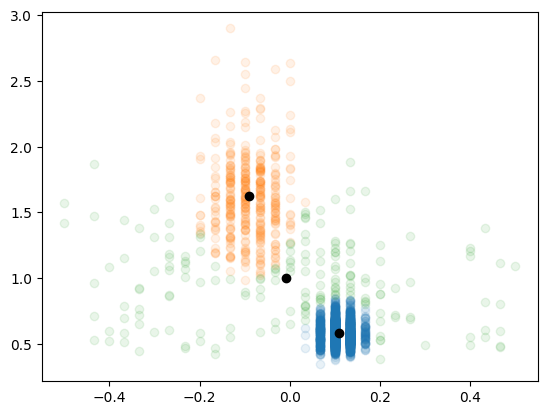

In [ ]:
# latency_amp_matrix = coc_matrix[:, [0, 1]]
# F.plot_gmm(elec_clusters[1].gmms[-1], latency_amp_matrix)
# plt.show()

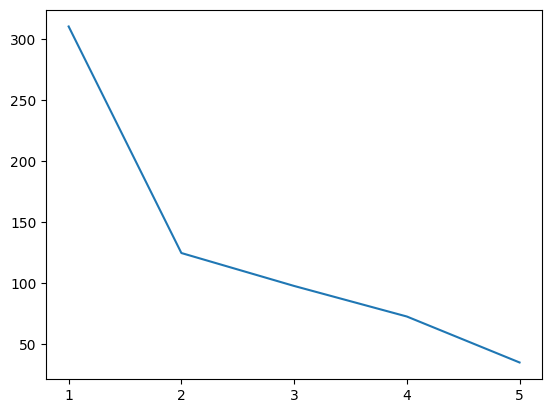

In [ ]:
# Plot within-cluster sum of squares vs num clusters
# from sklearn.metrics import pairwise_distances_argmin_min
# k_values = range(1, 6)
# all_wcss = []

# for k in k_values:
#     gmm = GaussianMixture(n_components=k, init_params="kmeans", covariance_type="diag", tol=1e-9, max_iter=1000, random_state=101).fit(latency_amp_matrix)
#     cluster_labels = gmm.predict(latency_amp_matrix)
#     distances_to_centers = pairwise_distances_argmin_min(latency_amp_matrix, gmm.means_)[1]
#     wcss = np.sum(distances_to_centers ** 2)
#     all_wcss.append(wcss)

# plt.plot(k_values, all_wcss)
# plt.xticks(k_values)
# plt.show()

## New idea to form propagations - dead end
This method: form clusters based on which electrodes coactivate
Problem with this method: electrode latencies and relative amplitudes are not accounted for.

In [ ]:
ref_elec=17
max_elec_dist=100
min_cocs=300
time_frame=(0, 5*60*1000)
##

coc_dict = load_coc_dict(ref_elec)
if time_frame is not None:
    start_ms, end_ms = time_frame
    new_coc_dict = {}
    for (root_time, root_amp), cocs in coc_dict.items():
        if start_ms <= root_time <= end_ms:
            new_cocs = []
            for elec, time, amp in cocs:
                if start_ms <= time <= end_ms:
                    new_cocs.append((elec, time, amp))
            if len(new_cocs) > 0:
                new_coc_dict[(root_time, root_amp)] = new_cocs
    coc_dict = new_coc_dict

coc_patterns = {}
for (ref_time, ref_amp), cocs in tqdm(coc_dict.items(), total=len(coc_dict)):
    elecs = []
    filt_cocs = []
    for c in cocs:
        if calc_elec_dist(ref_elec, c[0]) <= 150:
            filt_cocs.append(c)           
            elecs.append(c[0])
    elecs = tuple(sorted(elecs))
    if elecs not in coc_patterns:
        coc_patterns[elecs] = filt_cocs
    else:
        coc_patterns[elecs] += filt_cocs
filt_coc_patterns = {elecs: cocs for elecs, cocs in coc_patterns.items() if len(cocs) >= min_cocs}

  0%|          | 0/8230 [00:00<?, ?it/s]

100%|██████████| 8230/8230 [00:00<00:00, 15546.56it/s]


In [ ]:
filt_coc_patterns[list(filt_coc_patterns.keys())[0]]

In [ ]:
all_spike_trains = []
for cocs in filt_coc_patterns.values():
    all_spike_trains.append([c[1] for c in cocs])
    
units = []
for i, (elecs, cocs) in enumerate(filt_coc_patterns.items()):
    unit = Unit(i, [c[1] for c in cocs], ref_elec, RECORDING)
    unit.elecs = elecs
    units.append(unit)

In [ ]:
# Plot clusters
def extract_templates(idx):
    unit = units[idx]
    return idx, unit.get_templates(), extract_detection_probs(unit)

with Pool(processes=12) as pool:
    for idx, templates, elec_probs in tqdm(pool.imap(extract_templates, range(len(all_spike_trains))), total=len(all_spike_trains)):
        units[idx].templates = templates
        units[idx].elec_probs = elec_probs
        
# Plot with detection probabilities
amp_kwargs = None
for i, unit in enumerate(units):
    amp_kwargs = None    
    print(len(unit.spike_train), unit.elecs)
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit, unit.elec_probs)
    else:
        plot_elec_probs(unit, unit.elec_probs, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()

500 (13, 15, 18, 19)


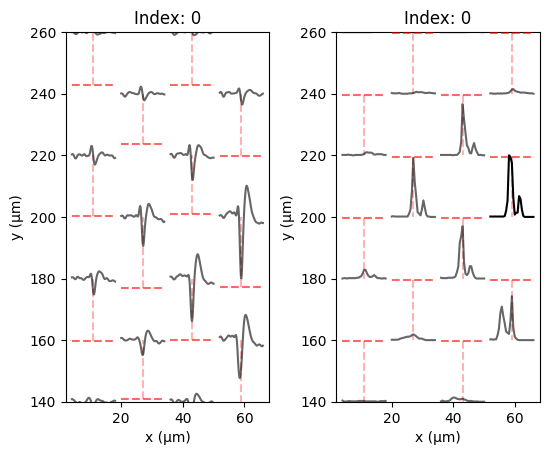

530 (13, 15)


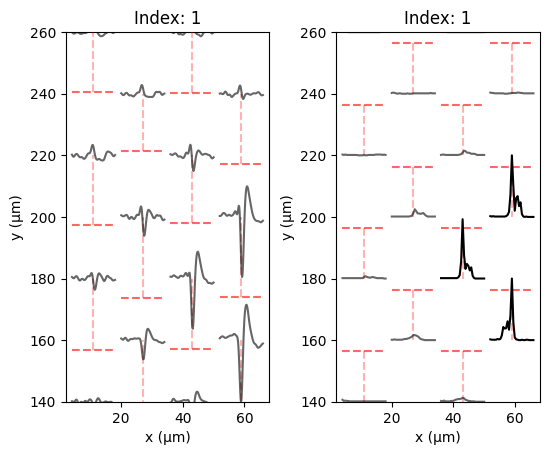

414 (13, 15, 18)


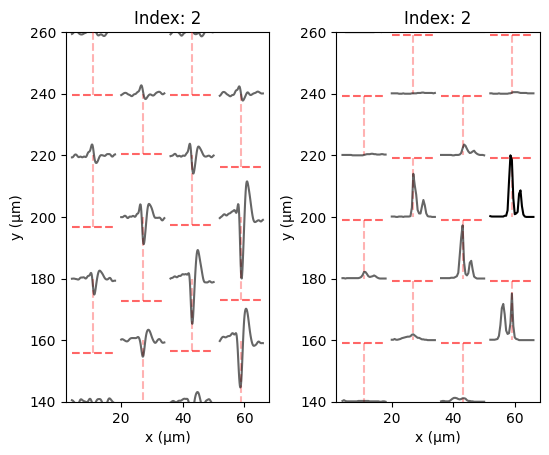

400 (13, 15, 16, 18, 19)


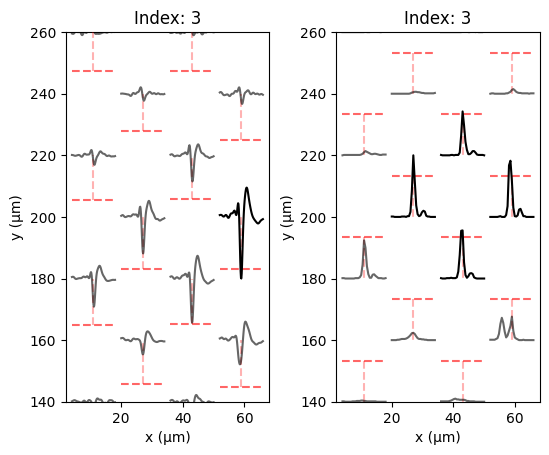

588 (13, 14, 15, 16, 18, 19)


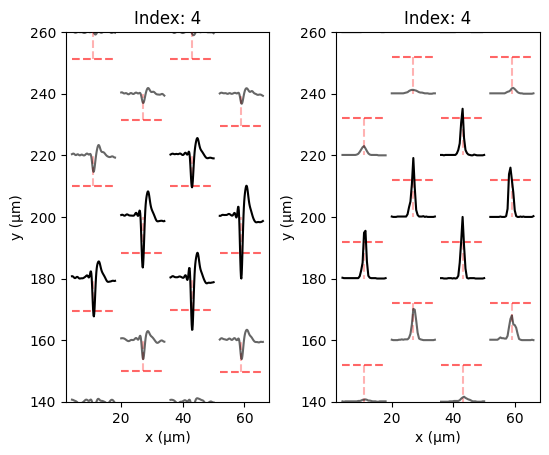

387 (13, 14, 15, 16, 18, 19, 20, 21, 22)


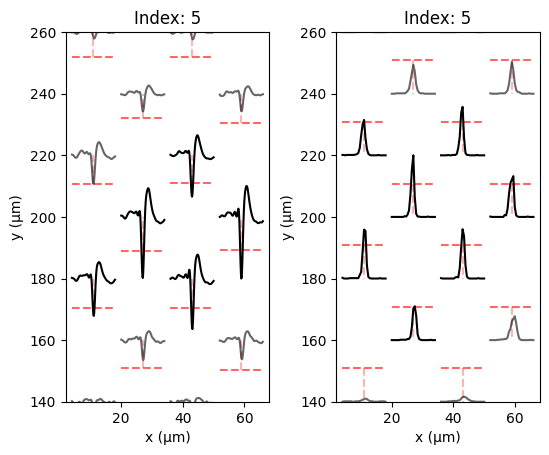

630 (13, 14, 15, 16, 18, 19, 20)


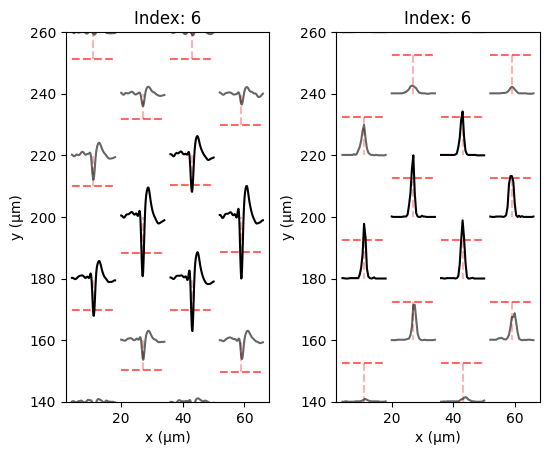

536 (13, 14, 15, 16, 18, 19, 20, 22)


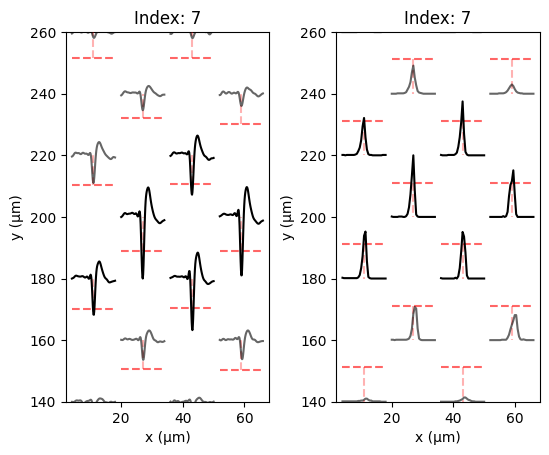

316 (15, 16, 18, 19)


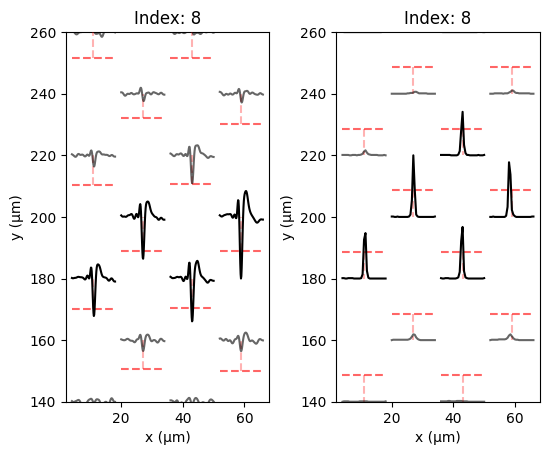

In [ ]:
amp_kwargs = None
for i, unit in enumerate(units):
    amp_kwargs = None    
    print(len(unit.spike_train), unit.elecs)
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit, unit.elec_probs)
    else:
        plot_elec_probs(unit, unit.elec_probs, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()

## Periphery electrodes

#### OLD Finding periphery elecs
For each propagation:
    For each non-main elec:
    1. Find probability distribution of detecting spike on elec
        a. For each cooccurrence in cluster, find output probabilities of across all electrodes. (Center on peak?)
    2. If probability distribution is good enough (high enough peak?), elec becomes periphery elec

#### Do same as merging but with individual spikes
Use the backbone's probability scores though

In [10]:
# Setup to handle model's outputs
MODEL_OUTPUTS_PATH = "/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/outputs.npy"
FRONT_BUFFER = 40  # Model's front sample buffer

def rec_ms_to_output_frame(ms):
    # Convert time (in ms) in recording to frame in model's outputs
    return round(ms * 30) - FRONT_BUFFER

def sigmoid(x):
    # return np.where(x>=0,
    #                 1 / (1 + np.exp(x)),
    #                 np.exp(x) / (1+np.exp(x))
    #                 )
    return np.exp(x) / (1+np.exp(x))  # Positive overflow is not an issue because DL does not output large positive values (only large negative)


In [37]:
TRACES_FILT_PATH = "/data/MEAprojects/dandi/000034/sub-mouse412804/traces_filt.npy"
def extract_waveforms(prop, num_cocs=500, ms_before=0.5, ms_after=0.5):
    """
    Parameters
    ----------
    num_cocs: int
        Number of cocs to sample to extract detection probabilities
    ms_before and ms_after: float
        Window for extracting probabilities
    """
    np.random.seed(231)

    # Load outputs 
    outputs = np.load(TRACES_FILT_PATH, mmap_mode="r")  # Load each time to allow for multiprocessing
    num_chans, total_num_frames = outputs.shape

    # Load spike train
    spike_train = prop.spike_train
    if num_cocs is not None and len(spike_train) > num_cocs:
        spike_train = np.random.choice(spike_train, size=num_cocs, replace=False)

    # Extract waveforms
    n_before = round(ms_before * samp_freq)
    n_after = round(ms_after * samp_freq)
    all_waveforms = np.zeros((len(spike_train), num_chans, n_before+n_after+1), dtype="float32")  # (n_chans, n_samples)
    for i, time_ms in enumerate(spike_train):
        time_frame = round(time_ms * samp_freq)
        if time_frame-n_before < 0 or time_frame+n_after+1 > total_num_frames :  # Easier and faster to ignore edge cases than to handle them
            continue
        
        window = outputs[:, time_frame-n_before:time_frame+n_after+1]
        all_waveforms[i] = window
    # return np.mean(all_waveforms, axis=0)
    return all_waveforms

def extract_detection_probs(prop, num_cocs=300, ms_before=0.5, ms_after=0.5):
    """
    Parameters
    ----------
    num_cocs: int
        Number of cocs to sample to extract detection probabilities
    ms_before and ms_after: float
    """
    np.random.seed(231)

    # Load outputs 
    outputs = np.load(MODEL_OUTPUTS_PATH, mmap_mode="r")  # Load each time to allow for multiprocessing
    num_chans, total_num_frames = outputs.shape

    # Load spike train
    spike_train = prop.spike_train
    if num_cocs is not None and len(spike_train) > num_cocs:
        spike_train = np.random.choice(spike_train, size=num_cocs, replace=False)

    # Extract probabilities
    n_before = round(ms_before * samp_freq)
    n_after = round(ms_after * samp_freq)
    all_elec_probs = np.zeros((len(spike_train), num_chans, n_before+n_after+1), dtype="float16")  # (n_chans, n_samples) float16: Model's output is float16
    for i, time_ms in enumerate(spike_train):
        time_frame = rec_ms_to_output_frame(time_ms)
        if time_frame-n_before < 0 or time_frame+n_after+1 > total_num_frames :  # Easier and faster to ignore edge cases than to handle them
            continue
        
        window = outputs[:, time_frame-n_before:time_frame+n_after+1]
        all_elec_probs[i] = sigmoid(window)
    # elec_probs /= len(spike_train)
    return all_elec_probs

def plot_elec_probs(unit, elec_probs=None, idx=0,
                    loc_prob_thresh=17.5,
                    amp_kwargs=None, prob_kwargs=None):
    if not isinstance(unit, Unit):
        unit = Unit(idx=idx, spike_train=unit.spike_train, channel_idx=unit.root_elec, recording=RECORDING)
        unit.set_templates()
        
    if elec_probs is None:
        elec_probs = np.mean(extract_detection_probs(unit), axis=0)
    
    # Plot elec probs on top of each other
    # plt.plot(elec_probs[[0, 2, 4, 1, 3], :].T)
    # plt.show()
    
    prob_chans_rms = [-loc_prob_thresh/5/100]*RECORDING.get_num_channels()  # Extra modifiers to loc_prob_thresh make thresh line visible in plot
    prob_chans_rms = np.array(prob_chans_rms)

    fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(3.2*2, 4.8))

    amp_kwargs = {"chans_rms": CHANS_RMS} if amp_kwargs is None else amp_kwargs
    amp_kwargs = unit.plot(axis=ax0, **amp_kwargs)
    
    prob_kwargs = {"chans_rms": prob_chans_rms} if prob_kwargs is None else prob_kwargs
    prob_kwargs = unit.plot(axis=ax1, wf=elec_probs, **prob_kwargs)
    
    return amp_kwargs, prob_kwargs

### Detect spikes

In [88]:
def fix_isi_viols(spike_train, isi_viol=1.5):
    # Return spike_train without any isi violations
    spike_train = np.sort(spike_train)
    new_spike_train = [spike_train[0]]
    for spike in spike_train[1:]:
        if spike - new_spike_train[-1] > isi_viol:
            new_spike_train.append(spike)
    return new_spike_train

In [46]:
# As a first pass, only detect spikes with DL detection with largest ampliutde on first elec
# (since DL detects so many spikes, this is probably fine)

from math import ceil
def detect_spikes(cluster: CocCluster, time_frame=None,
                  isi_viol=1.5, 
                  elec_prob_thresh=0.1, min_coacs_r=0.5,
                  rel_to_closest_elecs=3, 
                  max_latency_diff=2.5, max_rel_amp_diff=0.35): 
    """
    Parameters
    ----------
        elec_prob_thresh:
            Prob on elec needs to cross this to count as coactivation
        min_coacs_r: 
            num_coacs_r * (num elecs in cluster that cross elec_prob_thresh) is min #elec_coacs 
            for spike to be considered as part of cluster
    """
    
    # Load model outputs and recording traces   
    outputs = np.load(MODEL_OUTPUTS_PATH, mmap_mode="r")
    traces = np.load(TRACES_FILT_PATH, mmap_mode="r")
    
    # Load cooccurrence dictionary and nearby electrodes
    coc_dict = load_coc_dict(cluster.root_elec, time_frame=time_frame)
    nearby_elecs = [cluster.root_elec] + get_nearby_elecs(cluster.root_elec)
    
    # Set elec weights
    elec_probs = np.max(cluster.elec_probs[nearby_elecs], axis=1)
    elec_weights = elec_probs / np.sum(elec_probs)
    
    # Set main elecs
    main_elecs = np.flatnonzero(elec_probs >= elec_prob_thresh)  # NOTE: these ind are after indexing elecs with [nearby_elecs]
    min_coacs_n = ceil(min_coacs_r * main_elecs.size)
    
    # Load cluster stats
    cluster_latencies = cluster.latencies[nearby_elecs]
    cluster_rel_amps = cluster.mean_amps[nearby_elecs]
    cluster_rel_amps = cluster_rel_amps / np.mean(cluster_rel_amps[:rel_to_closest_elecs])
    
    # Calculate extraction window n_before and n_after
    #+1 for good measure
    n_before = round(np.min(cluster_latencies)) + ceil(max_latency_diff) + 1  # Use these signs so n_before is positive
    n_before = max(1, n_before)  # Ensure at least one frame n_before
    n_after = round(np.max(cluster_latencies)) + ceil(max_latency_diff) + 1
    n_after = max(1, n_after)  
    
    spike_train = []
    last_spike = -np.inf
    for (root_time, root_amp), cocs in coc_dict.items():
        if root_time - last_spike <= isi_viol:
            continue
        
        # Extract latencies
        output_frame = rec_ms_to_output_frame(root_time)
        output_window = outputs[nearby_elecs, max(0, output_frame-n_before):output_frame+n_after+1]
        latencies = np.argmax(output_window, axis=1) 
        
        # Extract probabilities
        elec_probs = sigmoid(output_window[main_elecs, latencies[main_elecs]])
        if sum(elec_probs >= elec_prob_thresh) < min_coacs_n:
            continue
        
        # Extract rel amps
        rec_frame = round(root_time * samp_freq)
        rec_window = traces[nearby_elecs, max(0, rec_frame-n_before):rec_frame+n_after+1]  # Not need max for end of slice since numpy ok with it
        amps = np.abs(rec_window[range(len(latencies)), latencies])
        rel_amps = amps / np.mean(amps[:rel_to_closest_elecs])        
 
        # Calculate latency and rel amp differences
        latency_diff = np.sum(np.abs(cluster_latencies - (latencies - n_before)) * elec_weights)
        rel_amp_diff = np.abs(cluster_rel_amps - rel_amps) / cluster_rel_amps
        rel_amp_diff = np.sum((rel_amp_diff * elec_weights))
        
        # Determine if spike is detected
        if latency_diff <= max_latency_diff and rel_amp_diff <= max_rel_amp_diff:
            spike_train.append(root_time)
            last_spike = root_time
        
            # if len(spike_train) > 0:
            #     print(elec_probs)
            #     print(latency_diff, rel_amp_diff)
            #     unit = Unit(0, [root_time], cluster.root_elec, RECORDING)
            #     plot_elec_probs(unit, np.mean(extract_detection_probs(unit), axis=0))
            #     plt.show()
            
            #     return
        
    return spike_train
    
# coc_cluster = all_coc_clusters[15]
# spike_train = detect_spikes(coc_cluster, time_frame=TIME_FRAME_5_10)
# print(len(coc_cluster.spike_train))
# print(len(spike_train))

def job(coc_cluster):
    return coc_cluster, detect_spikes(coc_cluster, time_frame=TIME_FRAME_5_10)

prop_units = []
all_spike_trains = []
with Pool(processes=20) as pool:
    uid = 0
    for coc_cluster, spike_train in tqdm(pool.imap(job, all_coc_clusters), total=len(all_coc_clusters)):
        if len(spike_train) == 0:
            continue
        
        unit = Unit(uid, spike_train, coc_cluster.root_elec, None)        
        prop_units.append(unit)
        all_spike_trains.append(spike_train)
        
        uid += 1

100%|██████████| 247/247 [00:16<00:00, 14.75it/s]


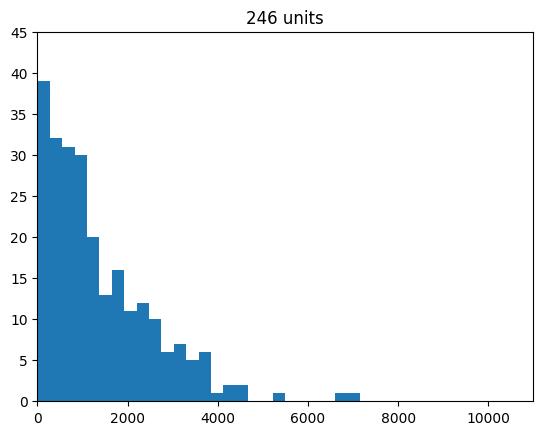

In [47]:
prop_signal = SpikeSorter(RECORDING, "RT-Sort", all_spike_trains)
plt.title(f"{len(prop_signal)} units")
plt.hist([len(spike_train) for spike_train in all_spike_trains], bins=40, range=(0, 11000))
plt.xlim(0, 11000)
plt.ylim(0, 45)
plt.show()

## Merge again
After detecting spikes

In [51]:
# Merge again
elec_to_props = {}
for unit in prop_units:
    if unit.chan not in elec_to_props:
        elec_to_props[unit.chan] = [deepcopy(unit)]
    else:
        elec_to_props[unit.chan].append(deepcopy(unit))

def job(root_elec, isi_viol=1.5):   
    units = elec_to_props[root_elec]
    if len(units) == 1:
        return units
    merged_units = merge_coc_clusters(root_elec, units)

    # Fix ISI violations
    for unit in merged_units:
        unit.spike_train = fix_isi_viols(unit.spike_train)
        
    return merged_units

prop_merged_units = []
with Pool(processes=20) as pool:
    tasks = list(elec_to_props.keys())
    idx = 0
    for merged_units in tqdm(pool.imap(job, tasks), total=len(tasks)):
        for unit in merged_units:
            unit.idx = idx
            unit.recording = RECORDING
            prop_merged_units.append(unit)
            idx += 1
print(len(prop_merged_units))

100%|██████████| 182/182 [00:05<00:00, 33.55it/s]


211


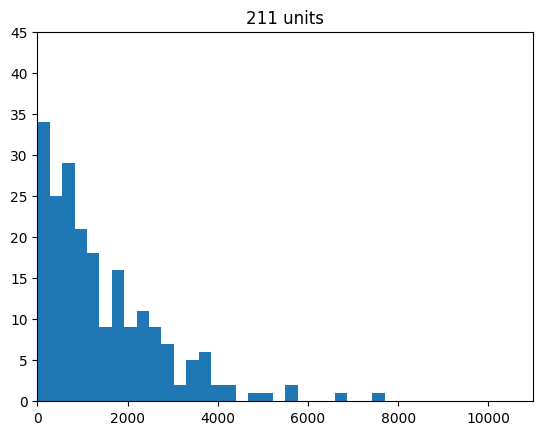

In [52]:
prop_signal = SpikeSorter(RECORDING, "RT-Sort", units=prop_merged_units)
plt.title(f"{len(prop_signal)} units")
plt.hist([len(spike_train) for spike_train in prop_signal.get_spike_times()], bins=40, range=(0, 11000))
plt.xlim(0, 11000)
plt.ylim(0, 45)
plt.show()

## Interelectrode merging
Merge units whose root elecs are within Xum (50) of each other

In [96]:
# Need to set root_elec for merge_coc_clusters
for unit in prop_merged_units:
    unit.root_elec = unit.chan
    unit.recording = None  # Needed for deepcopy since "h5py objects cannot be pickled"

In [123]:
# Parallalize setup_coc_clusters
prop_pre_intermerged_units = []

def job(unit):
    setup_cluster(unit)
    return unit

with Pool(processes=20) as pool:
    for unit in tqdm(pool.imap(job, prop_merged_units), total=len(prop_merged_units)):
        prop_pre_intermerged_units.append(unit)

100%|██████████| 211/211 [00:08<00:00, 23.96it/s]


In [124]:
# Look at two prop units
prop_a = prop_pre_intermerged_units[119]
prop_b = prop_pre_intermerged_units[121]
elecs = get_merge_elecs(prop_a.root_elec)
merge = Merge(prop_a, prop_b, elecs)

print(merge.score_latencies(), merge.score_rel_amps())

1.98773193359375 0.73608416


In [135]:
prop_pre_intermerged_units_copy = deepcopy(prop_pre_intermerged_units)
for prop in prop_pre_intermerged_units_copy:
    prop.recording = RECORDING  # For plotting with verbose=True in merge_coc_clusters

prop_intermerged_units = merge_coc_clusters(prop_pre_intermerged_units_copy,
                                            max_root_elec_dist=50,
                                            setup_coc_clusters=False, verbose=True)

for unit in prop_intermerged_units:
    unit.spike_train = fix_isi_viols(unit.spike_train)


Merged 74 with 75
Latency diff: 0.56. Rel amp diff: 0.06
#spikes:
Index 74: 180, Index 75: 179, Overlaps: 110
ISI viols: 110

Merged 98 with 99
Latency diff: 0.06. Rel amp diff: 0.12
#spikes:
Index 98: 997, Index 99: 2033, Overlaps: 262
ISI viols: 265

Merged 135 with 136
Latency diff: 0.90. Rel amp diff: 0.06
#spikes:
Index 135: 1334, Index 136: 1348, Overlaps: 712
ISI viols: 715

Merged 76 with 78
Latency diff: 0.85. Rel amp diff: 0.07
#spikes:
Index 76: 2767, Index 78: 540, Overlaps: 457
ISI viols: 462

Merged 108 with 110
Latency diff: 0.04. Rel amp diff: 0.21
#spikes:
Index 108: 261, Index 110: 68, Overlaps: 6
ISI viols: 6

Merged 86 with 87
Latency diff: 0.99. Rel amp diff: 0.11
#spikes:
Index 86: 2552, Index 87: 229, Overlaps: 101
ISI viols: 102

Merged 115 with 119
Latency diff: 1.14. Rel amp diff: 0.09
#spikes:
Index 115: 163, Index 119: 2292, Overlaps: 139
ISI viols: 139

Merged 164 with 165
Latency diff: 0.73. Rel amp diff: 0.15
#spikes:
Index 164: 925, Index 165: 1939, Ove

In [271]:
merge = Merge(prop_pre_intermerged_units[15], prop_pre_intermerged_units[16], get_merge_elecs(prop_pre_intermerged_units[15].root_elec))
print(merge.score_latencies())
print(merge.score_rel_amps())

2.2969932556152344
0.43758914


2238


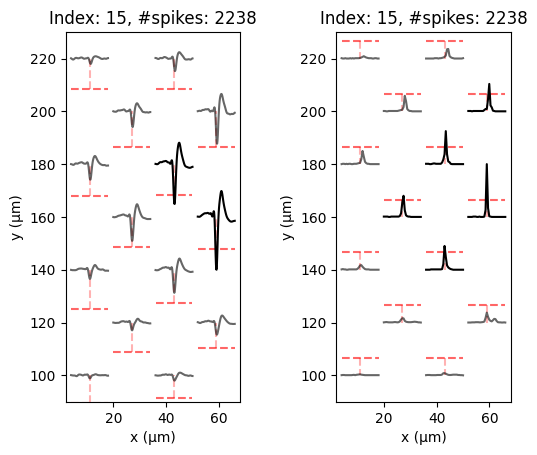

2559


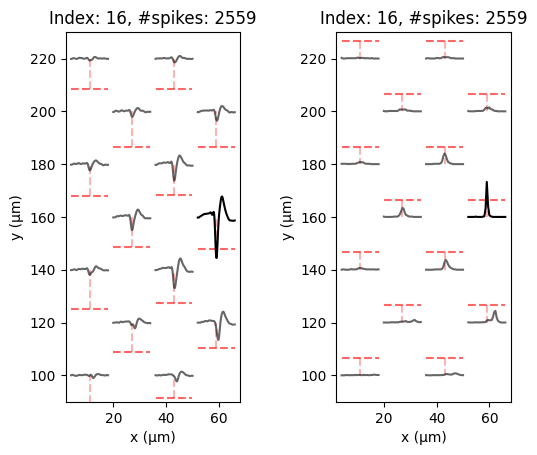

In [272]:
# Look at some merges
ind = [15, 16]
##
amp_kwargs = None
for idx in ind:
    unit = prop_pre_intermerged_units[idx]
    unit.recording = RECORDING
    
    print(len(unit.spike_train))
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit)
    else:
        plot_elec_probs(unit, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()

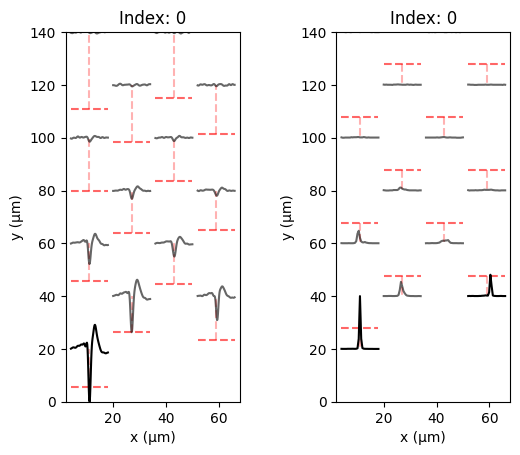

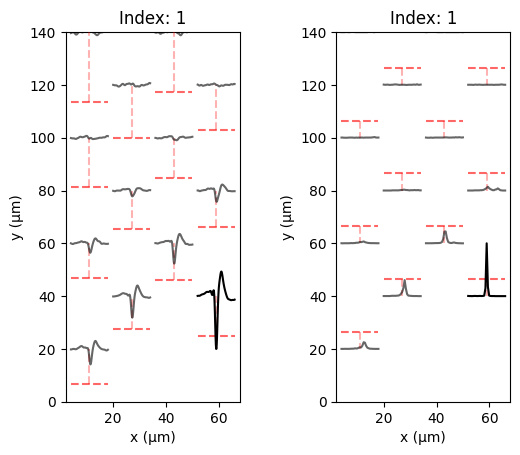

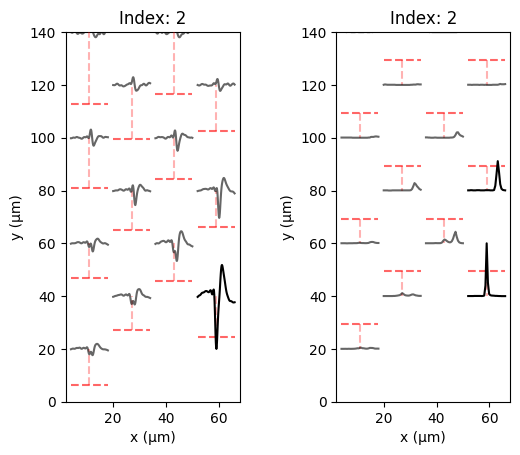

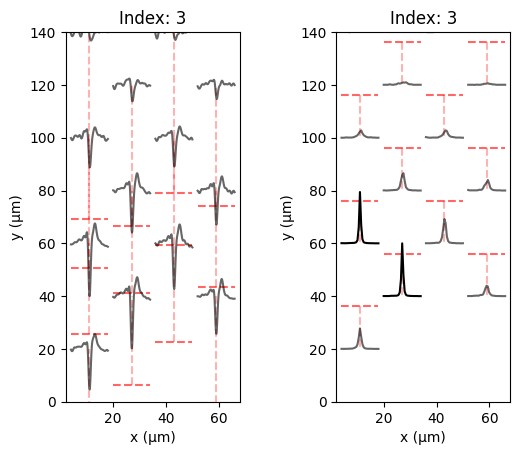

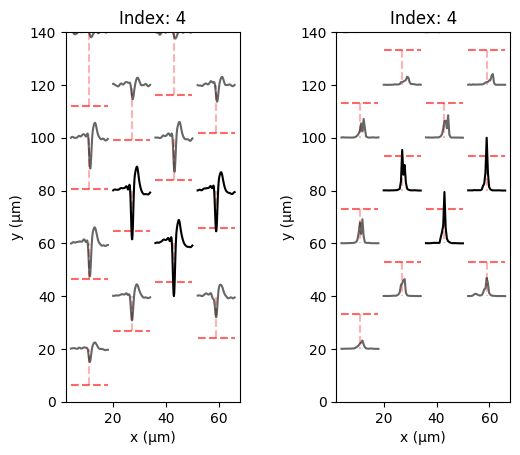

...

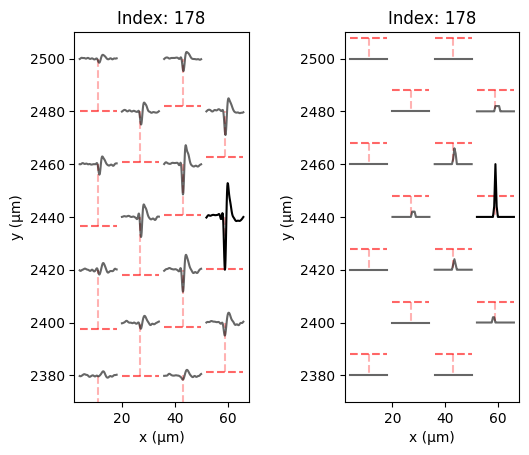

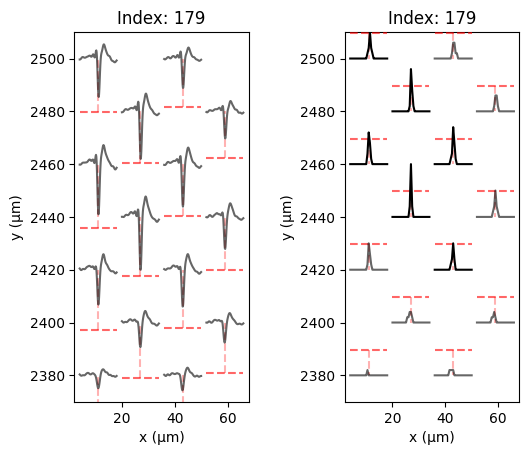

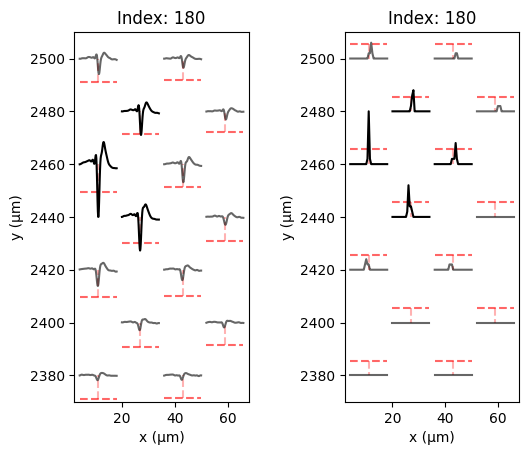

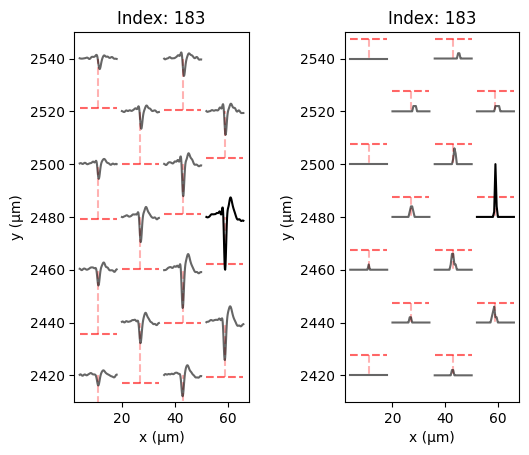

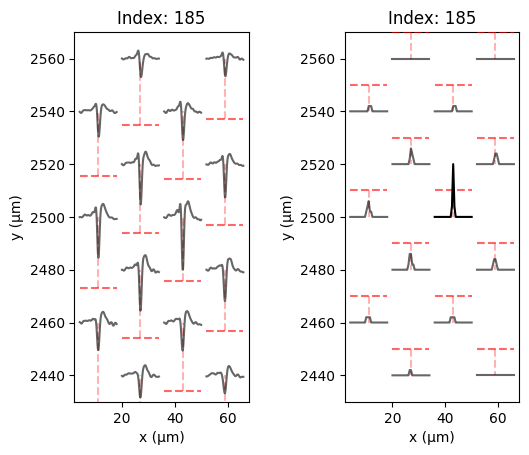

KeyboardInterrupt: 

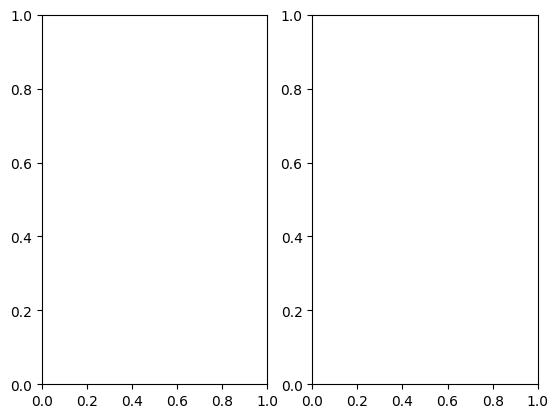

In [146]:
for unit in prop_intermerged_units:
    plot_elec_probs(unit)
    plt.show()

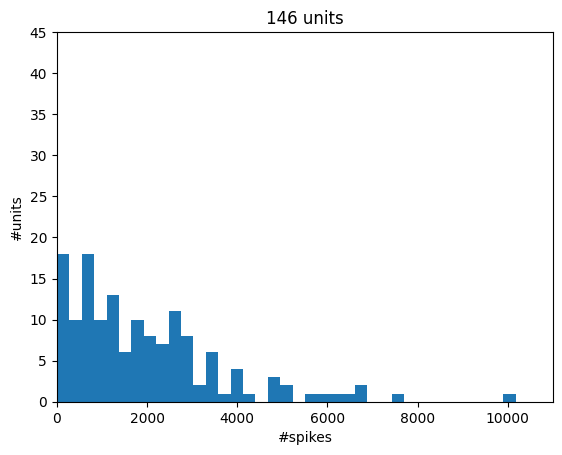

In [273]:
prop_signal = SpikeSorter(RECORDING, "RT-Sort", units=prop_intermerged_units)
plt.title(f"{len(prop_signal)} units")
plt.hist([len(spike_train) for spike_train in prop_signal.get_spike_times()], bins=40, range=(0, 11000))
plt.xlim(0, 11000)
plt.ylim(0, 45)
plt.xlabel("#spikes")
plt.ylabel("#units")
plt.show()

In [237]:
# np.save("/data/MEAprojects/dandi/000034/sub-mouse412804/dl_model/rt_sort/231022/spike_times.npy", prop_signal.get_spike_times())

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


### Testing

In [ ]:
prop_a = prop_signal[53]
prop_b = prop_signal[54]

In [82]:
merge = Merge(prop_a, prop_b, get_merge_elecs(prop_a.chan))
print(merge.score_latencies())
print(merge.score_rel_amps())

0.9869270324707031
0.35658848


1651


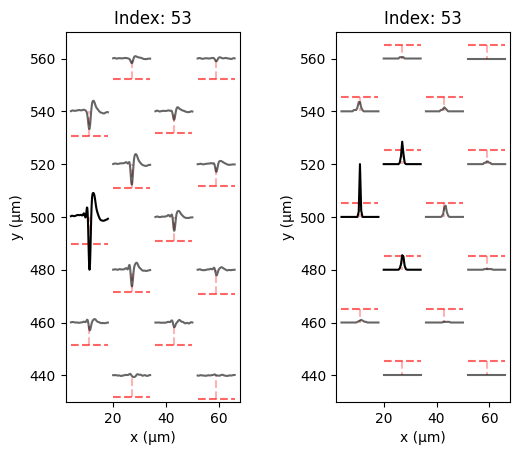

1666


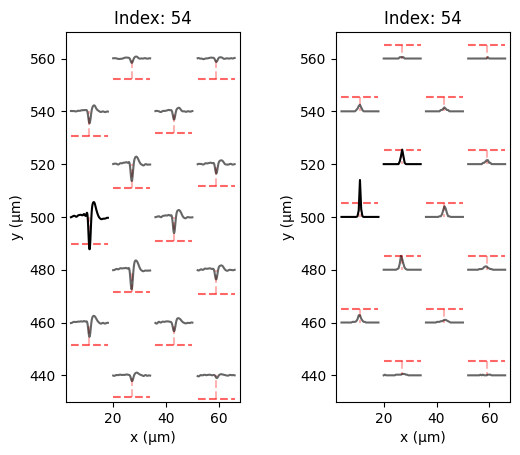

In [84]:
amp_kwargs = None
for unit in [prop_a, prop_b]:
    print(len(unit.spike_train))
    if amp_kwargs is None:
        amp_kwargs, prob_kwargs = plot_elec_probs(unit)
    else:
        plot_elec_probs(unit, amp_kwargs=amp_kwargs, prob_kwargs=prob_kwargs)
    plt.show()

In [86]:
print(len(set(prop_a.spike_train).intersection(prop_b.spike_train)))
print(len(prop_a.spike_train), len(prop_b.spike_train))

184
1651 1666


In [374]:
units = [prop_signal[0], prop_signal[1]]
setup_coc_clusters(units)
merge = Merge(units[0], units[1], get_merge_elecs(0))
print(merge.score_latencies())
print(merge.score_rel_amps())

0.12902069091796875
0.048466966


1761


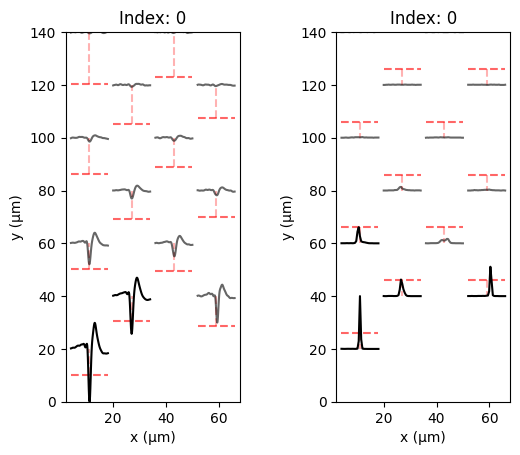

2973


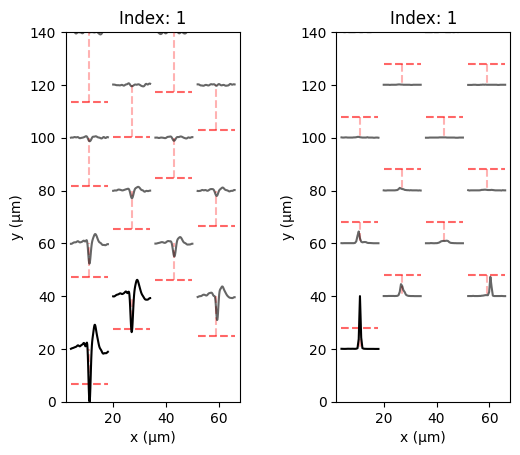

In [373]:
for unit in units:
    print(len(unit.spike_train))
    plot_elec_probs(unit)
    plt.show()

2339


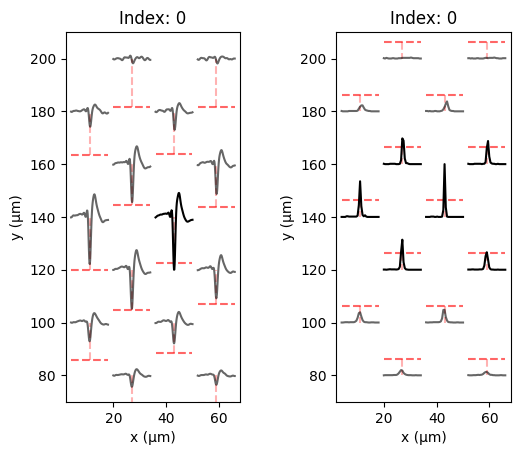

In [269]:
# Compare detected spikes to backbone
print(len(spike_train))
unit = Unit(0, spike_train, coc_cluster.root_elec, RECORDING)
plot_elec_probs(unit, np.mean(extract_detection_probs(unit), axis=0))
plt.show()

print(f"Backbone")
print(len(coc_cluster.spike_train))
unit = Unit(0, coc_cluster.spike_train, coc_cluster.root_elec, RECORDING)
plot_elec_probs(unit, np.mean(extract_detection_probs(unit), axis=0))
plt.show()

## OLD - Detect spikes

In [ ]:
# Reset footprint_stats_ and prop_elecs_ after merging
def get_prop_with_footprint(prop):
    set_footprint_stats(prop, use_rms_thresh=True)
    return prop

all_props_with_footprints = []
with Pool(processes=20) as pool:
    for prop in tqdm(pool.imap(get_prop_with_footprint, all_props), total=len(all_props)):
        all_props_with_footprints.append(prop)
all_props = all_props_with_footprints

100%|██████████| 103/103 [00:49<00:00,  2.07it/s]


In [ ]:
def detect_spikes(prop, 
                  min_coc_p=50, min_coc_n=2, rms_thresh=5, x_std=2,
                  isi_viol=1.5,
                  time_frame=None):
    """
    Parameters
    ----------
    time_frame:
        If not None, only use coocurrences between time_frame[0]ms to time_frame[1]ms (inclusive, inclusive)
        If None, use all cooccurrences
    """
    
    spike_train = set()
    
    prop_elecs = set(prop.prop_elecs_)
    for ref_elec in prop_elecs:
        coc_dict = load_coc_dict(ref_elec)
            
        # time_frame
        if time_frame is not None:
            start_ms, end_ms = time_frame
            new_coc_dict = {}
            for (root_time, root_amp), cocs in coc_dict.items():
                if start_ms <= root_time <= end_ms:
                    new_cocs = []
                    for elec, time, amp in cocs:
                        if start_ms <= time <= end_ms:
                            new_cocs.append((elec, time, amp))
                    if len(new_cocs) > 0:
                        new_coc_dict[(root_time, root_amp)] = new_cocs
            coc_dict = new_coc_dict
        
        elec_stats = prop.footprint_stats_   
        min_num_cocs = max(min_coc_p / 100 * len(prop.prop_elecs_), min_coc_n)
        for (time, amp), crossings in coc_dict.items():                       
            prop_crossings = [(ref_elec, time, amp)]
             
            # Get mean amps
            sum_amps = amp
            num_amps = 1
            for elec2, time2, amp2 in crossings:
                if elec2 in prop_elecs:
                    sum_amps += amp2
                    num_amps += 1
                    prop_crossings.append((elec2, time2-time, amp2))
            mean_amp = sum_amps / num_amps
    
            # Count coactivations
            num_cocs = 0
            for elec, latency, amp in prop_crossings:
                if amp / chans_rms[elec] < rms_thresh:
                    continue
                
                # Compare latency
                if elec != prop.prop_elecs_[0]:  # First elec cannot measure latency
                    mean_latency = elec_stats[elec][0] - elec_stats[elec][0]
                    z_latency = (latency - mean_latency) / elec_stats[elec][1]
                    if z_latency > x_std:
                        continue
                
                # Compare relative amplitude
                rel_amp = amp / mean_amp
                z_latency = (rel_amp - elec_stats[elec][2]) / elec_stats[elec][3]
                if z_latency <= x_std:
                    num_cocs += 1
            
            if num_cocs >= min_num_cocs:
                spike_train.add(time - elec_stats[ref_elec, 0])  # Make time relative(ish) to first elec
    
    spike_train = np.sort(list(spike_train))
    last_spike = spike_train[0]
    spike_train_isi = [last_spike]
    for spike in spike_train[1:]:
        if spike - last_spike >= isi_viol:
            spike_train_isi.append(spike)
            last_spike = spike
            
    return spike_train_isi

# prop = all_props[38]
# prop_spike_train = prop.spike_train
# print(len(prop_spike_train))
# spike_train = detect_spikes(prop)
# print(len(spike_train))

# # Need to calculate overlap this way because of float rounding
# num_overlap = np.sum(np.abs(prop_spike_train[:, None] - spike_train) < 1e-2)
# print(num_overlap)  #0.01

In [ ]:
for elec in prop.prop_elecs_:
    print(elec, [round(s, 2) for s in prop.footprint_stats_[elec]])

75 [0.0, 0.0, 1.48, 0.1, 11.89]
73 [-0.01, 0.03, 1.41, 0.08, 18.48]
74 [-0.0, 0.02, 0.8, 0.09, 10.29]
77 [0.02, 0.04, 0.73, 0.09, 4.31]


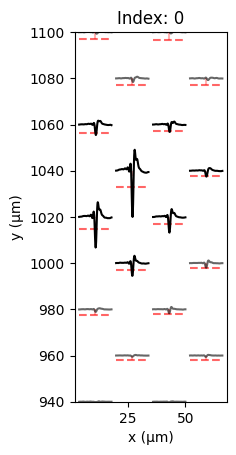

In [ ]:
unit = Unit(0, spike_train, prop.prop_elecs_[0], RECORDING)
unit.plot(chans_rms=CHANS_RMS)
plt.show()

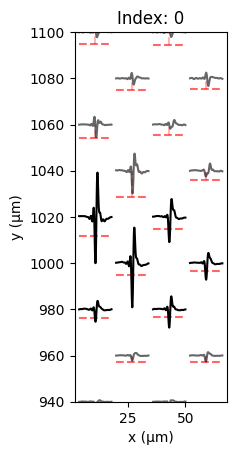

In [ ]:
unit = Unit(0, prop.spike_train, prop.prop_elecs_[0], RECORDING)
unit.plot(chans_rms=CHANS_RMS)
plt.show()

  0%|          | 0/103 [00:00<?, ?it/s]

100%|██████████| 103/103 [00:26<00:00,  3.87it/s]


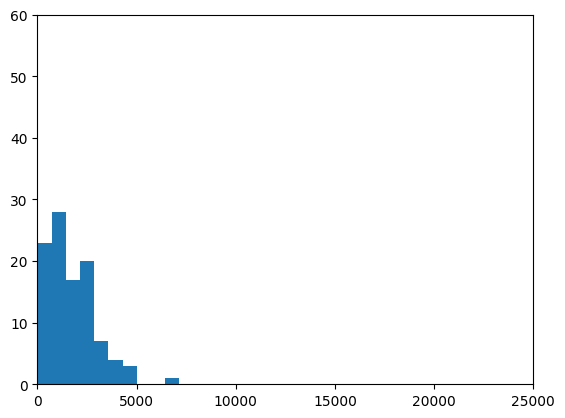

In [ ]:
detect_spikes_time_frame = (5*60*1000, 10*60*1000)

all_props_detected = deepcopy(all_props)
for prop in tqdm(all_props_detected):
    spike_train = detect_spikes(prop, time_frame=detect_spikes_time_frame)
    prop.spike_train = spike_train
    
prop_signal = SpikeSorter(recording, "Prop.", [unit.spike_train for unit in all_props_detected])
plt.hist([len(p.spike_train) for p in all_props_detected])
plt.xlim(0, 25000)
plt.ylim(0, 60)
plt.show()

## OLD - Split spikes

In [ ]:
# Need to set self.elecs and self.mean_amps_all for spike-splitting code to function
for prop in all_props_detected:
    prop.elecs = prop.prop_elecs_
    prop.mean_amps_all = prop.footprint_stats_[:, 4] * chans_rms

# Set mean amps across all electrodes for each unit
# num_elecs = RECORDING.get_num_channels()
# def extract_mean_amps(m_prop_idx):
#     m_prop = merged_propagations[m_prop_idx]
#     mean_amps_all = m_prop.get_mean_amps(
#         RECORDING, elecs=range(num_elecs)
#     )
#     return m_prop_idx, mean_amps_all

# from multiprocessing import Pool
# with Pool(processes=12) as pool:
#     for unit_idx, mean_amps_all in tqdm(pool.imap(extract_mean_amps, range(len(merged_propagations))), total=len(merged_propagations)):
#         merged_propagations[unit_idx].mean_amps_all = mean_amps_all

In [ ]:
# IND = [0, 1]
IND = range(len(all_props_detected))
##
prop_copies = []
for idx in IND:
    unit = deepcopy(all_props_detected[idx])
    prop_copies.append(unit)
    
# F.summarize_pair_overlap(*m_prop_copies)

multi = F.split_spikes(
    prop_copies,
    CROSS_TIMES_5, CROSS_AMPS_5,
    CHANS_RMS, rms_thresh=5,
    split_overlap=0.2,
    ms_before=2/RECORDING.get_sampling_frequency(), ms_after=0.5,
    min_coactivations_n=2, min_coactivations_p=50,
    recording=RECORDING,
)

# kwargs = m_prop_copies[0].plot(RECORDING, chans_rms=CHANS_RMS)
# plt.show()

# m_prop_copies[1].plot(RECORDING, **kwargs)
# plt.show()

# F.summarize_pair_overlap(*m_prop_copies)

# kwargs = m_prop_copies[0].plot(RECORDING, chans_rms=CHANS_RMS)
# m_prop_copies[1].plot(RECORDING, **kwargs)
    
# multi.split(record_history=True)
# multi.plot_splitting(RECORDING)
# plt.show()

100%|██████████| 93487/93487 [00:11<00:00, 8475.34it/s] 


In [286]:
prop_signal = SpikeSorter(recording, "Prop.", [unit.spike_train for unit in prop_copies if len(unit.spike_train) > 0])
plt.hist([len(unit.spike_train) for unit in prop_copies])
plt.xlim(0, 25000)
plt.ylim(0, 55)
plt.show()

NameError: name 'prop_copies' is not defined

In [ ]:
# SAVE_PATH = Path("/data/MEAprojects/dandi/000034/sub-mouse412804/prop_signal/231011/spike_times.npy")
# np.save(SAVE_PATH, prop_signal.get_spike_times())

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


## Comparison with kilosort

### Just kilosort

In [171]:
"""
time_frame:
    If not None, only use coocurrences between time_frame[0]ms to time_frame[1]ms (inclusive, inclusive)
    If None, use all cooccurrences
"""

# kilosort = Kilosort(utils.PATH_SM4_SI, "first", RECORDING)
kilosort = get_experts_kilosort()
# kilosort.plot_nums_spikes(show=False, bins=20)
# plt.xlim(0, 25000)
# plt.show()

detect_spikes_time_frame = TIME_FRAME_5_10
if detect_spikes_time_frame is not None:
    start_ms, end_ms = detect_spikes_time_frame
    spike_times = []
    for times in kilosort.get_spike_times():
        times_ind = start_ms <= times
        times_ind *= times <= end_ms
        spike_times.append(times[times_ind])
        
    kilosort = SpikeSorter(
        RECORDING,
        name="Experts Kilosort",
        spike_times=spike_times
    )

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'hdmf-common' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'core' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/data/MEAprojects/PropSignal/src/comparison.py:334: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)
/data/MEAprojects/PropSignal/src/sorters/kilosort.py:156: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with differ

Recording does not have scaled traces. Setting gain to 0.195


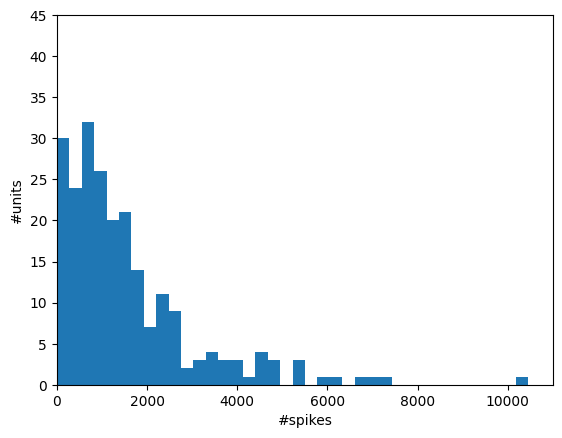

In [274]:
plt.hist([len(spike_train) for spike_train in kilosort.get_spike_times()], bins=40, range=(0, 11000))
plt.xlim(0, 11000)
plt.ylim(0, 45)
plt.xlabel("#spikes")
plt.ylabel("#units")
plt.show()

/data/MEAprojects/PropSignal/src/comparison.py:334: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)


Num RT-Sort: 146
Num Experts Kilosort: 226
Num single matches: 23

For RT-Sort:
Num max matches: 23
Num unique max matches: 23

For Experts Kilosort:
Num max matches: 24
Num unique max matches: 23


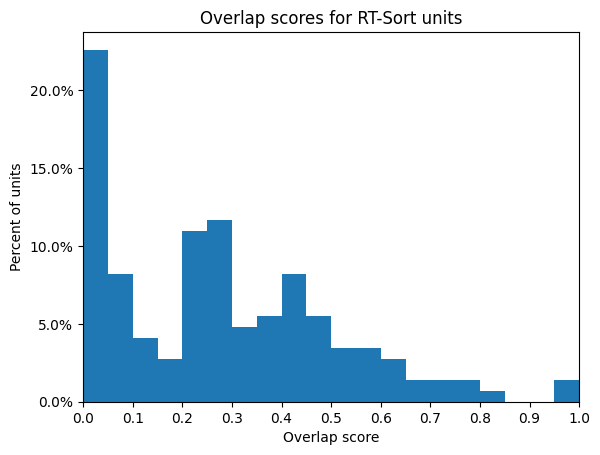

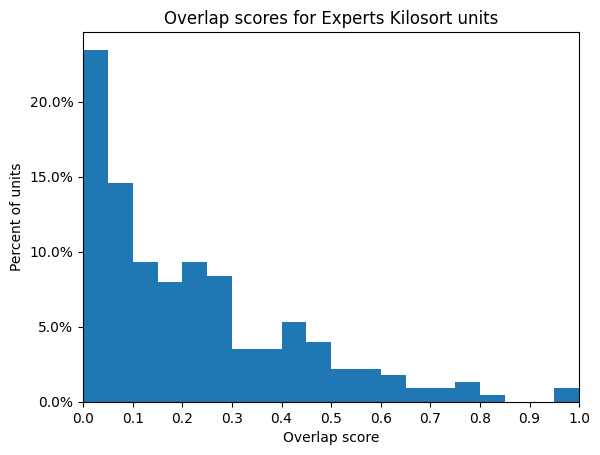

Num RT-Sort: 146
Num Experts Kilosort: 226
Num single matches: 50

For RT-Sort:
Num max matches: 55
Num unique max matches: 49

For Experts Kilosort:
Num max matches: 53
Num unique max matches: 49


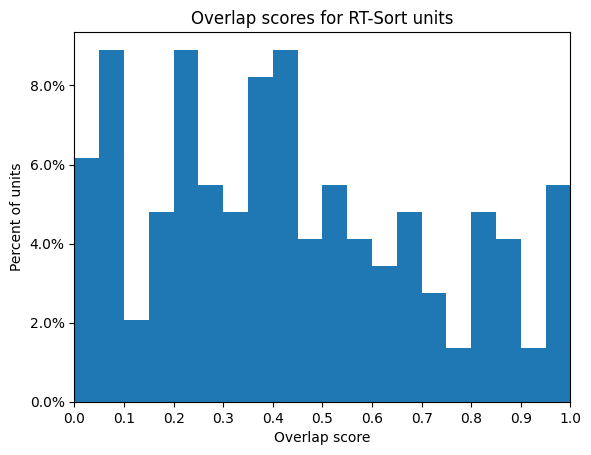

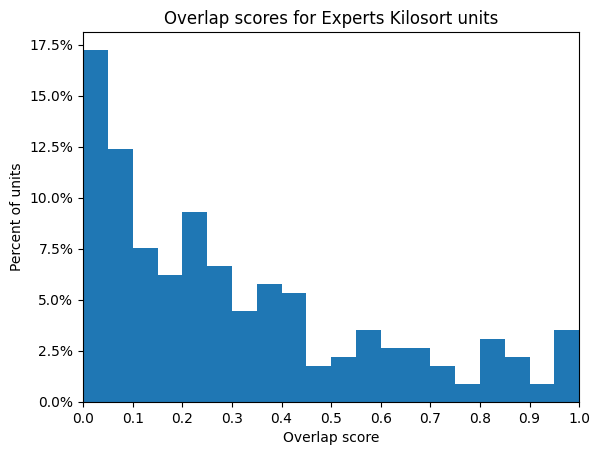

Num RT-Sort: 146
Num Experts Kilosort: 226
Num single matches: 73

For RT-Sort:
Num max matches: 74
Num unique max matches: 72

For Experts Kilosort:
Num max matches: 115
Num unique max matches: 72


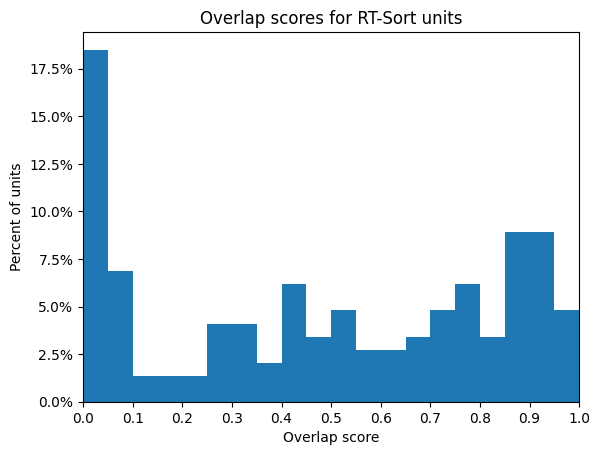

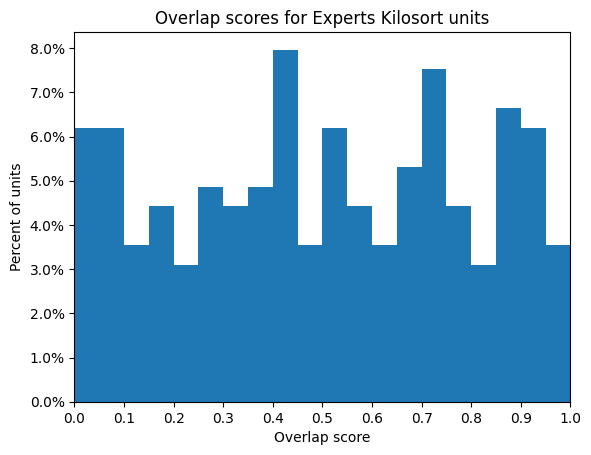

In [155]:
comp_1_5 = Comparison(prop_signal, kilosort, score_formula=1.5, delta_time=0.4)
comp_1_5.summary()

comp_1 = Comparison(prop_signal, kilosort, score_formula=1, delta_time=0.4)
comp_1.summary()

comp_2 = Comparison(prop_signal, kilosort, score_formula=2, delta_time=0.4)
comp_2.summary()


# comp_1_5 = Comparison(prop_signal, kilosort, score_formula=1.5, delta_time=2)
# comp_1_5.summary()

# comp_1 = Comparison(prop_signal, kilosort, score_formula=1, delta_time=2)
# comp_1.summary()

# comp_2 = Comparison(prop_signal, kilosort, score_formula=2, delta_time=2)
# comp_2.summary()

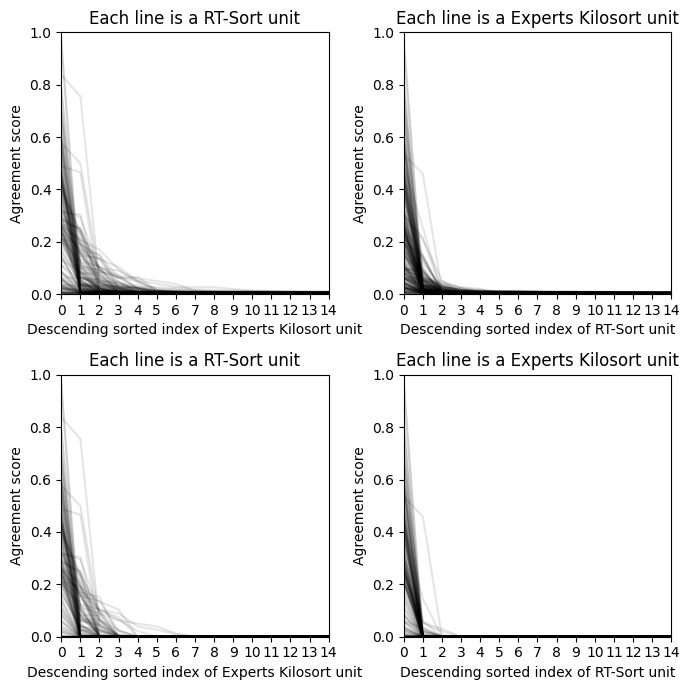

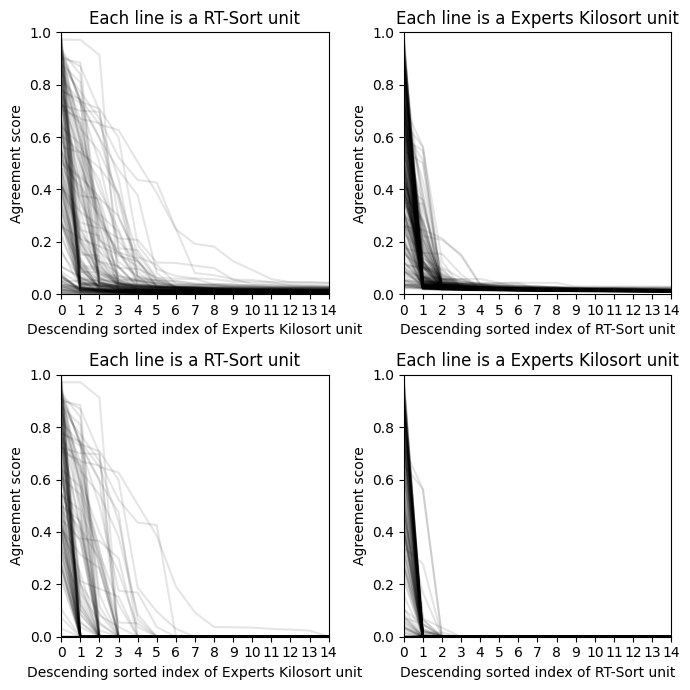

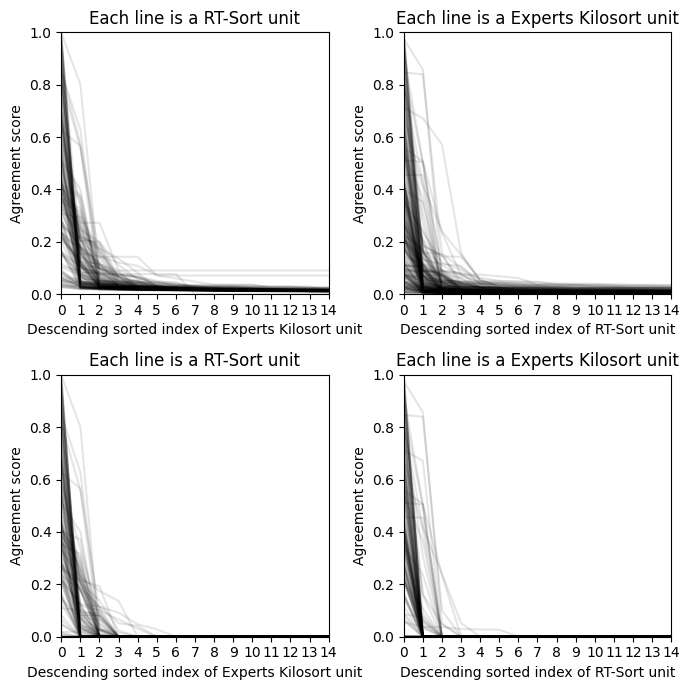

In [156]:
comp_1_5.plot_line_comps()
comp_2.plot_line_comps()
comp_1.plot_line_comps()

In [157]:
prop_train = set()
for spike_train in prop_signal.get_spike_times():
    prop_train.update(spike_train)
prop_train = np.sort(list(prop_train))
    
ks_train = set()
for spike_train in kilosort.get_spike_times():
    ks_train.update(spike_train)
ks_train = np.sort(list(ks_train))

num_matches = Comparison.count_matching_events(prop_train, ks_train,
                                               delta=0.4)
print(f"#spikes:")
print(f"Matches: {num_matches}")
print(f"RT-Sort: {len(prop_train)}, {num_matches/len(prop_train)*100:.1f}")
print(f"Kilosort: {len(ks_train)}, {num_matches/len(ks_train)*100:.1f}")

#spikes:
Matches: 207025
RT-Sort: 271332, 76.3
Kilosort: 347992, 59.5


### Ignore prop units fully below 5RMS

108


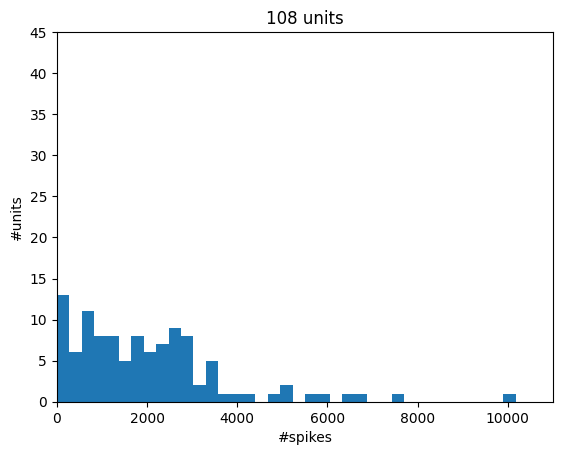

In [162]:
prop_units_above_5rms = []
for unit in prop_signal:
    chans_above = unit.mean_amps >= CHANS_RMS * 5
    if sum(chans_above) > 0:
        prop_units_above_5rms.append(unit)
print(len(prop_units_above_5rms))

prop_signal = SpikeSorter(RECORDING, "RT-Sort", units=prop_units_above_5rms)
plt.title(f"{len(prop_signal)} units")
plt.hist([len(spike_train) for spike_train in prop_signal.get_spike_times()], bins=40, range=(0, 11000))
plt.xlim(0, 11000)
plt.ylim(0, 45)
plt.xlabel("#spikes")
plt.ylabel("#units")
plt.show()

/data/MEAprojects/PropSignal/src/comparison.py:334: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)


Num RT-Sort: 108
Num Experts Kilosort: 226
Num single matches: 22

For RT-Sort:
Num max matches: 22
Num unique max matches: 22

For Experts Kilosort:
Num max matches: 23
Num unique max matches: 22


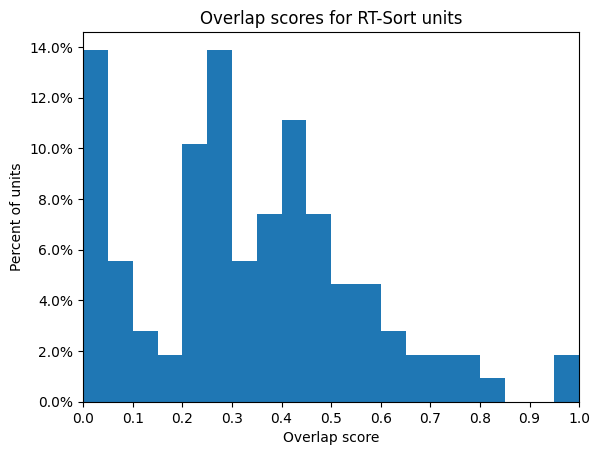

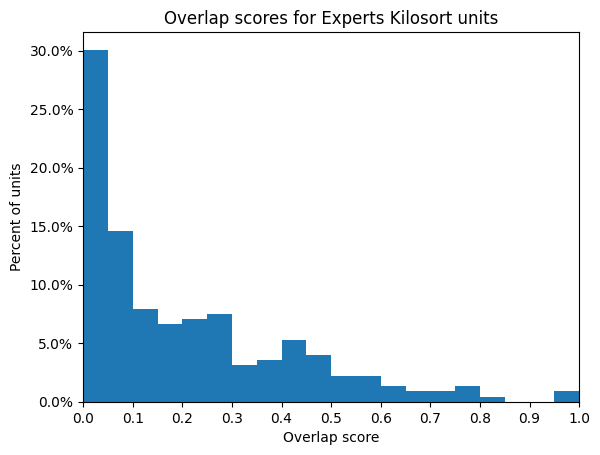

Num RT-Sort: 108
Num Experts Kilosort: 226
Num single matches: 45

For RT-Sort:
Num max matches: 49
Num unique max matches: 44

For Experts Kilosort:
Num max matches: 48
Num unique max matches: 44


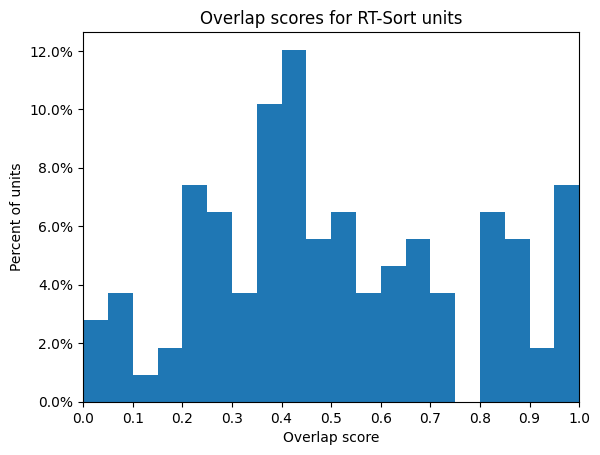

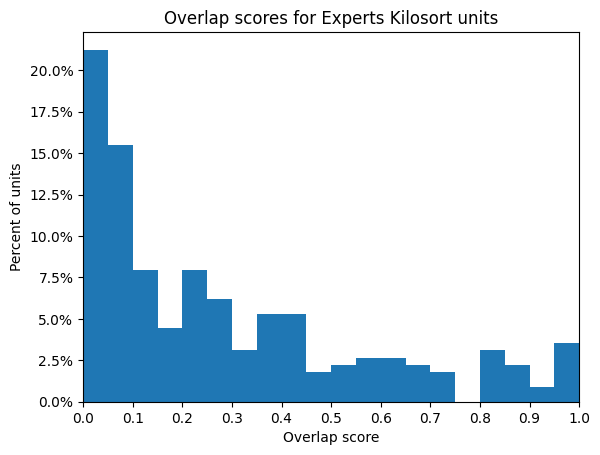

Num RT-Sort: 108
Num Experts Kilosort: 226
Num single matches: 69

For RT-Sort:
Num max matches: 70
Num unique max matches: 68

For Experts Kilosort:
Num max matches: 107
Num unique max matches: 68


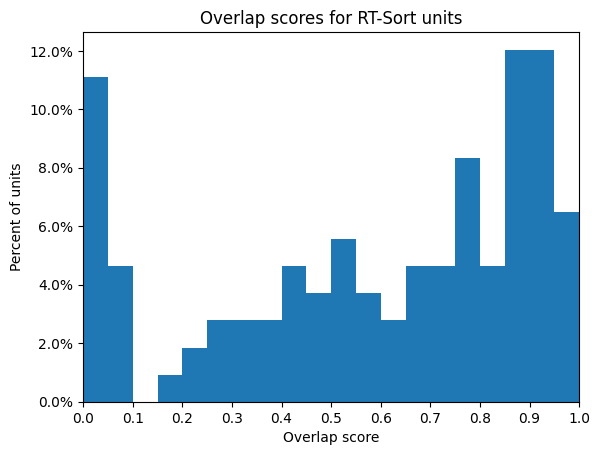

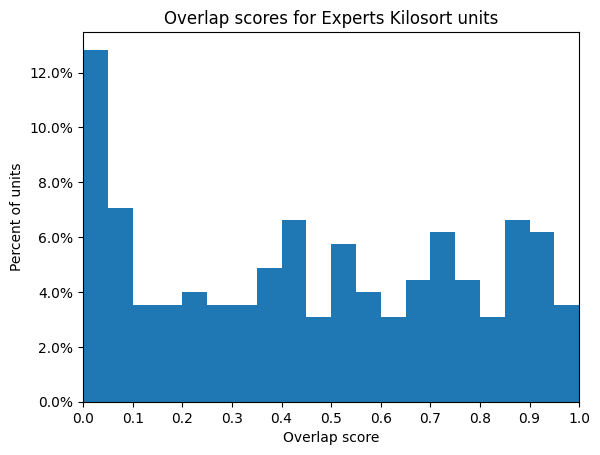

In [163]:
comp_1_5 = Comparison(prop_signal, kilosort, score_formula=1.5, delta_time=0.4)
comp_1_5.summary()

comp_1 = Comparison(prop_signal, kilosort, score_formula=1, delta_time=0.4)
comp_1.summary()

comp_2 = Comparison(prop_signal, kilosort, score_formula=2, delta_time=0.4)
comp_2.summary()

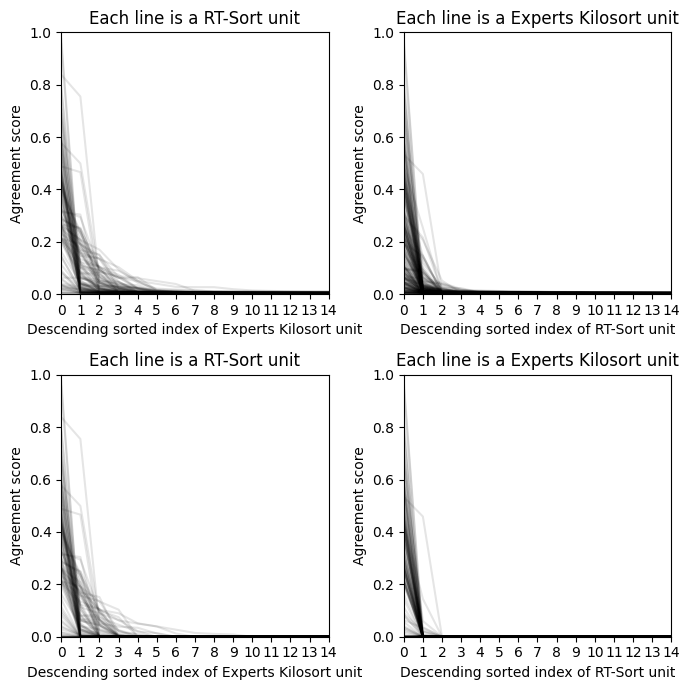

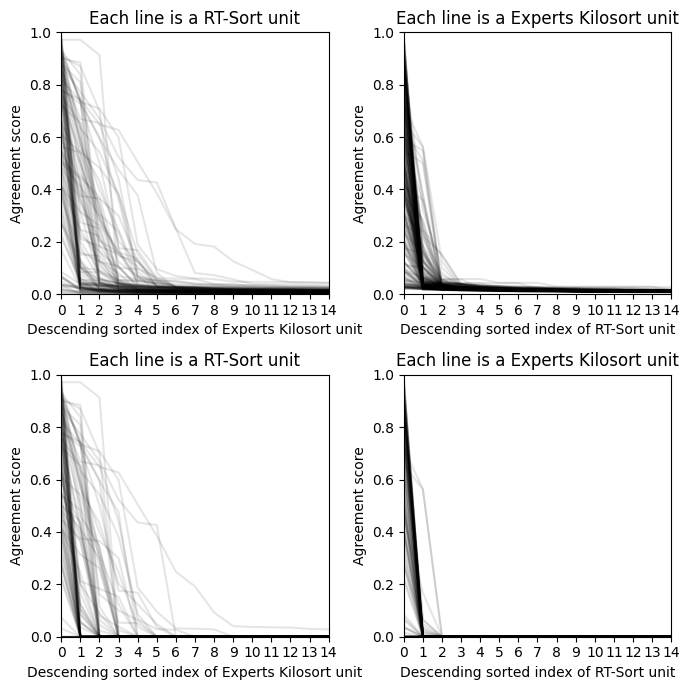

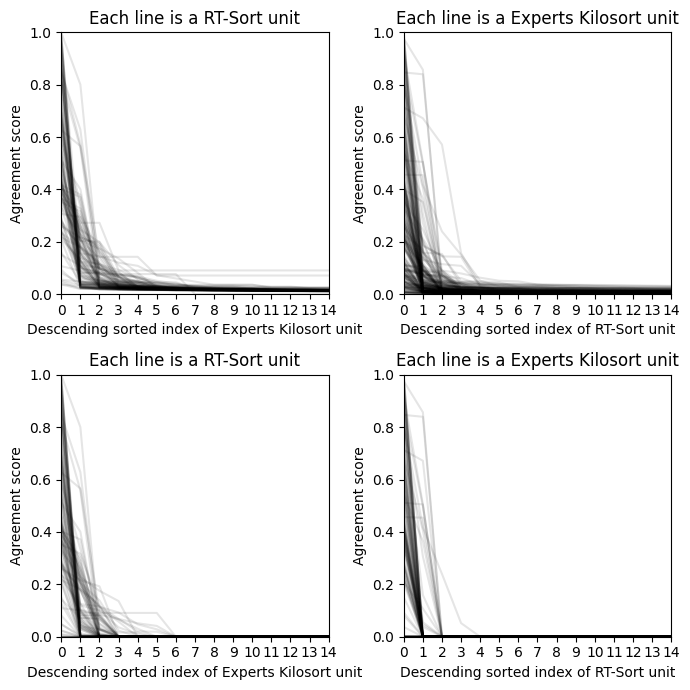

In [165]:
comp_1_5.plot_line_comps()
comp_2.plot_line_comps()
comp_1.plot_line_comps()

In [164]:
prop_train = set()
for spike_train in prop_signal.get_spike_times():
    prop_train.update(spike_train)
prop_train = np.sort(list(prop_train))
    
ks_train = set()
for spike_train in kilosort.get_spike_times():
    ks_train.update(spike_train)
ks_train = np.sort(list(ks_train))

num_matches = Comparison.count_matching_events(prop_train, ks_train,
                                               delta=0.4)
print(f"#spikes:")
print(f"Matches: {num_matches}")
print(f"RT-Sort: {len(prop_train)}, {num_matches/len(prop_train)*100:.1f}")
print(f"Kilosort: {len(ks_train)}, {num_matches/len(ks_train)*100:.1f}")

#spikes:
Matches: 173947
RT-Sort: 209660, 83.0
Kilosort: 347992, 50.0


### Look at prop units' surrounding ks units

In [ ]:
# Create all_ks_units with self.templates and self.chan set
all_ks_units = []

def job(idx):
    unit = Unit(idx, all_ks_spike_times[idx], -1, RECORDING)
    templates = unit.get_templates()
    unit.recording = None
    unit.chan = np.argmin(np.min(templates, axis=1))
    return unit

all_ks_spike_times = kilosort.get_spike_times()
with Pool(processes=20) as pool:
    tasks = range(len(all_ks_spike_times))
    for unit in tqdm(pool.imap(job, tasks), total=len(tasks)):
        unit.recording = RECORDING
        all_ks_units.append(unit)

100%|██████████| 226/226 [01:22<00:00,  2.75it/s]


In [ ]:
# Create elec_to_ks_units
elec_to_ks_units = {}
for ks_unit in all_ks_units:
    if ks_unit.chan not in elec_to_ks_units:
        elec_to_ks_units[ks_unit.chan] = [ks_unit]
    else:
        elec_to_ks_units[ks_unit.chan].append(ks_unit)

In [ ]:
UNITS = []
THRESH = 0.1  # Look at units with score below this

for p in range(len(prop_signal)):
    agreement_scores = comp_2.agreement_scores[p, :]
    score = np.max(agreement_scores)
    if score < THRESH:
        # print(score)
        UNITS.append(prop_signal[p])

print(len(UNITS))

0.0641958967571145
0.03670745272525028
0.013888888888888888
0.018518518518518517
0.03763277693474962
0.028963414634146343
0.005972696245733789
0.034482758620689655
0.06568848758465011
0.015145848915482424
0.006024096385542169
0.03455019556714472
0.08535536052314575
0.07196969696969698
0.04782608695652174
0.064
0.021739130434782608
17


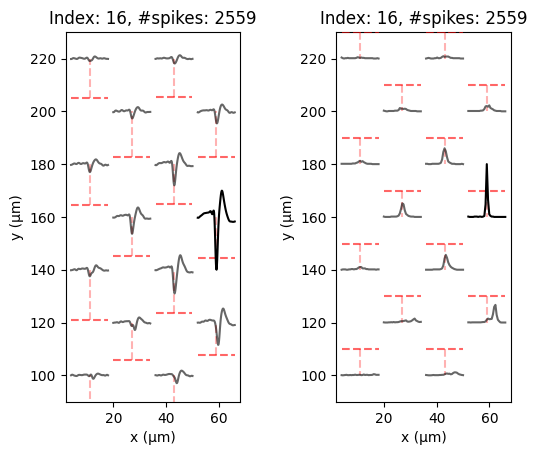

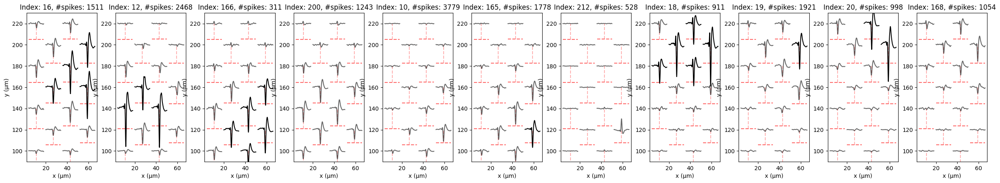

In [ ]:
# Plot ks units on all elecs with 50um and four units with highest overlap score
for unit in UNITS:
    elecs = get_merge_elecs(unit.chan, 50)
    ks_units = []
    for elec in elecs:
        if elec in elec_to_ks_units:
            ks_units += elec_to_ks_units[elec]
    
    kwargs, _ = plot_elec_probs(unit)
    plt.show()
        
    fig, axes = plt.subplots(ncols=len(ks_units), figsize=(2.8*len(ks_units), 4.8))
    for i, unit in enumerate(ks_units):
        unit.plot(axis=axes[i], **kwargs)
    plt.show()
    break

### Look at kilosort units with the same max match
For #matches/#kilosort

In [209]:
# Create all_ks_units with self.templates and self.chan set --> Don't run this if already ran before
all_ks_units = []

def job(idx):
    unit = Unit(idx, all_ks_spike_times[idx], -1, RECORDING)
    templates = unit.get_templates()
    unit.templates = templates
    unit.recording = None
    unit.chan = np.argmin(np.min(templates, axis=1))
    return unit

all_ks_spike_times = kilosort.get_spike_times()
with Pool(processes=20) as pool:
    tasks = range(len(all_ks_spike_times))
    for unit in tqdm(pool.imap(job, tasks), total=len(tasks)):
        unit.recording = RECORDING
        all_ks_units.append(unit)

  0%|          | 0/226 [00:00<?, ?it/s]

100%|██████████| 226/226 [01:22<00:00,  2.74it/s]


In [199]:
# Create prop_to_ks_units
prop_to_ks_units = {}  # {prop_unit: (score, ks_unit)}
for k, ks_unit in enumerate(kilosort):
    scores = comp_2.agreement_scores[:, k]
    max_p = np.argmax(scores)
    score = scores[max_p]
    ks_tuple = (score, ks_unit)
    
    prop = prop_signal[max_p]
    if prop not in prop_to_ks_units:
        prop_to_ks_units[prop] = [ks_tuple]
    else:
        prop_to_ks_units[prop].append(ks_tuple)

--------------------------------------------------


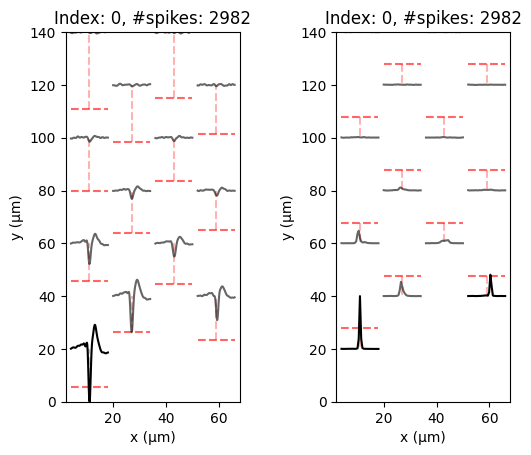

Unit 0: 0.9320113314447592
Unit 164: 0.6180327868852459


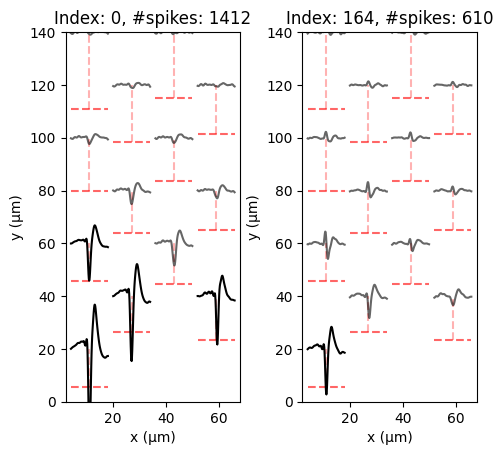

--------------------------------------------------


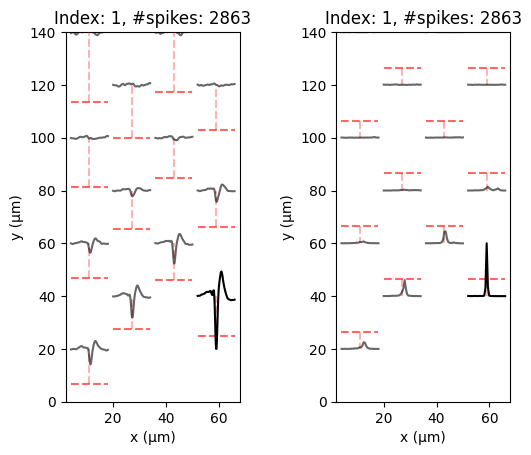

Unit 2: 0.760412534708449
Unit 68: 0.0851063829787234


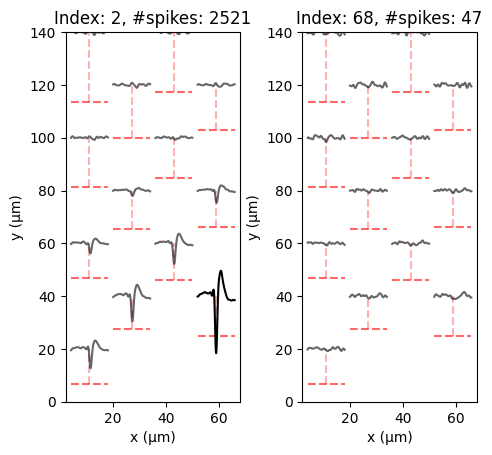

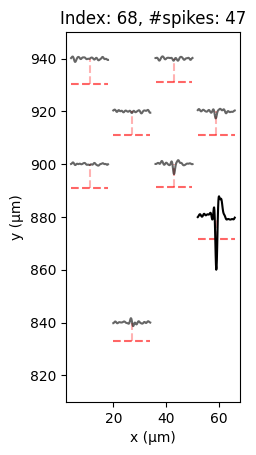

--------------------------------------------------


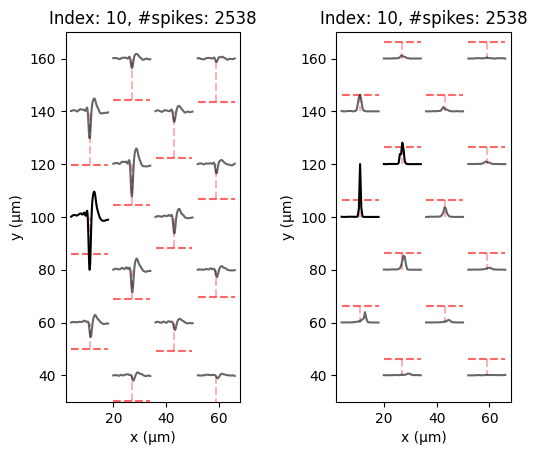

Unit 6: 0.8573573573573574
Unit 7: 0.5804488398630658
Unit 8: 0.05138339920948617
Unit 9: 0.29723502304147464
Unit 170: 0.05405405405405406


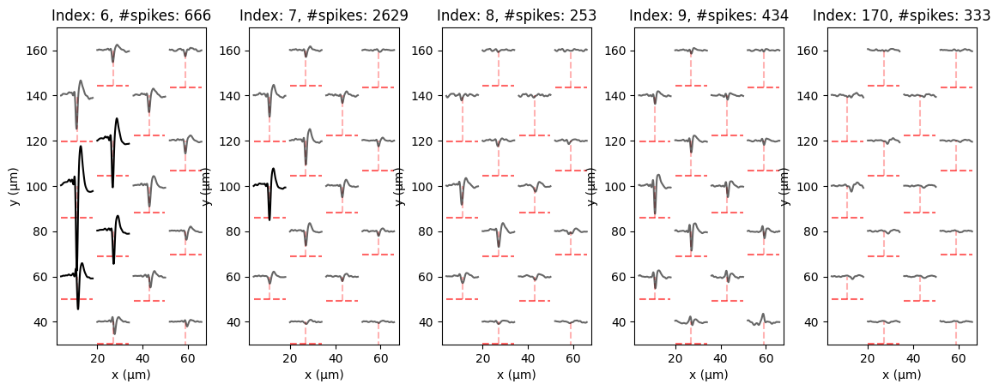

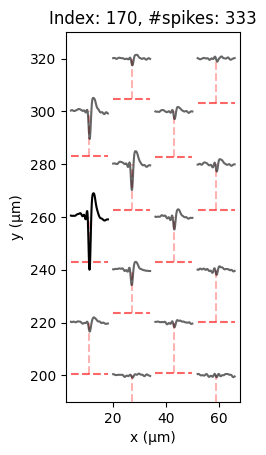

--------------------------------------------------


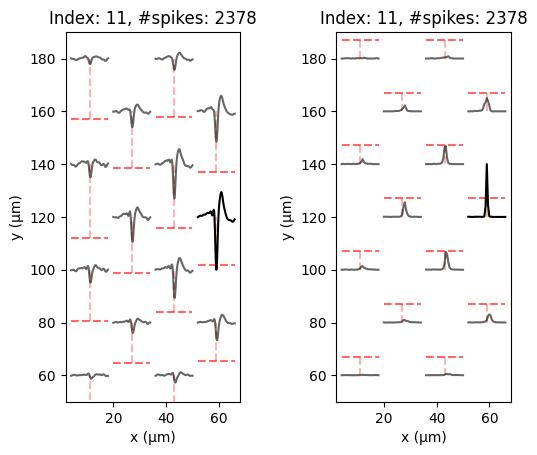

Unit 10: 0.37046837787774545
Unit 165: 0.44769403824521936


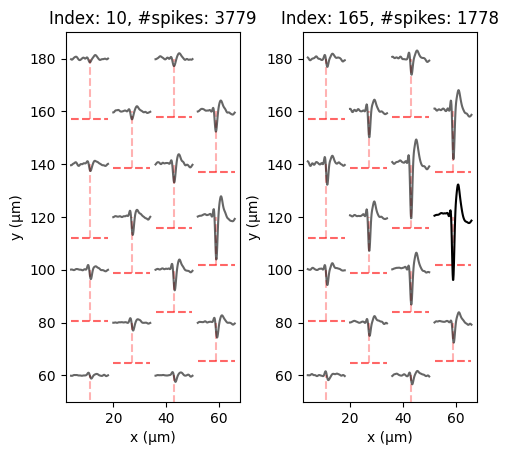

--------------------------------------------------


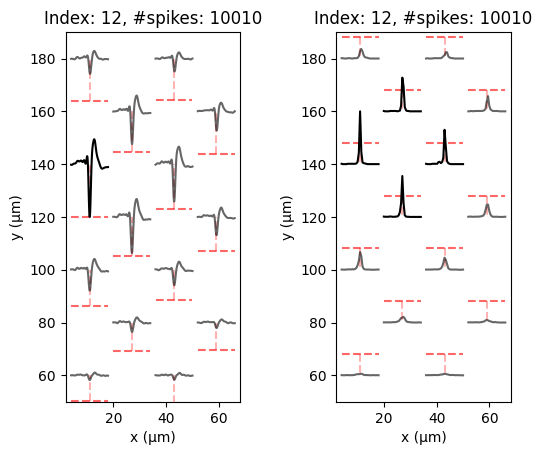

Unit 11: 0.5048500881834215
Unit 12: 0.1920583468395462
Unit 13: 0.7758124228712464
Unit 14: 0.6484432458936014
Unit 15: 0.385558583106267
Unit 17: 0.2481602616516762
Unit 28: 0.023524189968930315
Unit 31: 0.03726362625139043
Unit 44: 0.02702702702702703
Unit 77: 0.02056555269922879
Unit 80: 0.02695115103874228
Unit 102: 0.03482587064676617
Unit 104: 0.029917726252804786
Unit 114: 0.02637749120750293
Unit 122: 0.02315410342166195
Unit 125: 0.027852477910103726
Unit 126: 0.021258503401360544
Unit 133: 0.027403414195867025
Unit 136: 0.04028436018957346
Unit 166: 0.6270096463022508
Unit 167: 0.09244532803180915
Unit 187: 0.027722772277227723
Unit 200: 0.7441673370876911
Unit 212: 0.03598484848484849


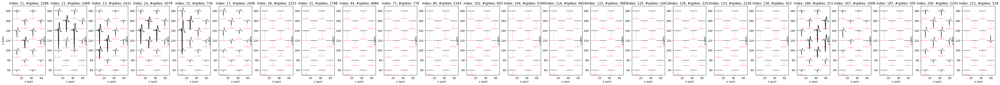

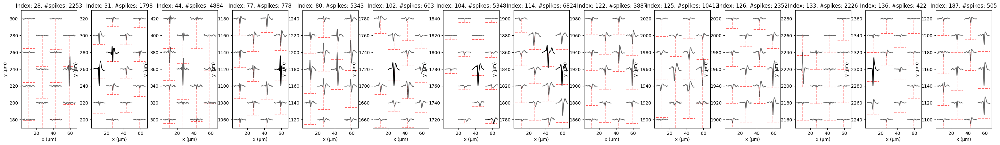

--------------------------------------------------


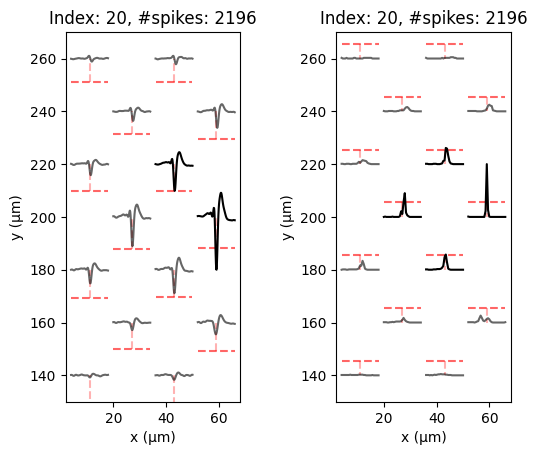

Unit 18: 0.5488474204171241
Unit 19: 0.37532535137948986
Unit 20: 0.2995991983967936
Unit 168: 0.36527514231499053


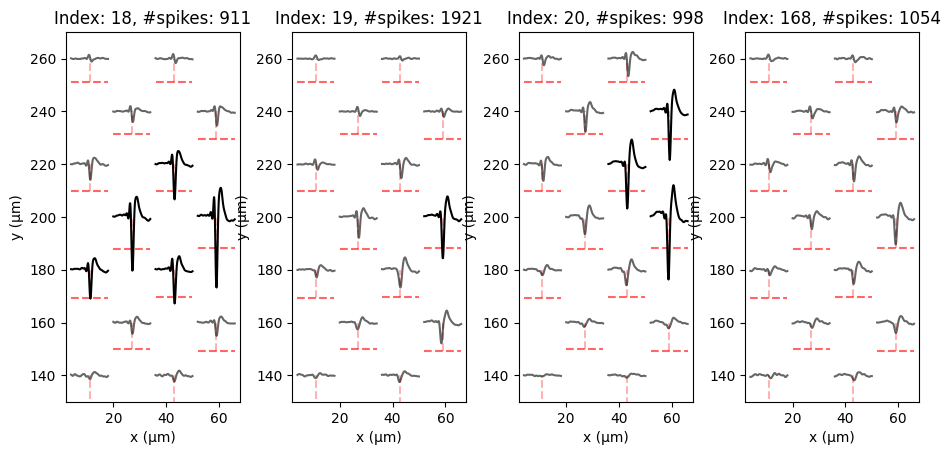

--------------------------------------------------


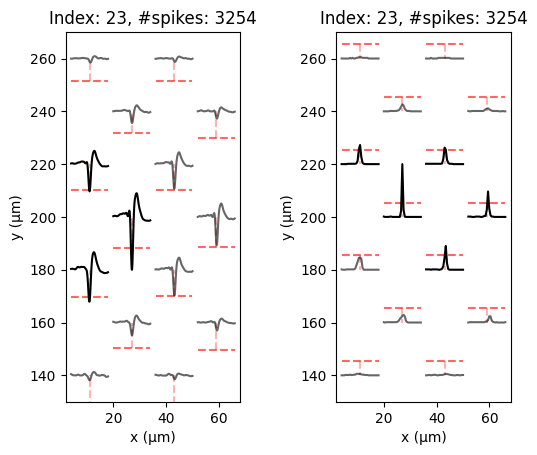

Unit 22: 0.4830917874396135
Unit 23: 0.5414920368818106


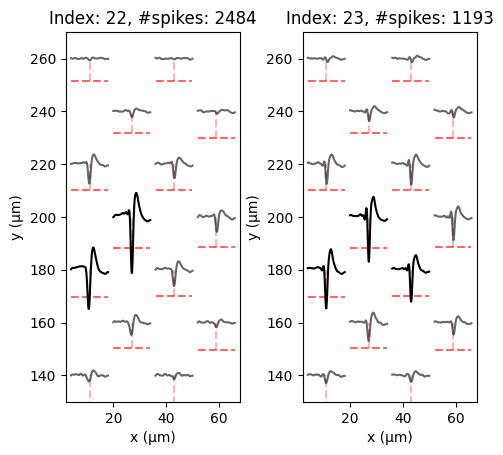

--------------------------------------------------


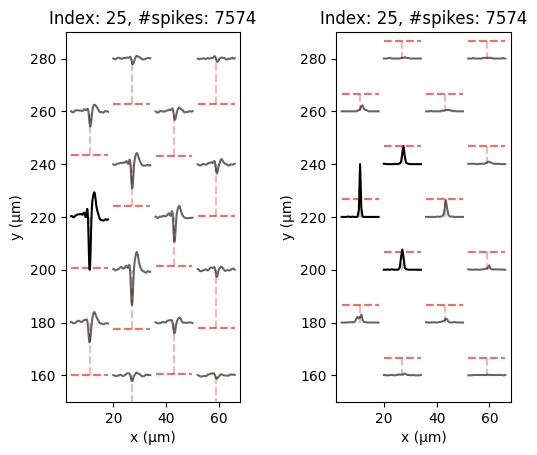

Unit 24: 0.17574257425742573
Unit 25: 0.7827004219409283
Unit 26: 0.7273915316257188
Unit 206: 0.16824644549763032
Unit 218: 0.5016891891891891
Unit 222: 0.036734693877551024


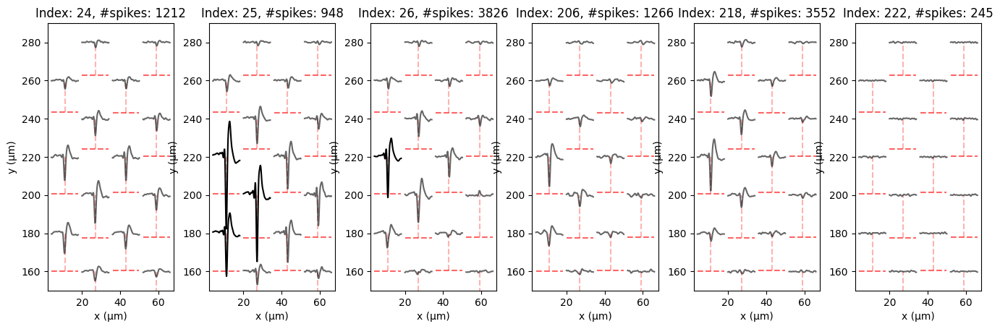

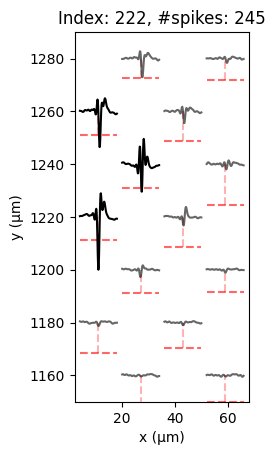

--------------------------------------------------


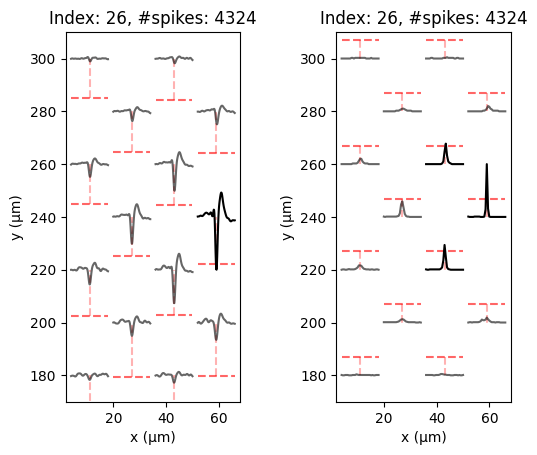

Unit 27: 0.608156737305078
Unit 29: 0.3059610705596107
Unit 169: 0.5425742574257426


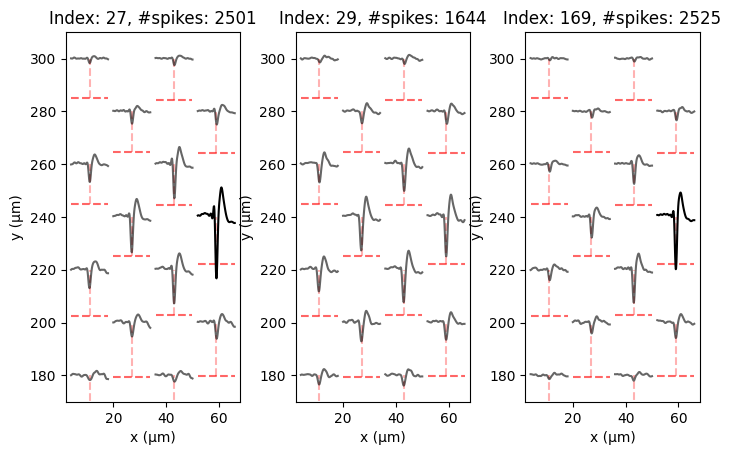

--------------------------------------------------


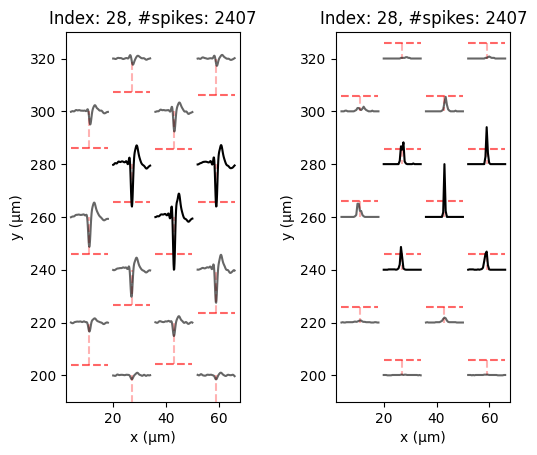

Unit 30: 0.5905752753977969
Unit 32: 0.4290693621470896


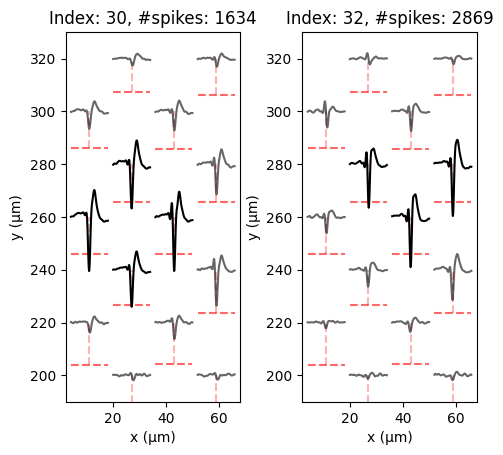

--------------------------------------------------


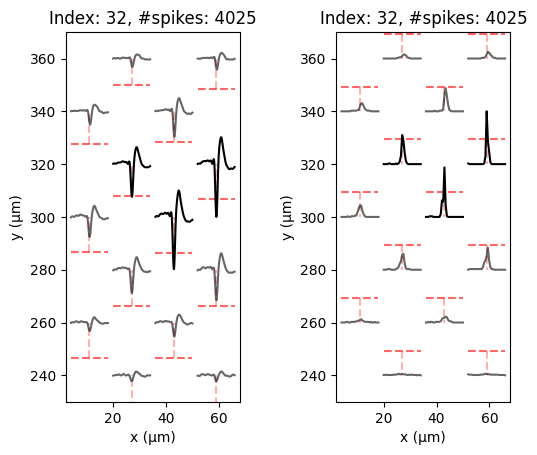

Unit 34: 0.6336779911373708
Unit 35: 0.3818589025755879
Unit 38: 0.9096418732782369
Unit 172: 0.542711234911792
Unit 174: 0.0858662613981763


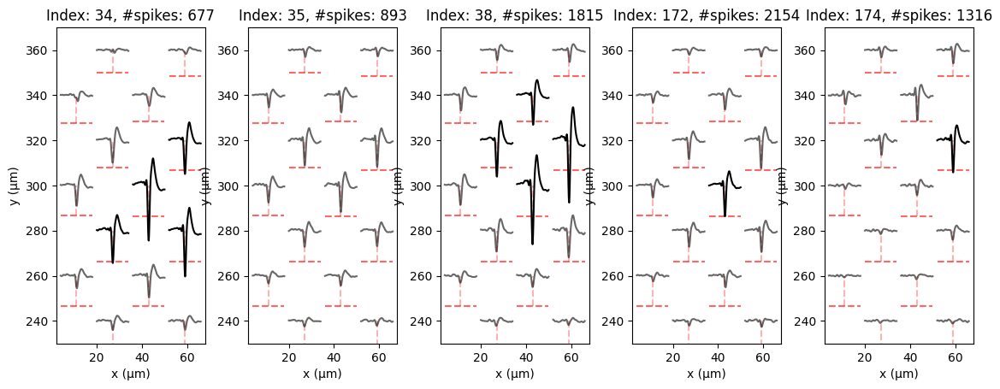

--------------------------------------------------


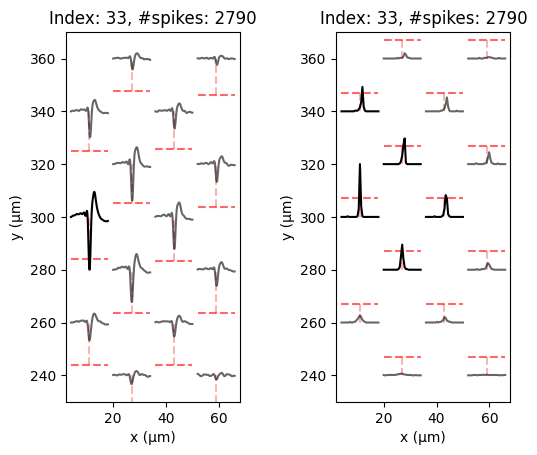

Unit 36: 0.8527227722772277
Unit 37: 0.1650294695481336


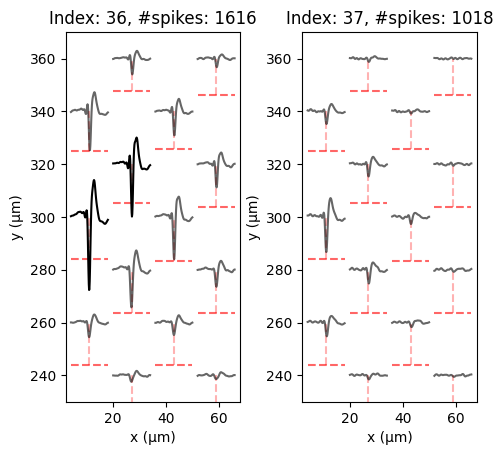

--------------------------------------------------


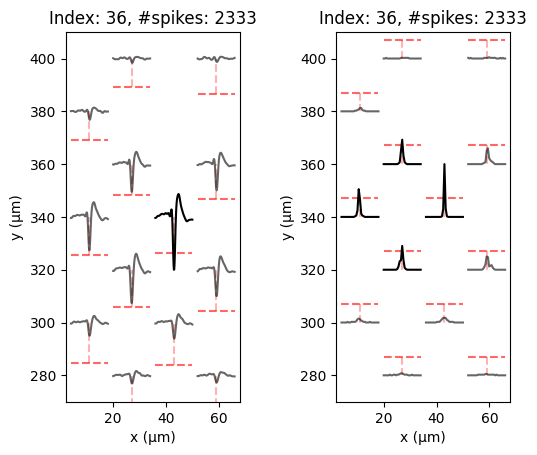

Unit 39: 0.927710843373494
Unit 41: 0.7372488408037094
Unit 176: 0.598501872659176


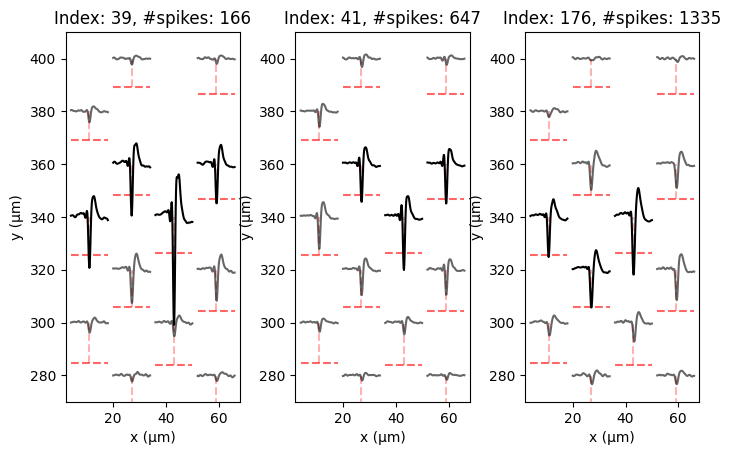

--------------------------------------------------


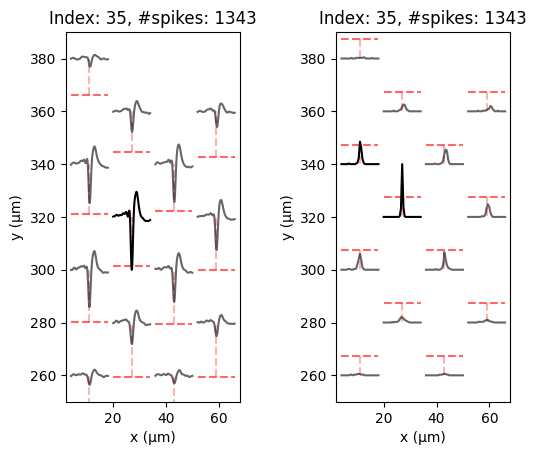

Unit 40: 0.4126250962278676
Unit 175: 0.24533333333333332


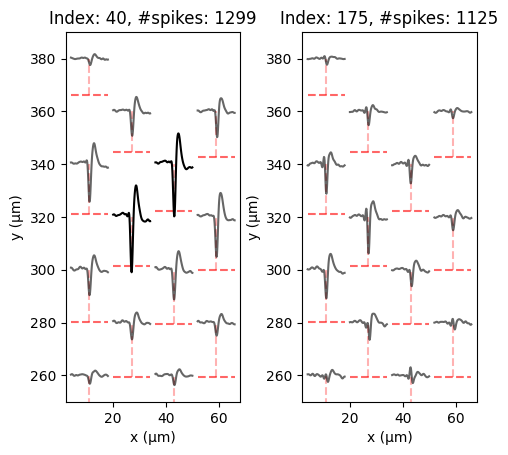

--------------------------------------------------


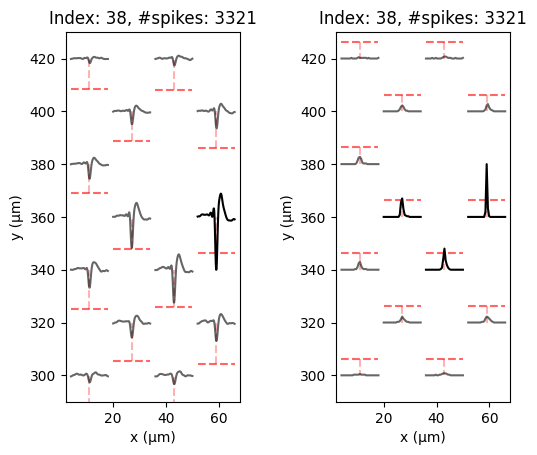

Unit 43: 0.3459082994776553
Unit 127: 0.02508361204013378
Unit 177: 0.8879310344827587
Unit 178: 0.4605714285714286


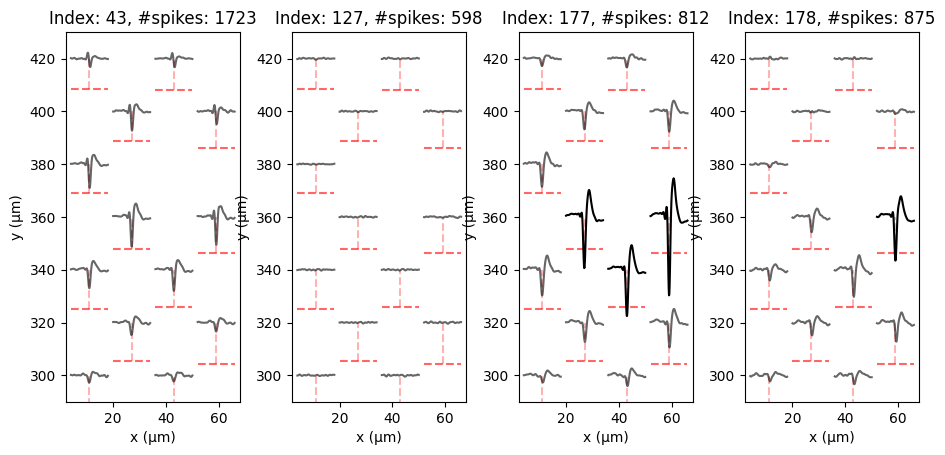

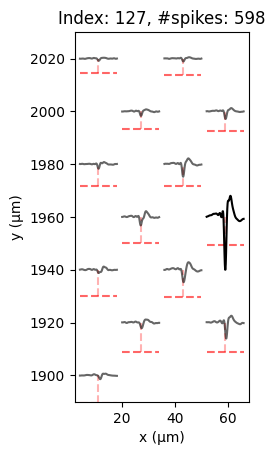

--------------------------------------------------


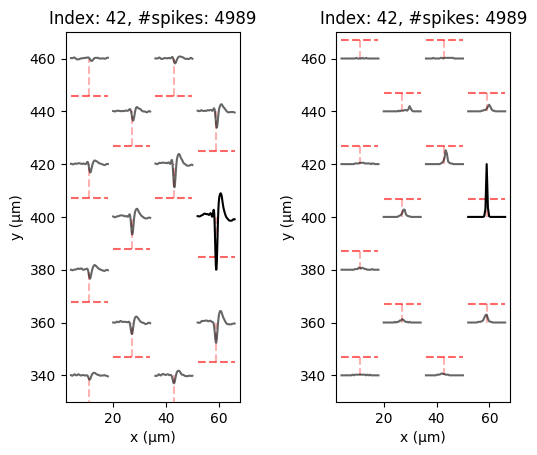

Unit 45: 0.5956964892412231
Unit 121: 0.037463976945244955
Unit 179: 0.8668341708542714
Unit 210: 0.39821981424148606
Unit 220: 0.24634655532359082


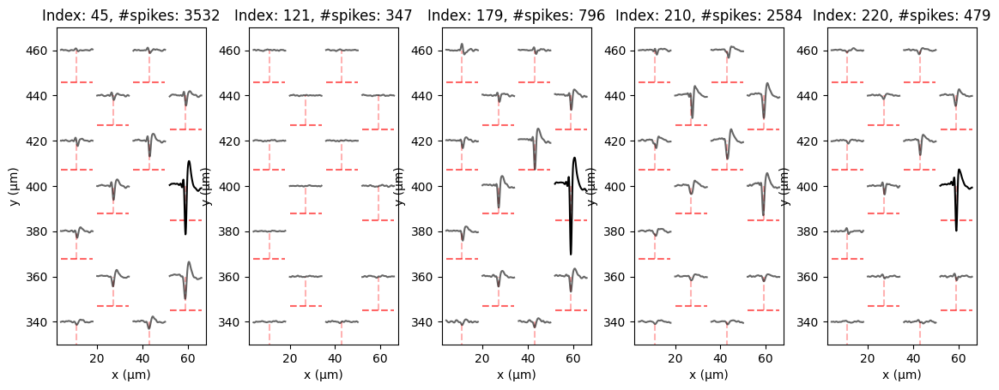

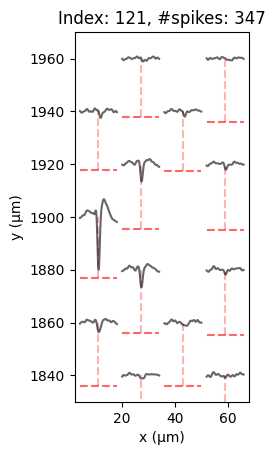

--------------------------------------------------


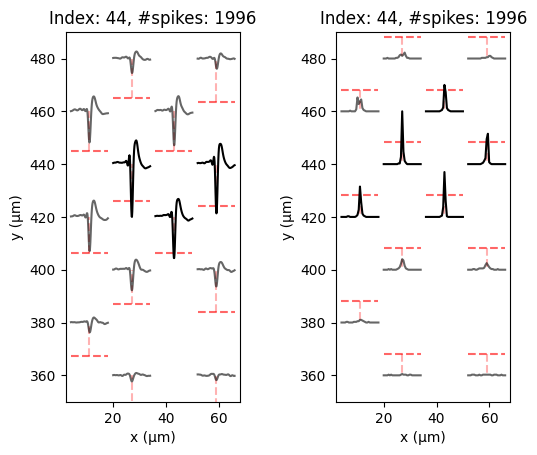

Unit 46: 0.3361934477379095
Unit 50: 0.579185520361991
Unit 181: 0.9285714285714286


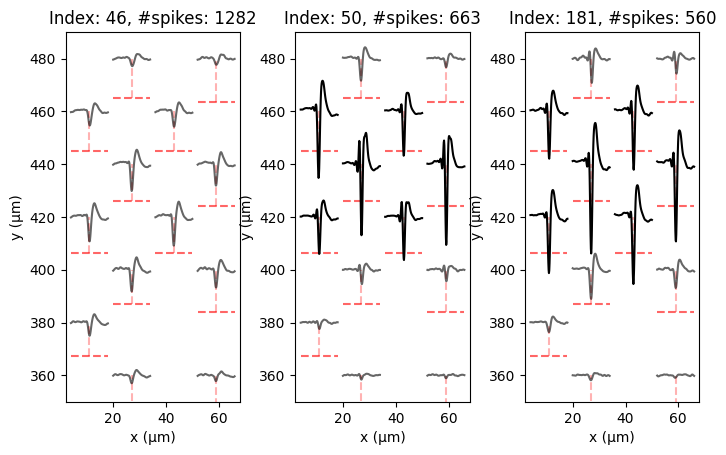

--------------------------------------------------


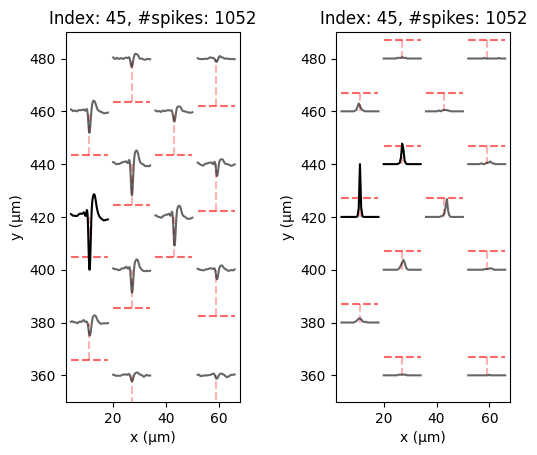

Unit 47: 0.12361419068736142
Unit 48: 0.6682027649769585


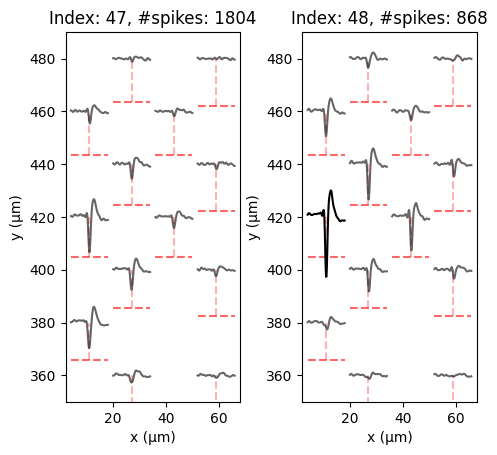

--------------------------------------------------


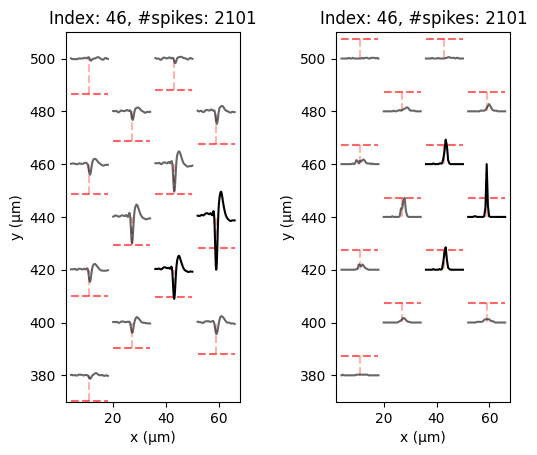

Unit 49: 0.7299843014128728
Unit 180: 0.20483870967741935


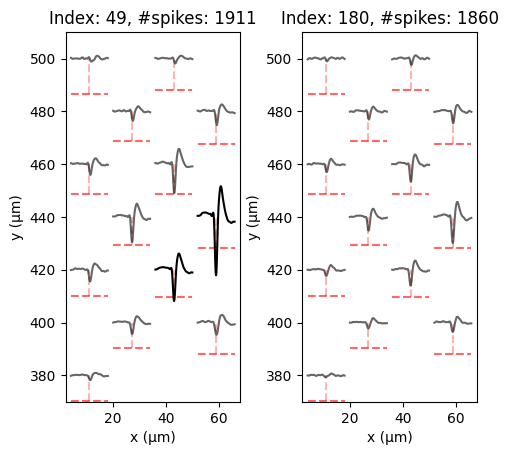

--------------------------------------------------


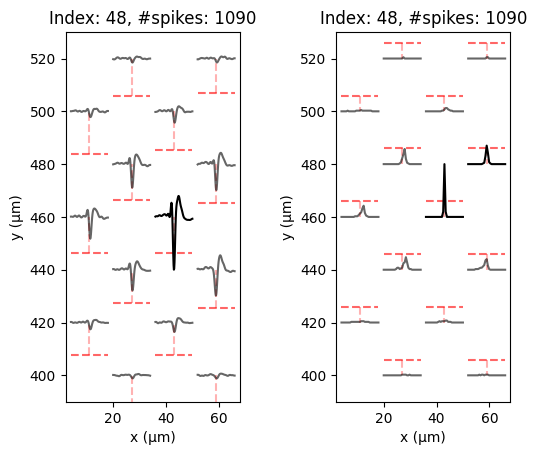

Unit 51: 0.4112271540469974
Unit 52: 0.2613111726685134
Unit 211: 0.313953488372093


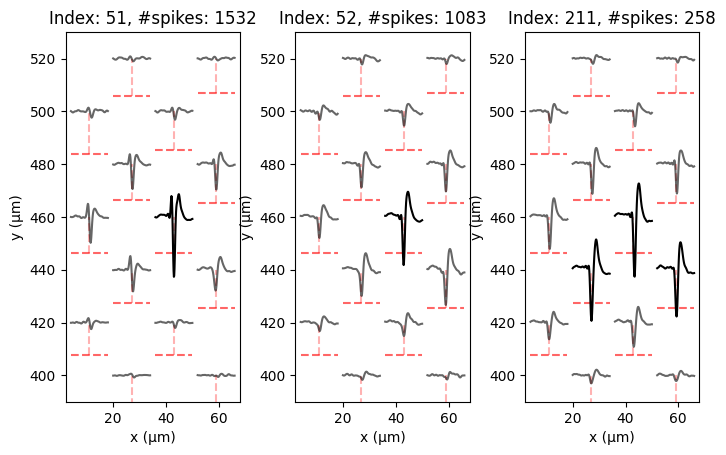

--------------------------------------------------


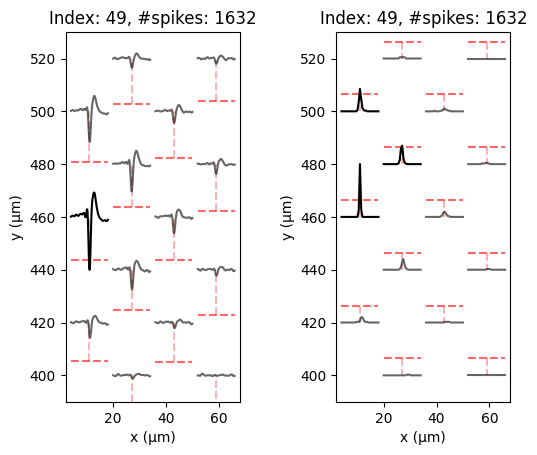

Unit 53: 0.6334140435835351
Unit 213: 0.10403832991101986


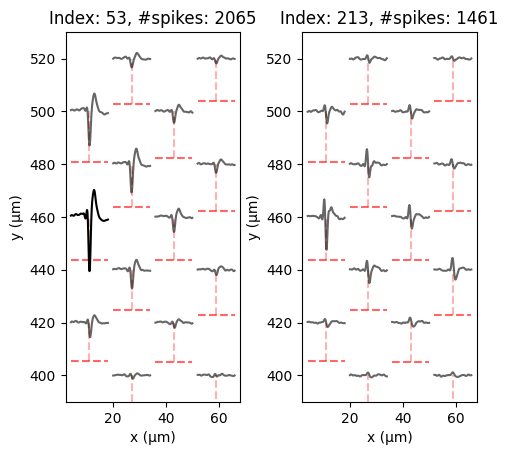

--------------------------------------------------


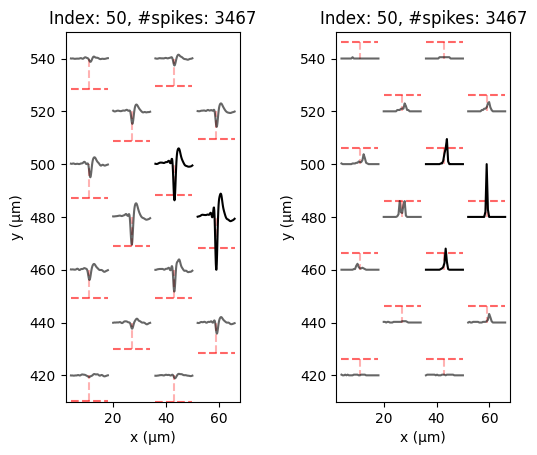

Unit 54: 0.8844169246646026
Unit 55: 0.8998756218905473


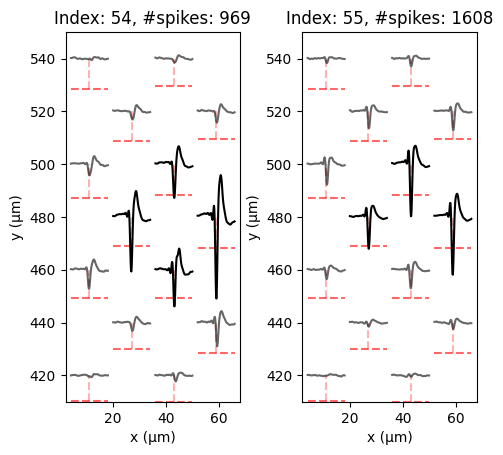

--------------------------------------------------


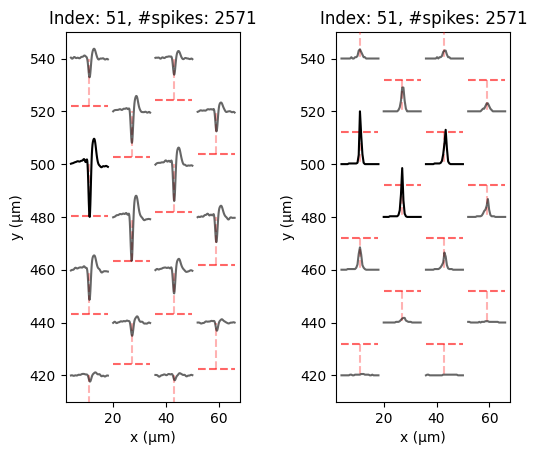

Unit 56: 0.4406631762652705
Unit 182: 0.5014880952380952


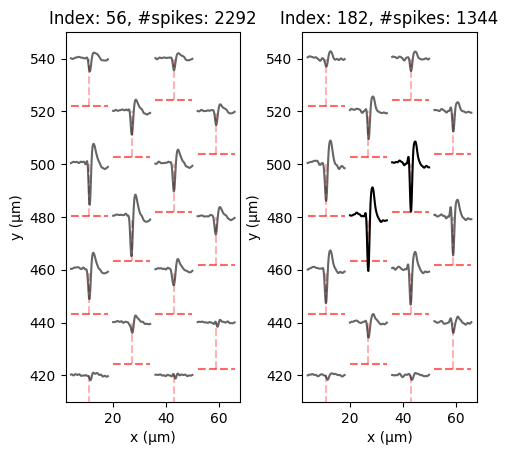

--------------------------------------------------


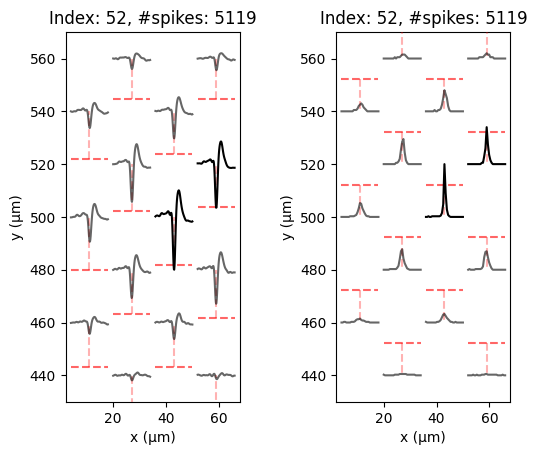

Unit 58: 0.2964705882352941
Unit 183: 0.411829134720701
Unit 214: 0.5024383635871038


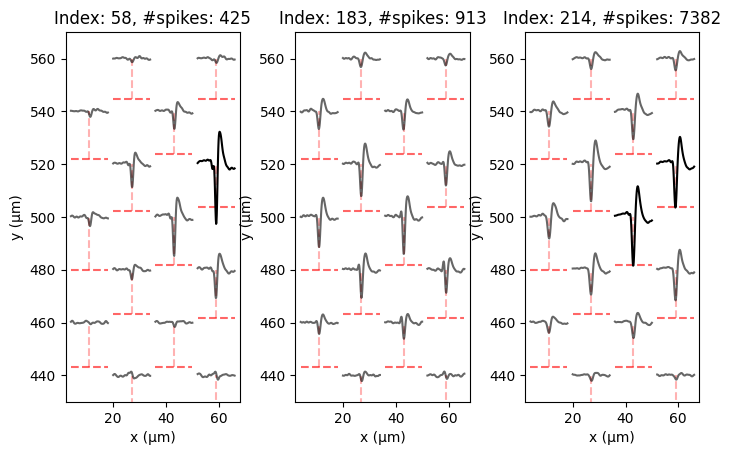

--------------------------------------------------


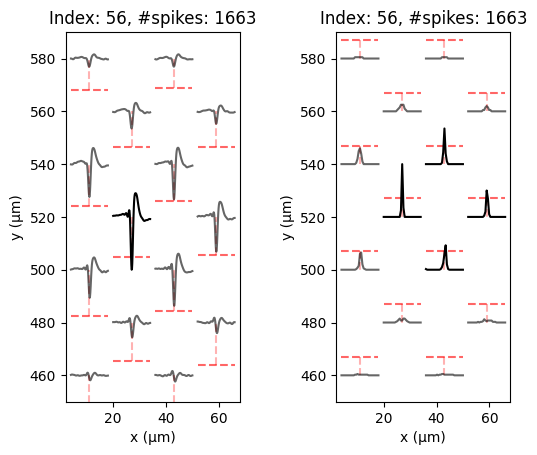

Unit 59: 0.651705565529623
Unit 184: 0.723563696919234


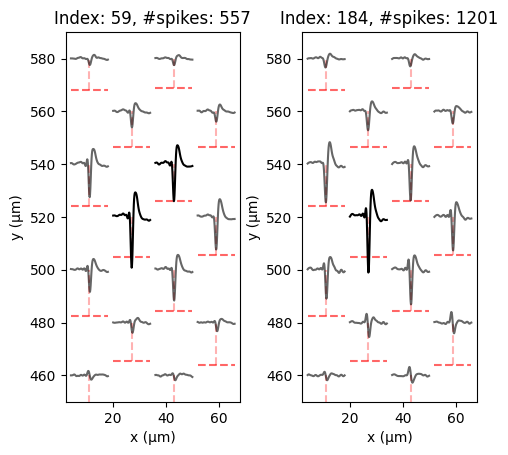

--------------------------------------------------


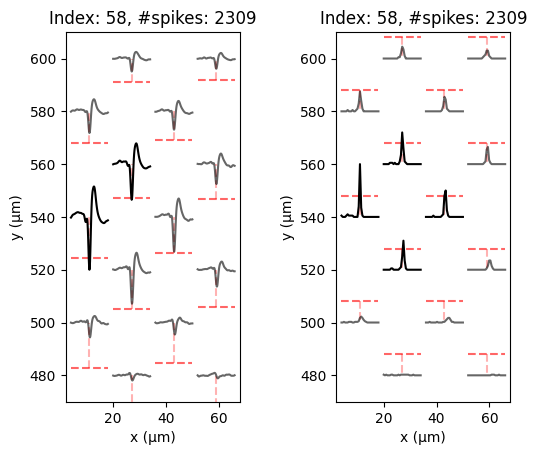

Unit 60: 0.8785123966942149
Unit 61: 0.2010928961748634
Unit 185: 0.08938814531548757


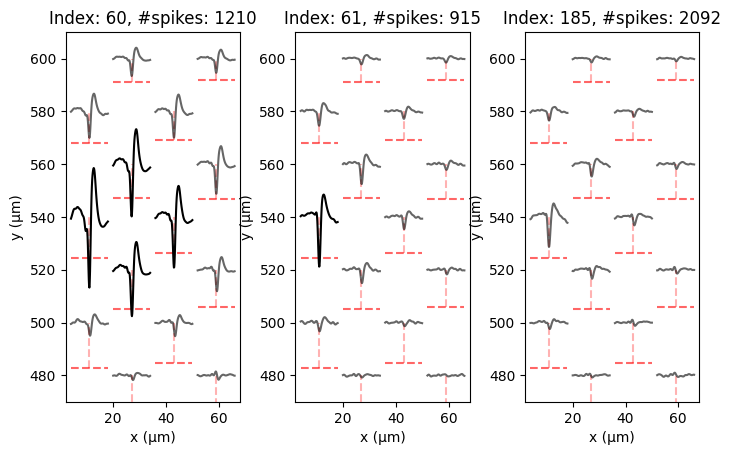

--------------------------------------------------


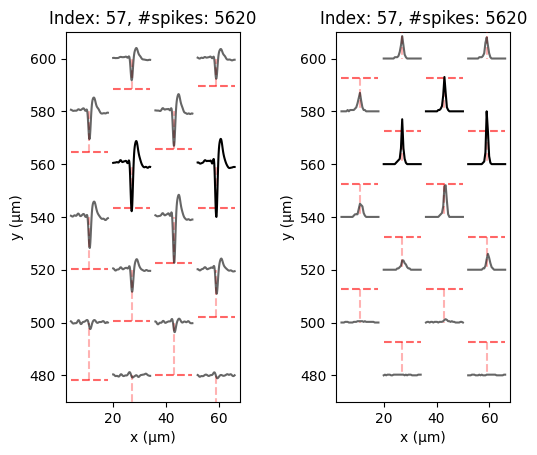

Unit 62: 0.5232371794871795
Unit 63: 0.875
Unit 64: 0.773125
Unit 186: 0.6705336426914154
Unit 201: 0.4264705882352941
Unit 202: 0.4360730593607306


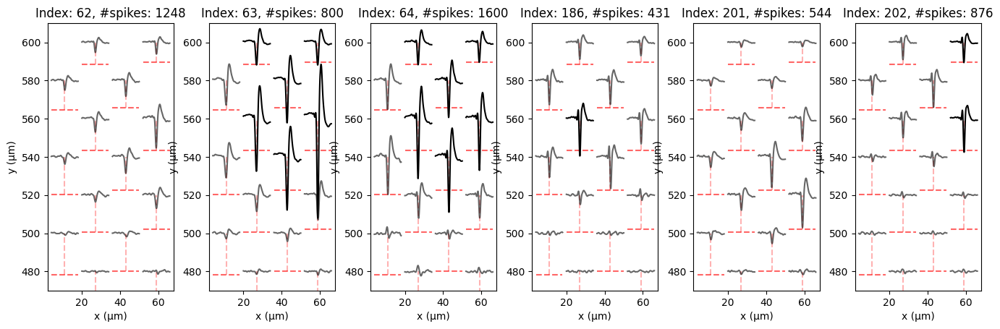

--------------------------------------------------


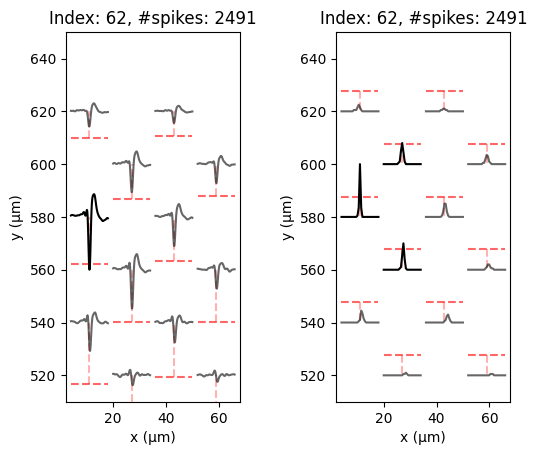

Unit 65: 0.5499405469678954
Unit 66: 0.3919499804611176
Unit 67: 0.0647342995169082


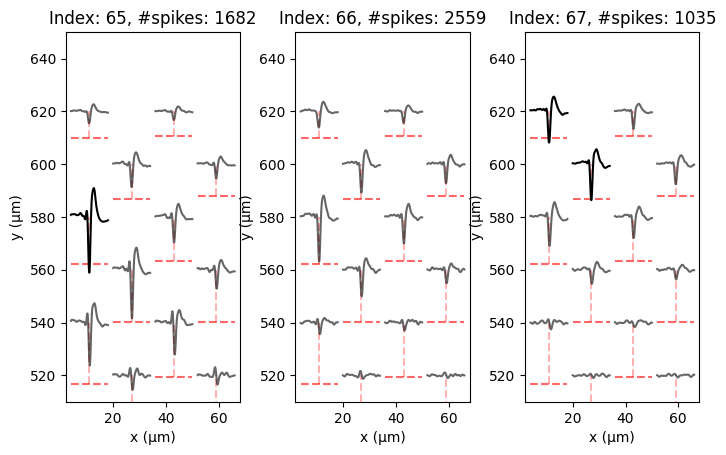

--------------------------------------------------


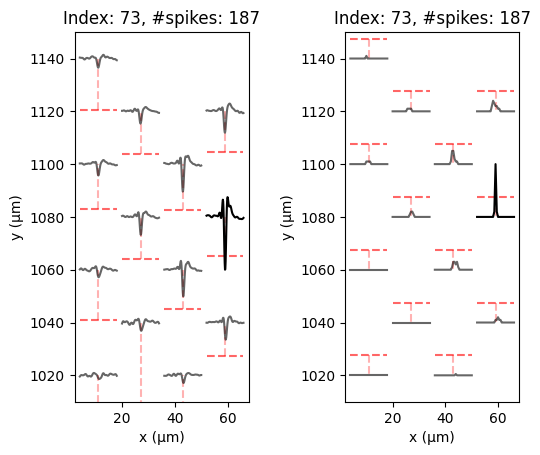

Unit 73: 0.4251968503937008
Unit 74: 0.05649717514124294


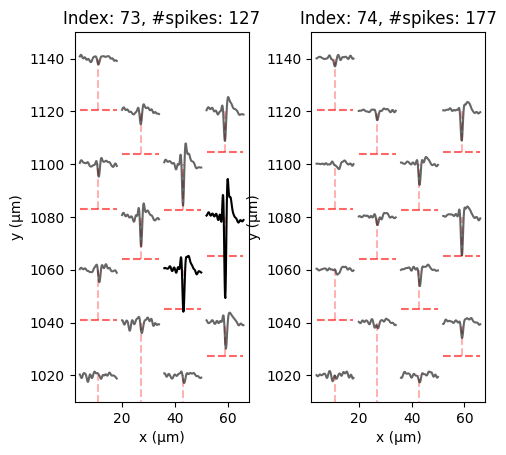

--------------------------------------------------


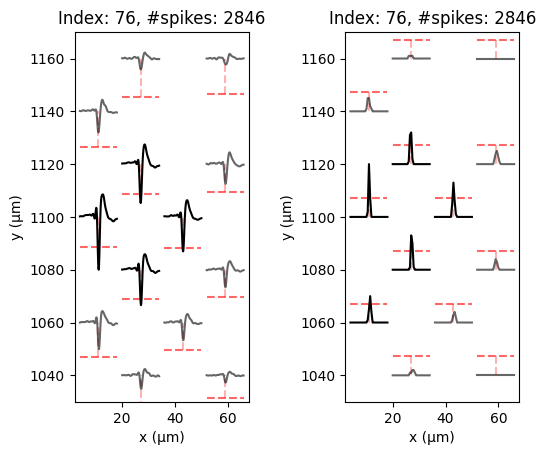

Unit 75: 0.9101796407185628
Unit 76: 0.7477996965098634


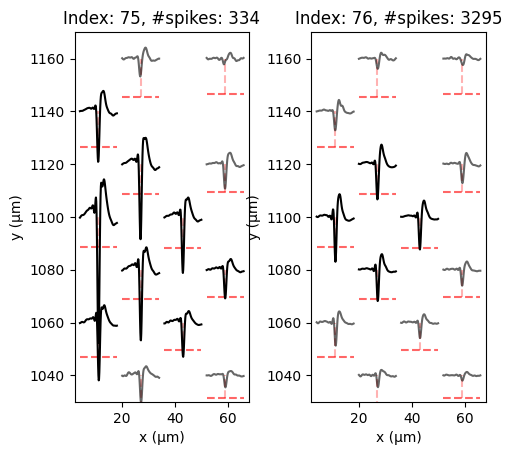

--------------------------------------------------


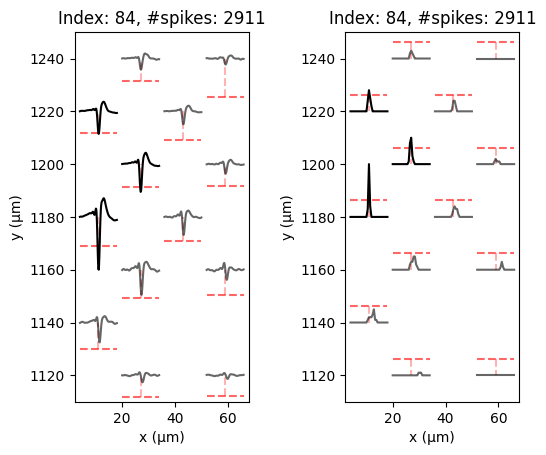

Unit 78: 0.7379209370424598
Unit 81: 0.8189216683621566
Unit 82: 0.16203703703703703
Unit 83: 0.10011041589988959
Unit 86: 0.06395906619763352


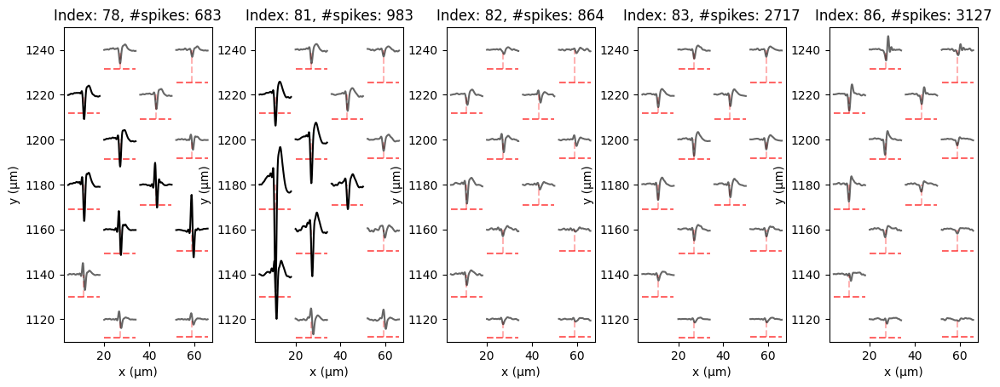

--------------------------------------------------


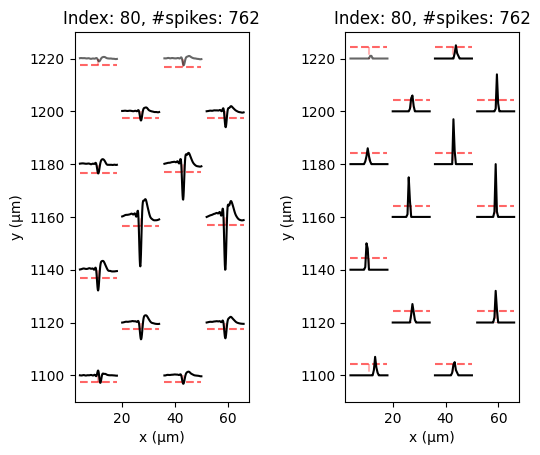

Unit 79: 0.9298780487804879
Unit 84: 0.11559139784946236
Unit 207: 0.8390297684674752


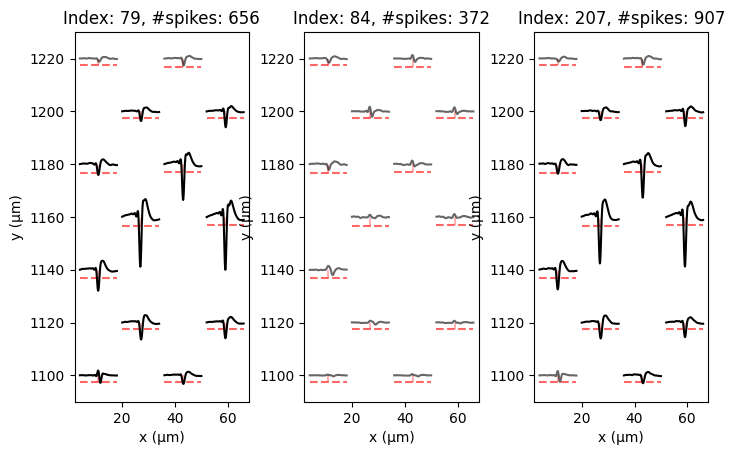

--------------------------------------------------


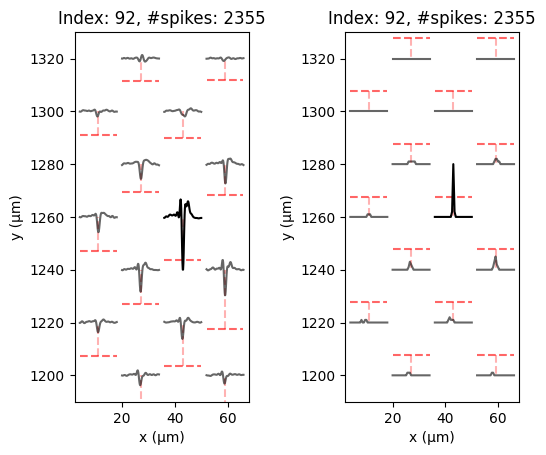

Unit 85: 0.15230224321133412
Unit 89: 0.2118466898954704
Unit 91: 0.18316831683168316
Unit 188: 0.48375184638109303


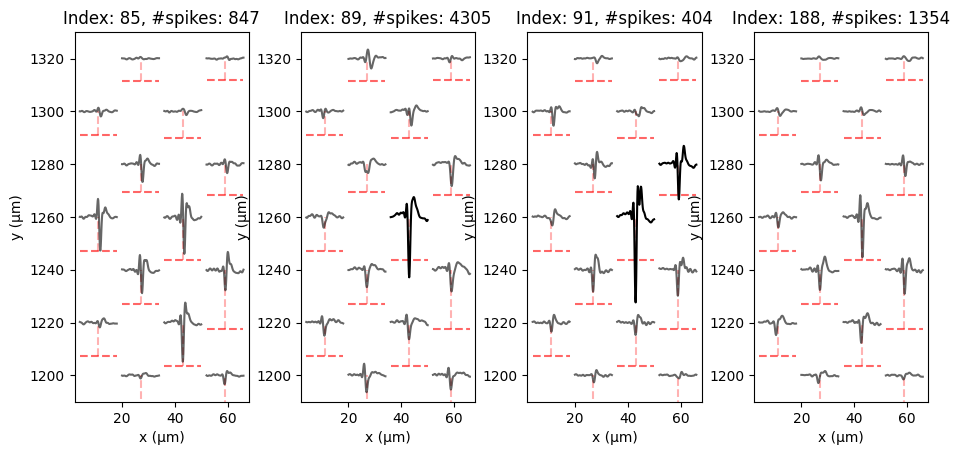

--------------------------------------------------


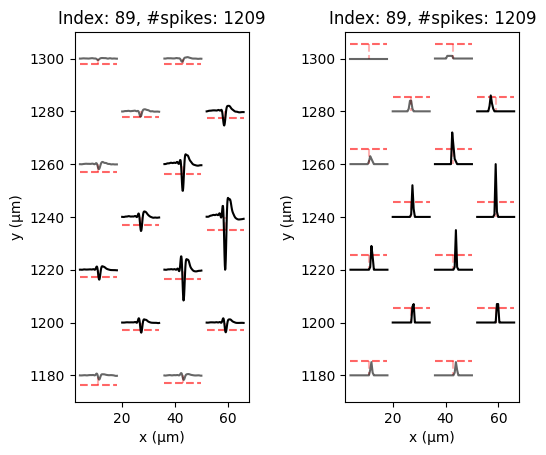

Unit 87: 0.9987995198079231
Unit 90: 0.10621761658031088


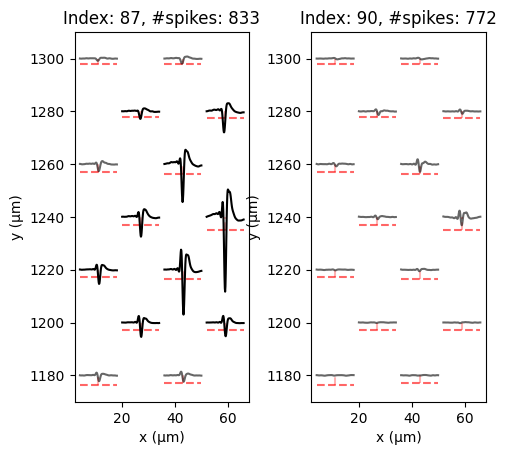

--------------------------------------------------


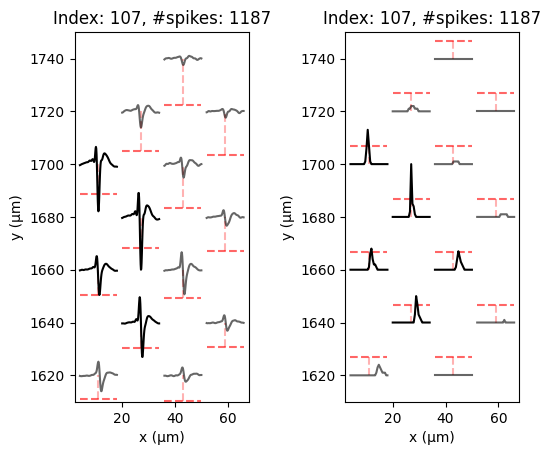

Unit 96: 0.31800766283524906
Unit 97: 0.757679180887372
Unit 99: 0.12359550561797752
Unit 189: 0.6547619047619048


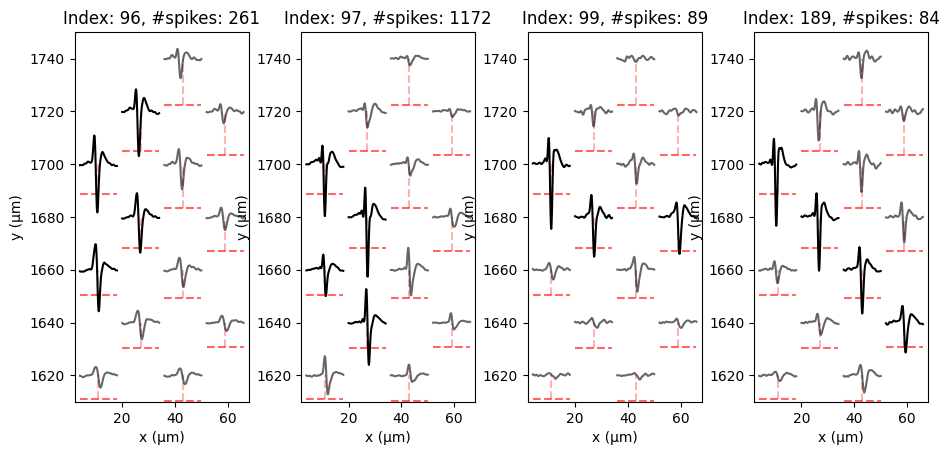

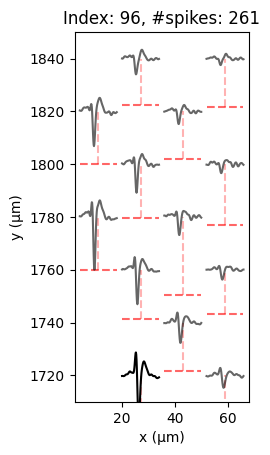

--------------------------------------------------


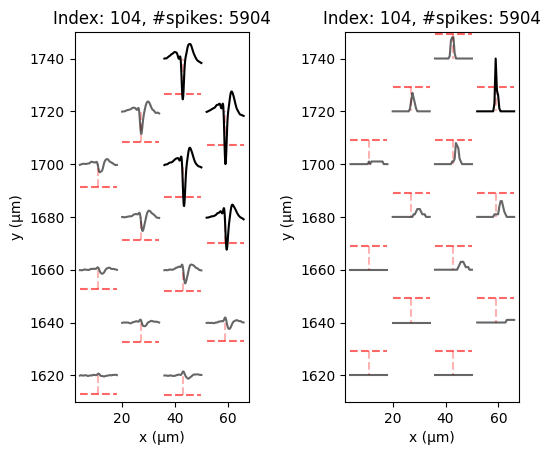

Unit 100: 0.90744920993228
Unit 131: 0.024630541871921183
Unit 221: 0.5095693779904307


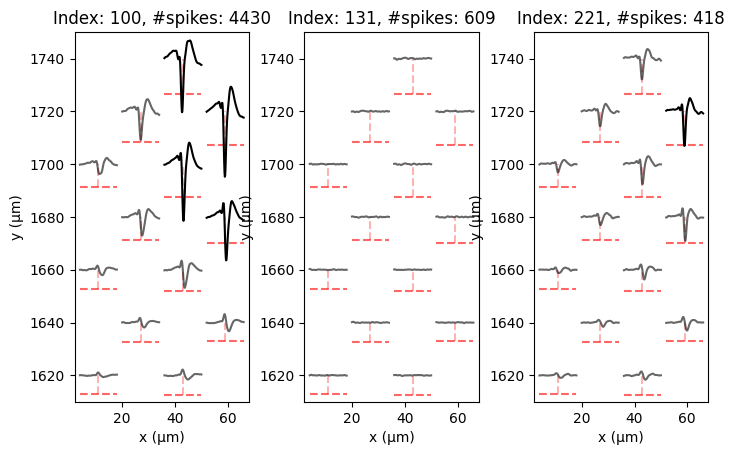

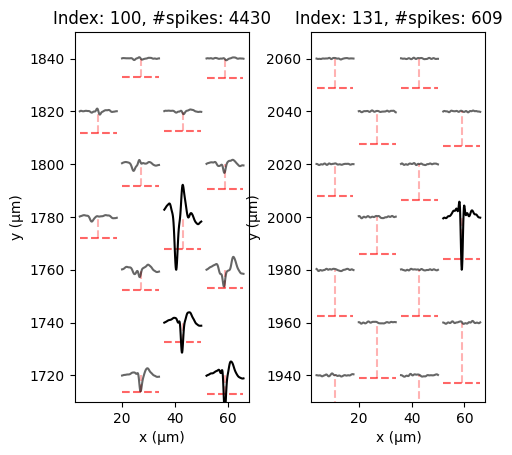

--------------------------------------------------


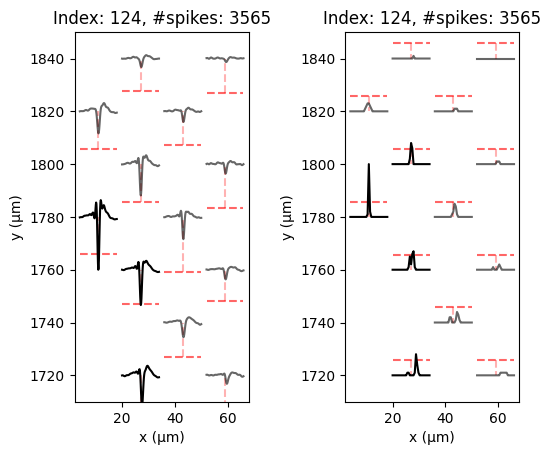

Unit 101: 0.5946681175190425
Unit 105: 0.7297297297297297
Unit 106: 0.4747292418772563
Unit 107: 0.9471544715447154


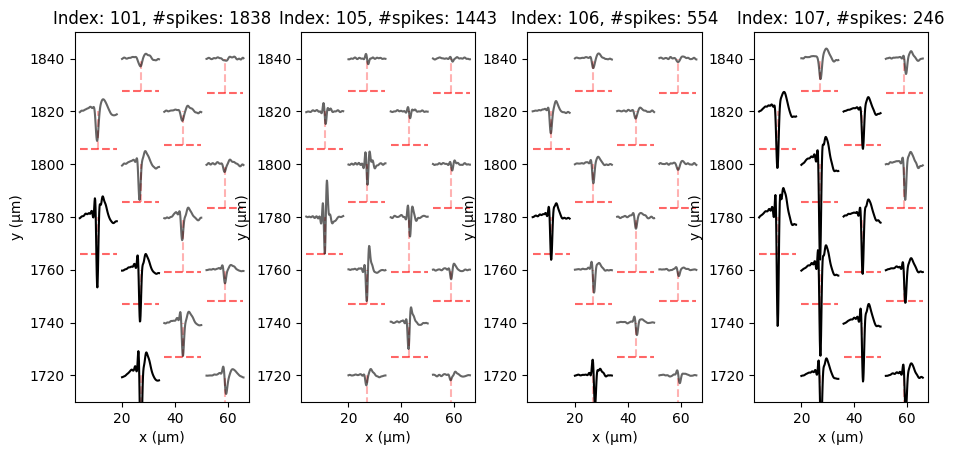

--------------------------------------------------


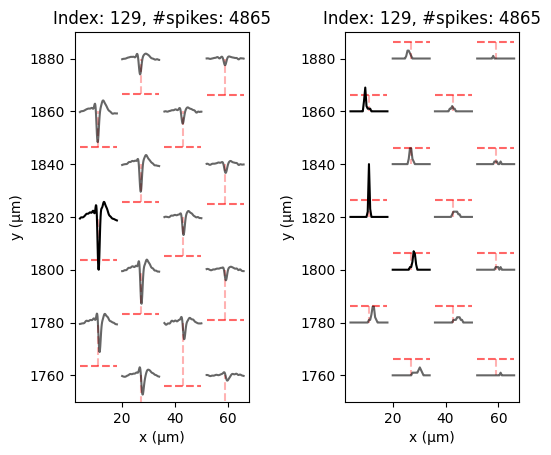

Unit 110: 0.5018587360594795
Unit 111: 0.7852816474863719
Unit 120: 0.26974483596597815


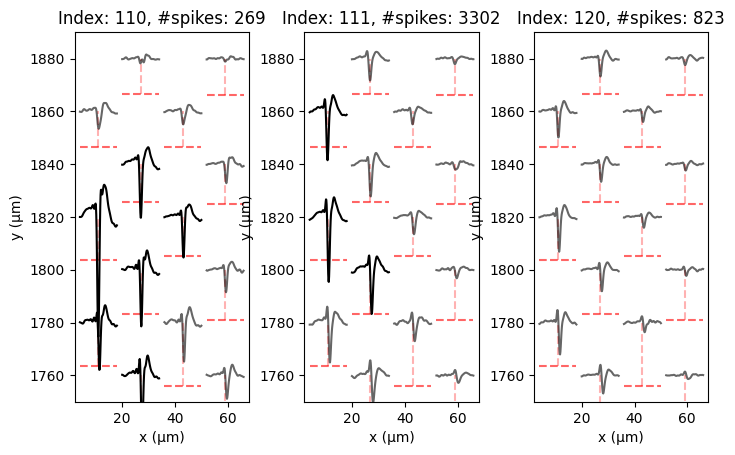

--------------------------------------------------


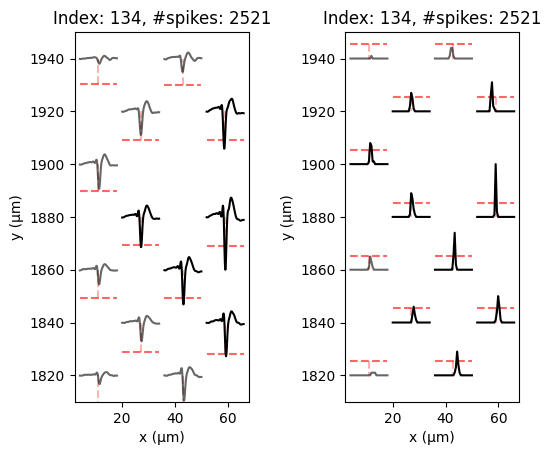

Unit 112: 0.026785714285714284
Unit 117: 0.06689834926151172
Unit 118: 0.02843601895734597
Unit 191: 0.6536796536796536
Unit 192: 0.44076655052264807
Unit 199: 0.6693548387096774
Unit 204: 0.8585699263932702


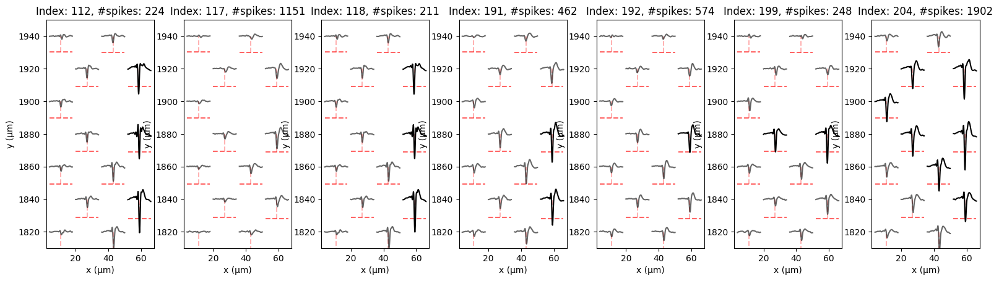

--------------------------------------------------


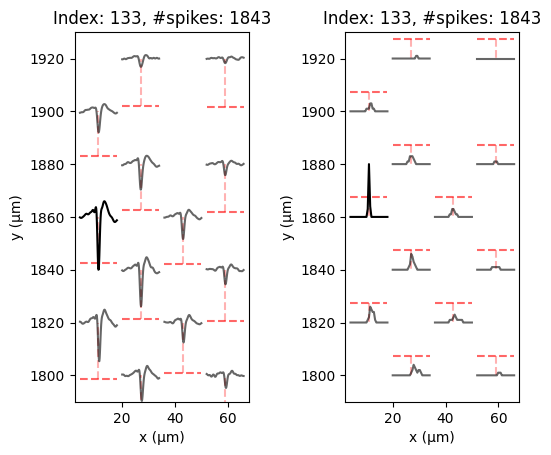

Unit 113: 0.045037531276063386
Unit 115: 0.36231884057971014
Unit 116: 0.48768115942028983


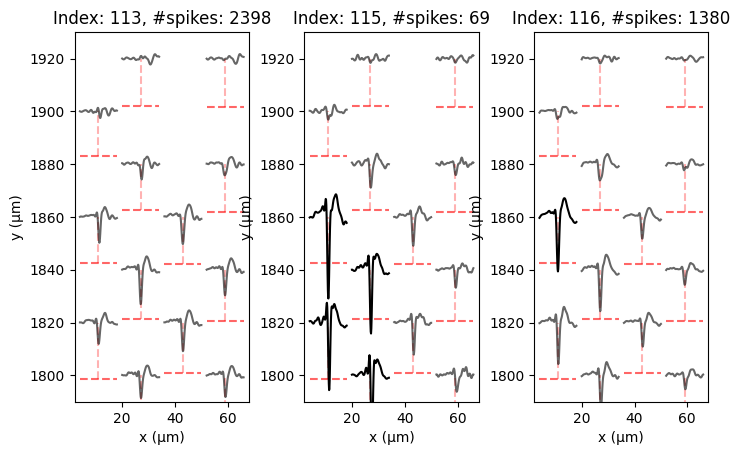

--------------------------------------------------


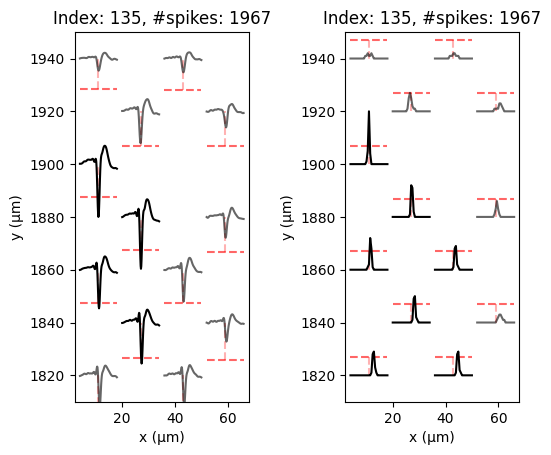

Unit 119: 0.8794579172610556
Unit 190: 0.8094545454545454


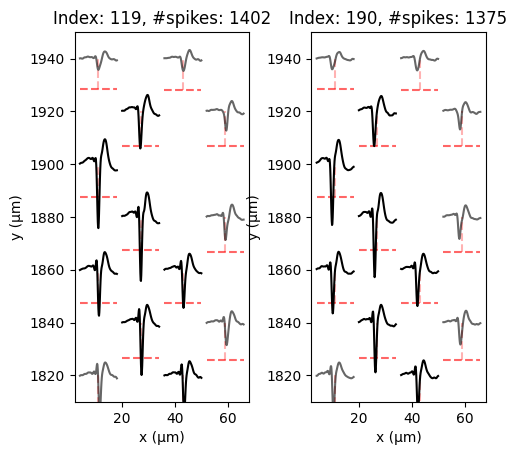

--------------------------------------------------


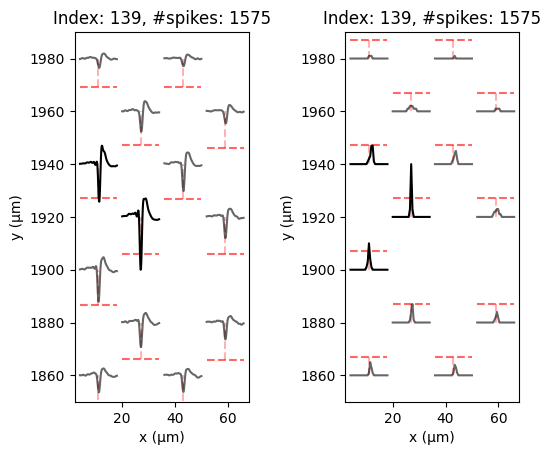

Unit 124: 0.9007633587786259
Unit 128: 0.05759162303664921


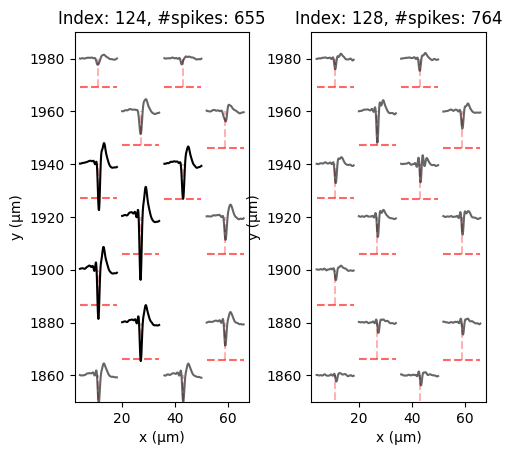

--------------------------------------------------


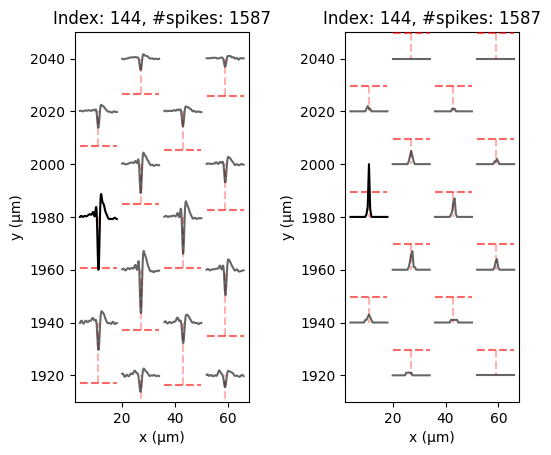

Unit 129: 0.6276445698166432
Unit 130: 0.12387096774193548


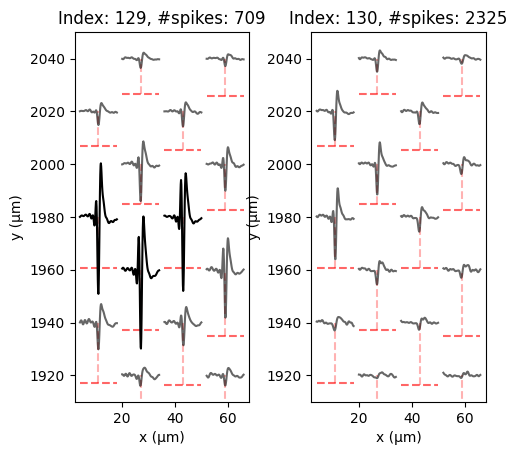

--------------------------------------------------


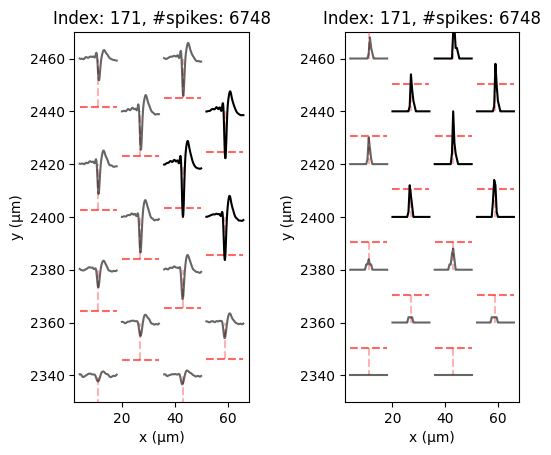

Unit 132: 0.027832566294104754
Unit 139: 0.03206477732793522
Unit 144: 0.9262295081967213
Unit 146: 0.5981774788457366
Unit 147: 0.18809155050765788
Unit 148: 0.7352445193929174
Unit 162: 0.096
Unit 205: 0.7080745341614907
Unit 209: 0.0302734375


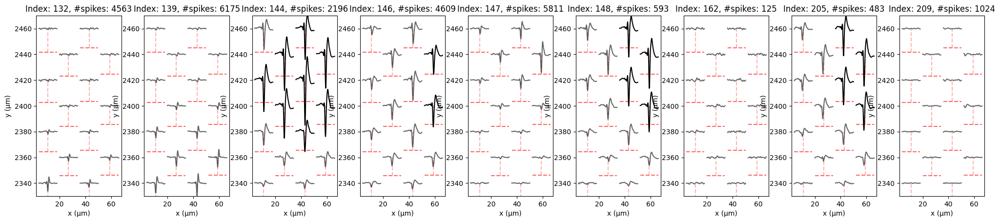

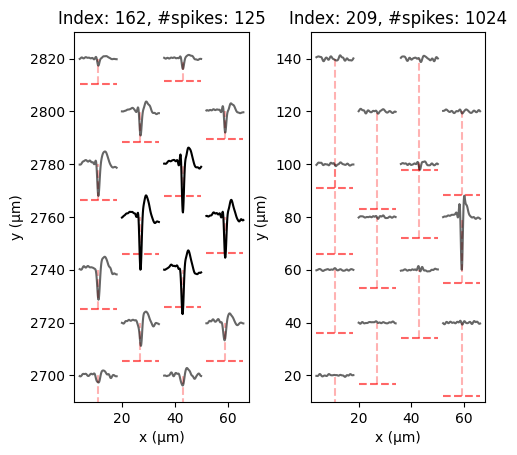

--------------------------------------------------


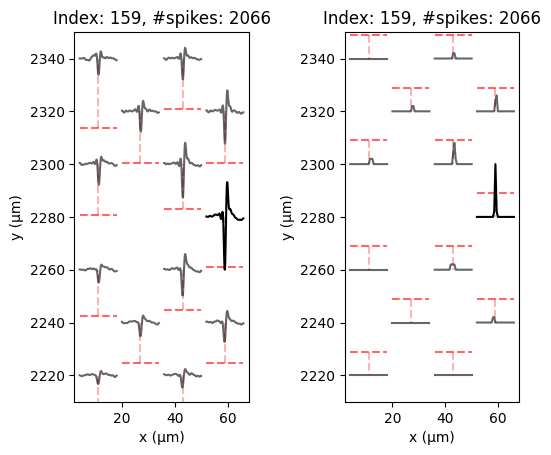

Unit 134: 0.0369008907111551
Unit 135: 0.3188752067634626


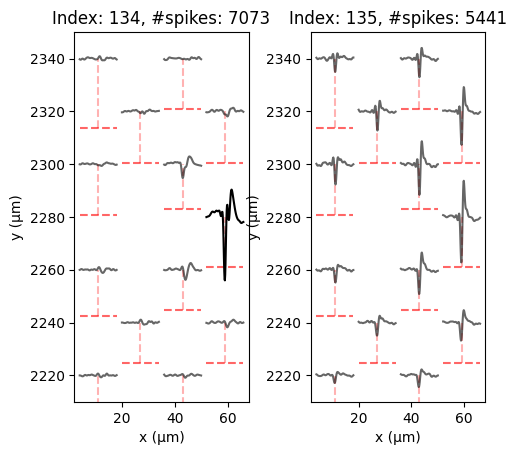

--------------------------------------------------


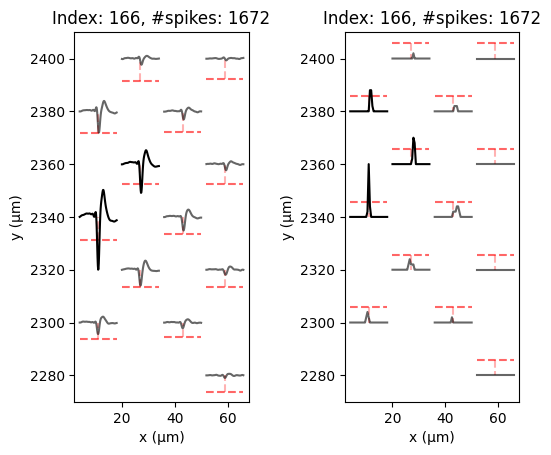

Unit 138: 0.971830985915493
Unit 140: 0.9132099553286535
Unit 193: 0.9716312056737588


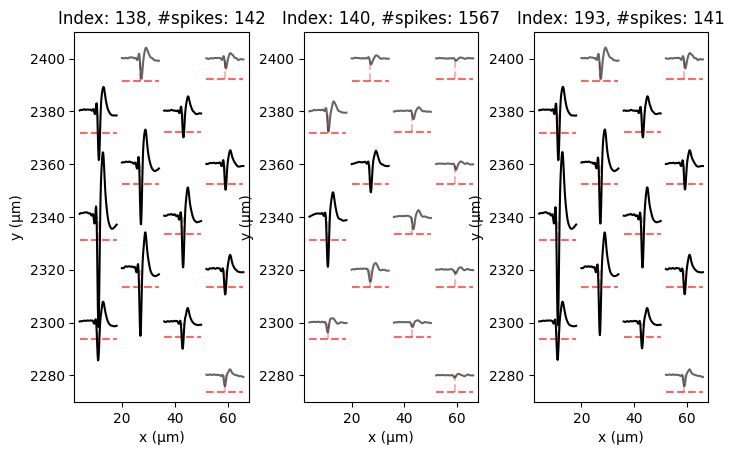

--------------------------------------------------


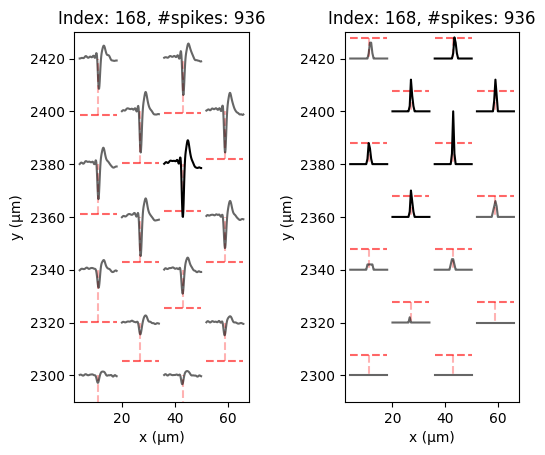

Unit 141: 0.08683473389355742
Unit 194: 0.7613636363636364


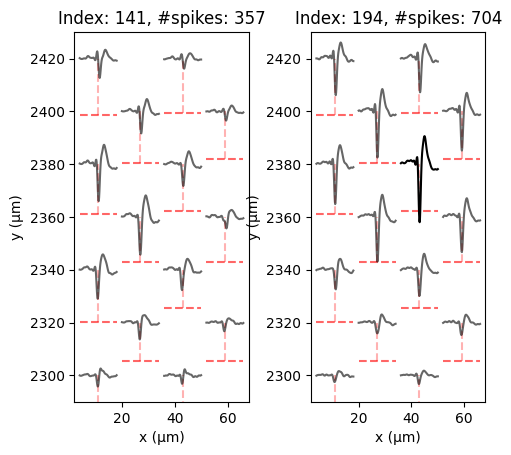

--------------------------------------------------


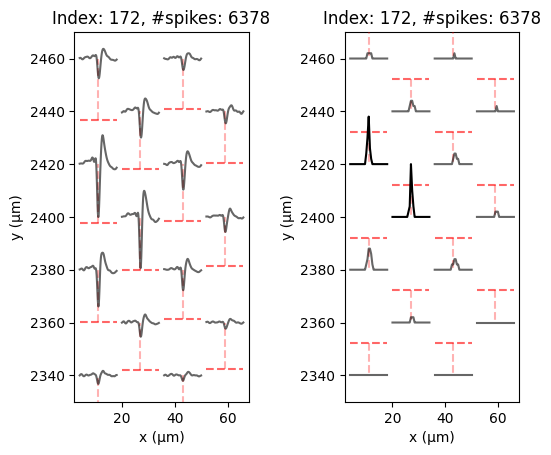

Unit 143: 0.8700906344410876
Unit 145: 0.9097472924187726
Unit 223: 0.7007575757575758


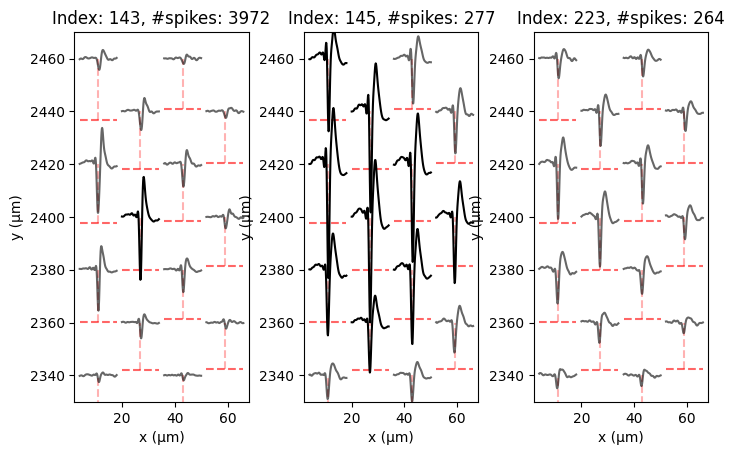

--------------------------------------------------


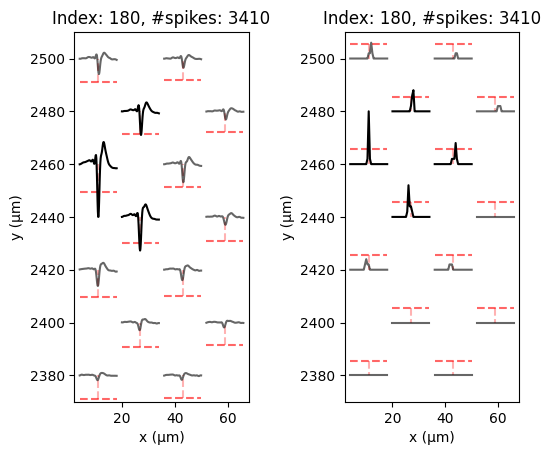

Unit 149: 0.43209876543209874
Unit 150: 0.5625
Unit 195: 0.12386058981233244
Unit 196: 0.2018348623853211
Unit 208: 0.9027093596059114
Unit 215: 0.04836309523809524


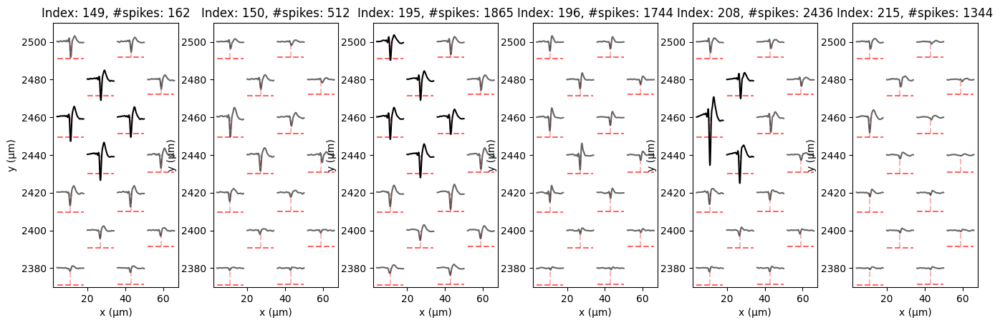

--------------------------------------------------


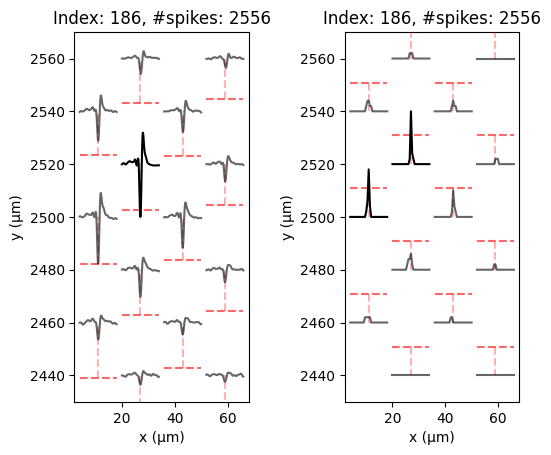

Unit 152: 0.40514246004169563
Unit 153: 0.7720075997466751
Unit 154: 0.08108108108108109
Unit 217: 0.038001407459535536


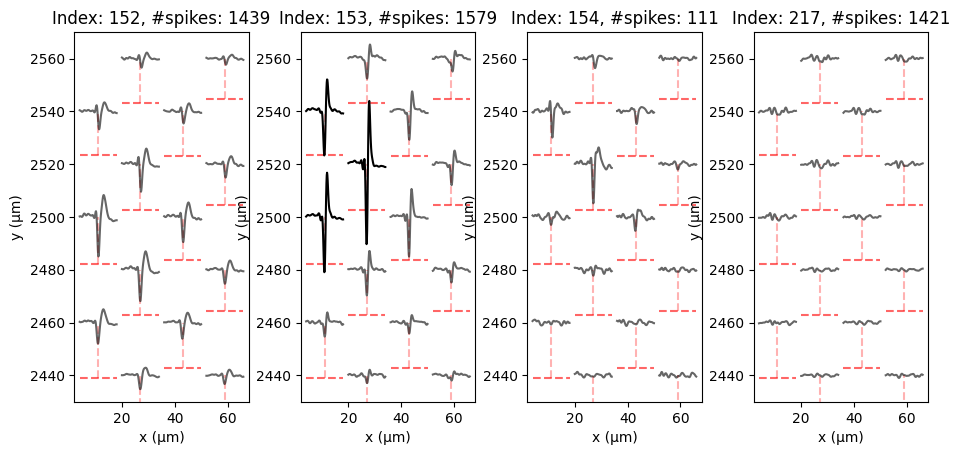

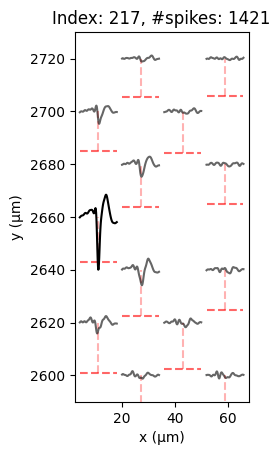

--------------------------------------------------


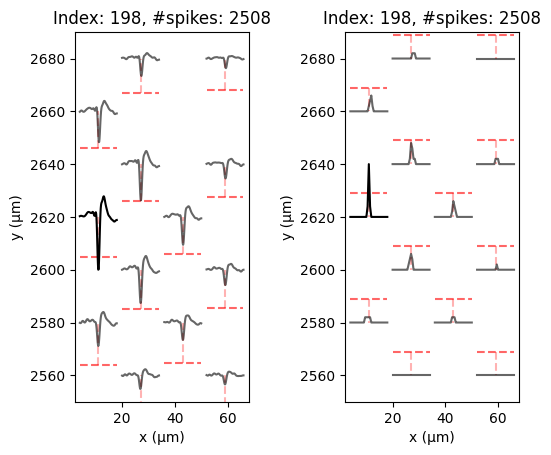

Unit 156: 0.052591463414634144
Unit 198: 0.7705882352941177


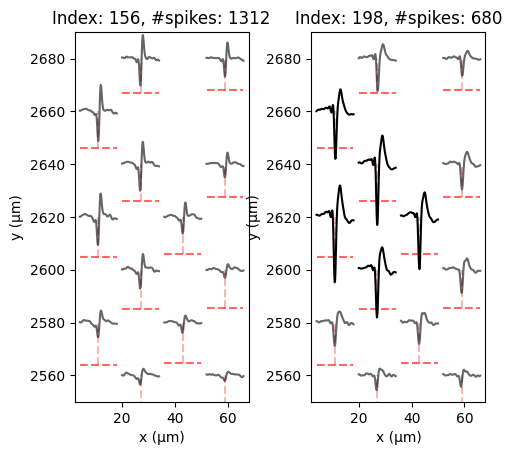

--------------------------------------------------


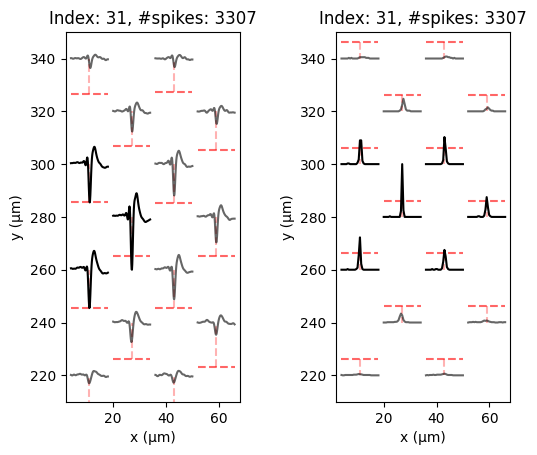

Unit 171: 0.7530279094260137
Unit 173: 0.4271255060728745


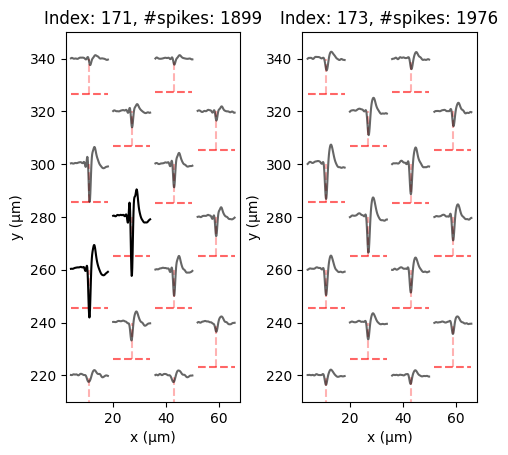

In [205]:
# Plot ks units on all elecs with 50um and four units with highest overlap score
min_prop_units = 2  # Only look at 
replot_dist = 100 # Replot ks unit if chan far away from prop unit
#

for prop, ks_tuples in prop_to_ks_units.items():
    if len(ks_tuples) < min_prop_units:
        continue
    
    print("-"*50)
    kwargs, _ = plot_elec_probs(prop)
    plt.show()
        
    fig, axes = plt.subplots(ncols=len(ks_tuples), figsize=(2.8*len(ks_tuples), 4.8))
    replot_units = []  # Replot unit if chan far away from prop unit
    for i, (score, unit) in enumerate(ks_tuples):
        print(f"Unit {unit.idx}: {score}")        
        unit.plot(axis=axes[i], **kwargs)
        if calc_elec_dist(unit.chan, prop.chan) > replot_dist:
            replot_units.append(unit)
    plt.show()
    
    if len(replot_units) > 0:
        fig, axes = plt.subplots(ncols=len(replot_units), figsize=(2.8*len(replot_units), 4.8))
        axes = np.atleast_1d(axes)
        for i, unit in enumerate(replot_units):
            unit.plot(axis=axes[i], chans_rms=CHANS_RMS)
        plt.show()
    

#### Merge kilosort units
Merge kilosort units that have the same max prop unit
This is the upper bound of kilosort merging

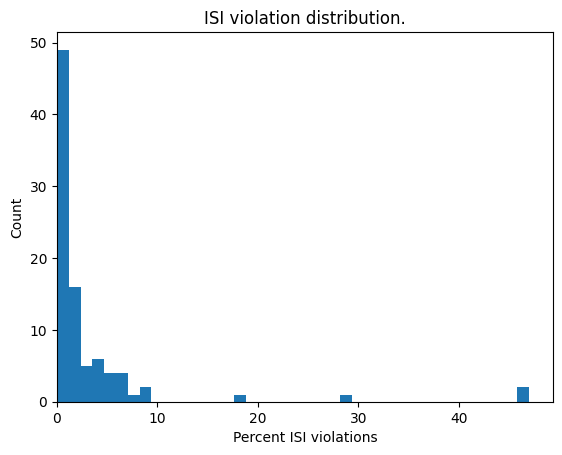

In [224]:
all_uppermerged_ks_spike_times = []
for ks_tuples in prop_to_ks_units.values():
    spike_train = []
    for score, ks_unit in ks_tuples:
        spike_train.extend(ks_unit.spike_train)
    spike_train = np.sort(spike_train)  
    # spike_train = fix_isi_viols(spike_train)
    all_uppermerged_ks_spike_times.append(spike_train)
uppermerged_kilosort = SpikeSorter(RECORDING, "Uppermerged Kilosort", all_uppermerged_ks_spike_times)
_ = uppermerged_kilosort.plot_isis(bins=40)

Num RT-Sort: 108
Num Uppermerged Kilosort: 91
Num single matches: 20

For RT-Sort:
Num max matches: 20
Num unique max matches: 20

For Uppermerged Kilosort:
Num max matches: 20
Num unique max matches: 20


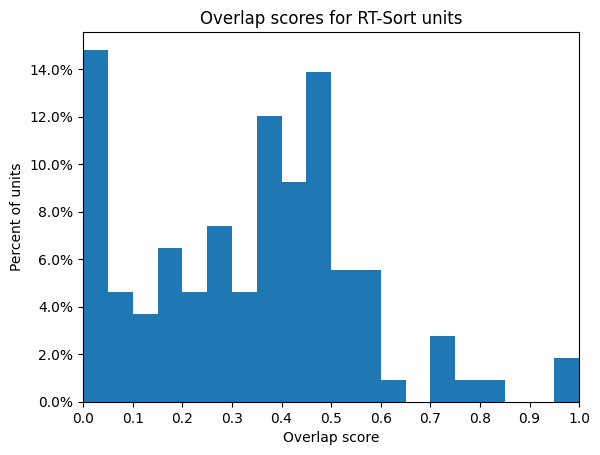

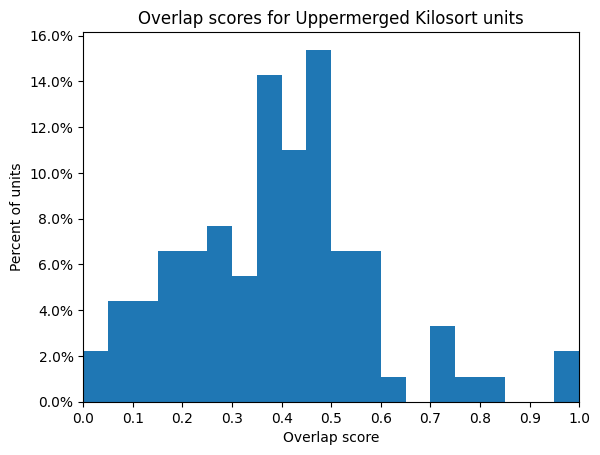

Num RT-Sort: 108
Num Uppermerged Kilosort: 91
Num single matches: 65

For RT-Sort:
Num max matches: 108
Num unique max matches: 57

For Uppermerged Kilosort:
Num max matches: 65
Num unique max matches: 63


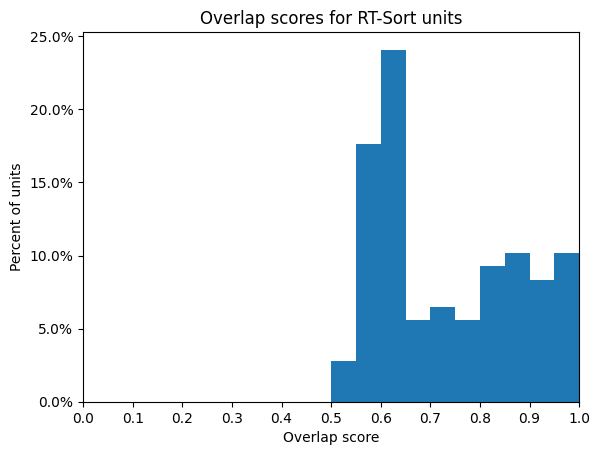

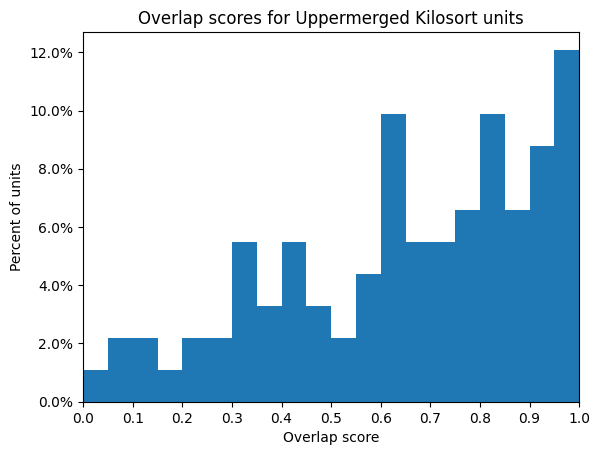

Num RT-Sort: 108
Num Uppermerged Kilosort: 91
Num single matches: 48

For RT-Sort:
Num max matches: 50
Num unique max matches: 47

For Uppermerged Kilosort:
Num max matches: 48
Num unique max matches: 48


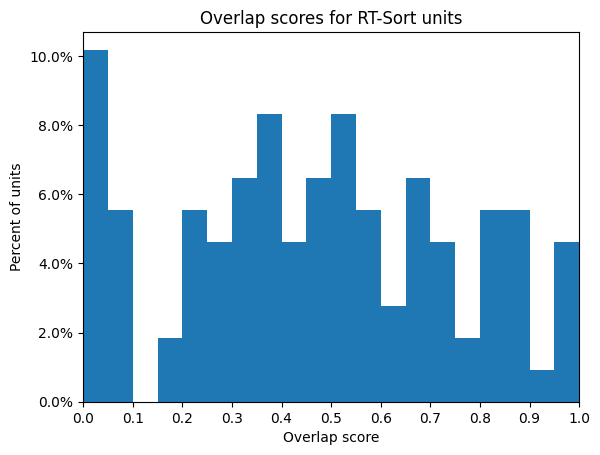

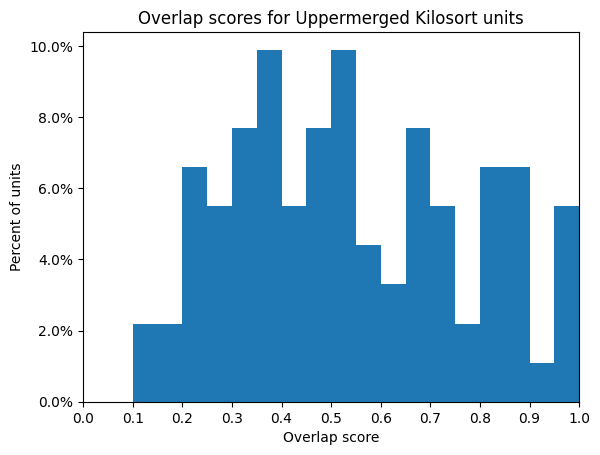

In [225]:
comp_1_5 = Comparison(prop_signal, uppermerged_kilosort, score_formula=1.5, delta_time=2)
comp_1_5.summary()

comp_1 = Comparison(prop_signal, uppermerged_kilosort, score_formula=1, delta_time=2)
comp_1.summary()

comp_2 = Comparison(prop_signal, uppermerged_kilosort, score_formula=2, delta_time=2)
comp_2.summary()

### Kilosort as prop
Assume each kilosort unit is a root that needs to be merged with other roots and detects spikes

In [279]:
# Form ks_prop units and set footprint stats for MERGING (use_rms_thresh=FALSE)

class KSProp:
    def __init__(self, spike_train) -> None:
        self.spike_train = spike_train
        
def form_ks_prop(spike_train):
    prop = KSProp(spike_train)
    set_footprint_stats(prop, use_rms_thresh=True, rel_amp_thresh=0)  # Should be false
    return prop

all_ks_props = []
with Pool(processes=20) as pool:
    kilosort_spike_times = kilosort.get_spike_times()
    for ks_prop in tqdm(pool.imap(form_ks_prop, kilosort_spike_times), total=len(kilosort_spike_times)):
        all_ks_props.append(ks_prop)

 42%|████▏     | 96/226 [00:51<01:10,  1.86it/s]


IndexError: index 31 is out of bounds for axis 2 with size 31

In [ ]:
# Look at footprint stats
for elec in all_ks_props[1].prop_elecs_:
    print(elec, [round(s, 4) for s in all_ks_props[1].footprint_stats_[elec]])

1 [0.0229, 0.0483, 2.3026, 0.5224, 5.2879]


In [ ]:
# Merge - intraGMM
elec_to_ks = {}
for ks in all_ks_props:
    # print(ks.prop_elecs_)
    
    if len(ks.prop_elecs_) > 0:
        # print(np.sort(ks.footprint_stats_[:, -1])[-3:])
        # unit = Unit(0, ks.spike_train, np.argmax(ks.footprint_stats_[:, 2]), recording)
        # unit.plot(chans_rms=chans_rms)
        # plt.show()
        
        elec = ks.prop_elecs_[0]
        if elec not in elec_to_ks:
            elec_to_ks[elec] = [ks]
        else:
            elec_to_ks[elec].append(ks)
            
all_ks_props_merged = []
for ks_props in tqdm(elec_to_ks.values()):
    if len(ks_props) == 1:
        all_ks_props_merged += ks_props
    else:
        all_ks_props_merged += merge_roots(deepcopy(ks_props))
        
# Set self.recording=None so units can be pickled
all_ks_props = []
for ks_prop in all_ks_props_merged:
    ks_prop.recording=None
    all_ks_props.append(ks_prop)
print(f"#merges: {len(all_ks_props)}")

100%|██████████| 120/120 [00:00<00:00, 1301.74it/s]

#merges: 160


In [ ]:
# Form ks_prop units and set footprint stats for DETECTING SPIKES (use_rms_thresh=TRUE)        
def job(ks_prop):
    set_footprint_stats(ks_prop, use_rms_thresh=True)
    return ks_prop

all_ks_props_spikes = []
with Pool(processes=20) as pool:
    for ks_prop in tqdm(pool.imap(job, all_ks_props), total=len(all_ks_props)):
        all_ks_props_spikes.append(ks_prop)
all_ks_props = all_ks_props_spikes

  0%|          | 0/160 [00:00<?, ?it/s]

100%|██████████| 160/160 [01:18<00:00,  2.04it/s]


In [ ]:
# Check footprints of kilosort units
kilosort_15 = get_experts_kilosort()

for i, spike_train in enumerate(kilosort_15.get_spike_times()):    
    unit = Unit(i, spike_train, 0, recording)
    unit.set_templates(num_wfs=500)
    unit.chan = np.argmin(np.min(unit.templates, axis=1))
    unit.plot(chans_rms=chans_rms)
    plt.show()

In [ ]:
# Detect spikes
ks_prop_spike_times = []
for ks in tqdm(all_ks_props):
    if len(ks.prop_elecs_) > 1:
        spikes = detect_spikes(ks, x_std=1000, min_coc_p=0)
        if len(spikes) > 0:
            ks_prop_spike_times.append(spikes)

  7%|▋         | 11/160 [00:00<00:04, 31.63it/s]

100%|██████████| 160/160 [00:05<00:00, 26.84it/s]


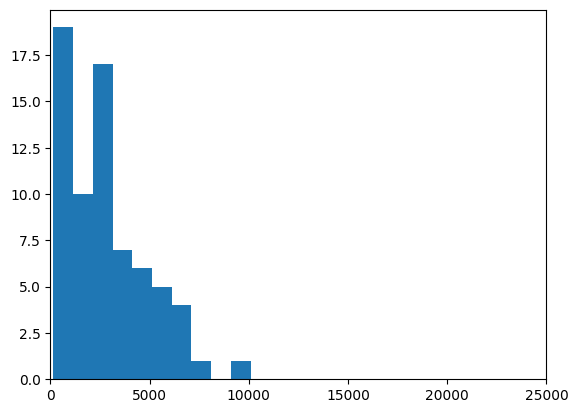

In [ ]:
kilosort_prop = DummySorter(ks_prop_spike_times, name="Kilosort Prop")
plt.hist([len(k) for k in ks_prop_spike_times])
plt.xlim(0, 25000)
plt.show()

/data/MEAprojects/PropSignal/src/comparison.py:335: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)


Num Prop: 104
Num Kilosort Prop: 70
Num single matches: 32

For Prop:
Num max matches: 34
Num unique max matches: 32

For Kilosort Prop:
Num max matches: 40
Num unique max matches: 31


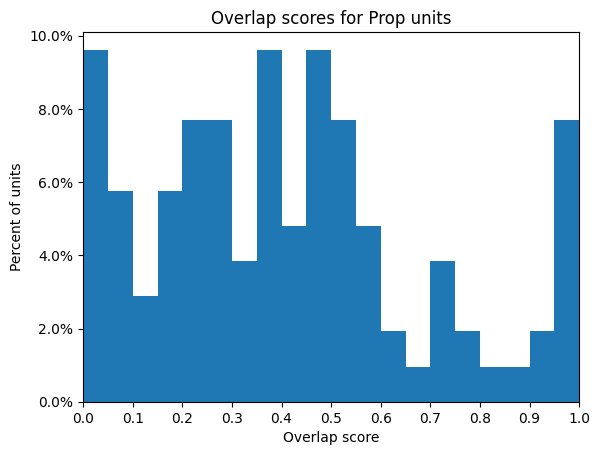

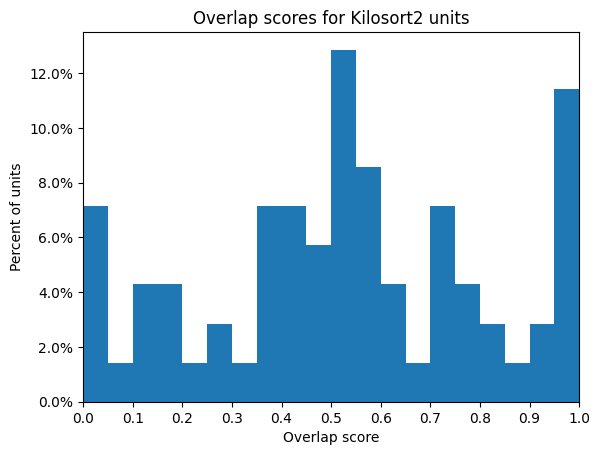

Num Prop: 104
Num Kilosort Prop: 70
Num single matches: 55

For Prop:
Num max matches: 79
Num unique max matches: 47

For Kilosort Prop:
Num max matches: 57
Num unique max matches: 46


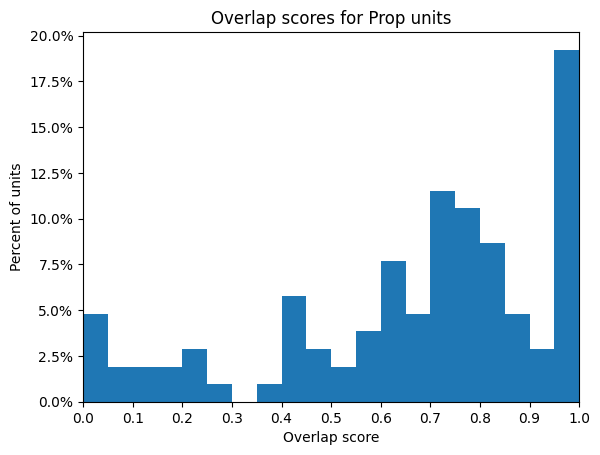

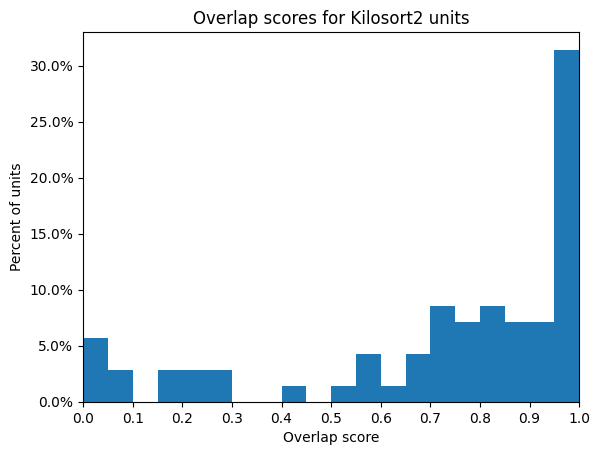

Num Prop: 104
Num Kilosort Prop: 70
Num single matches: 41

For Prop:
Num max matches: 48
Num unique max matches: 35

For Kilosort Prop:
Num max matches: 51
Num unique max matches: 34


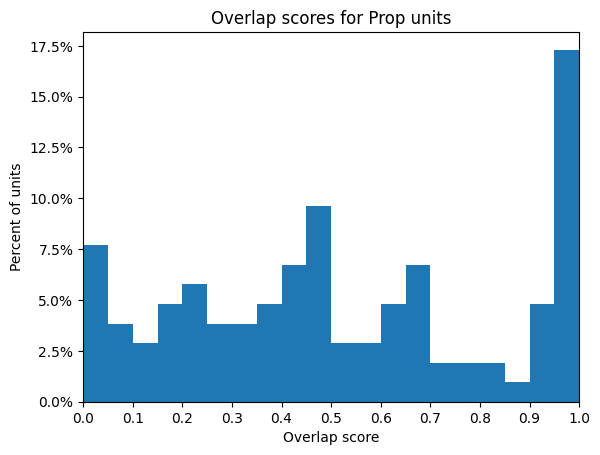

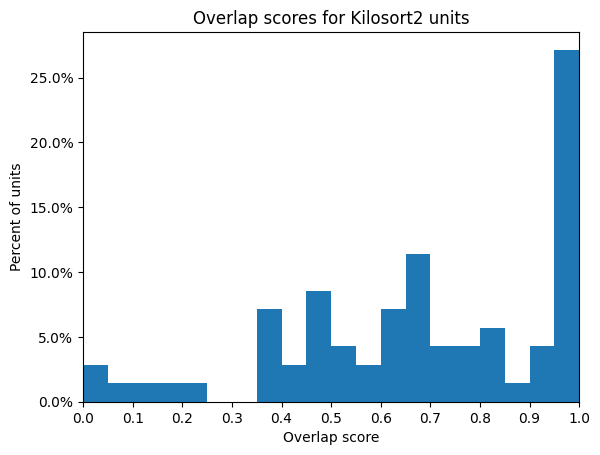

In [ ]:
comp_1_5 = Comparison(prop_signal, kilosort_prop, score_formula=1.5)
comp_1_5.summary()

comp_1 = Comparison(prop_signal, kilosort_prop, score_formula=1)
comp_1.summary()

comp_2 = Comparison(prop_signal, kilosort_prop, score_formula=2)
comp_2.summary()

### Merged kilosort

In [ ]:
# Extract mean templates for prop units

NUM_WFS = 300
MS_BEFORE = 2
MS_AFTER = 2

np.random.seed(231)
##
# Need to convert prop's units from Unit objects to PropUnit objects
prop_units = []
for idx, unit in enumerate(prop_signal):
    dataframe = []
    for elec in all_props_detected[idx].prop_elecs_:
        dataframe.append((elec, all_props_detected[idx].footprint_stats_[elec, 0], 100, 1))
    dataframe = DataFrame(dataframe, columns=["ID", "latency", "cooccurrences", "ccg_ratio"])
    dataframe = dataframe.astype({"ID": int, "latency": float, "cooccurrences": int, "ccg_ratio": float})
    prop_units.append(PropUnit([dataframe], idx, spike_train=unit.spike_train, recording=RECORDING))

def extract_templates(unit_idx):
    unit = prop_units[unit_idx]
    return unit_idx, unit.get_templates(num_wfs=NUM_WFS, ms_before=MS_BEFORE, ms_after=MS_AFTER)

with Pool(processes=12) as pool:
    for unit_idx, templates in tqdm(pool.imap(extract_templates, range(len(prop_units))), total=len(prop_units)):
        prop_units[unit_idx].templates = templates
        prop_units[unit_idx].chan = np.argmin(np.min(templates, axis=1))

100%|██████████| 103/103 [00:39<00:00,  2.60it/s]


In [ ]:
# Extract mean templates for kilosort units

NUM_WFS = 300
MS_BEFORE = 2
MS_AFTER = 2

np.random.seed(231)
##
ks_units = [unit for unit in kilosort]
def extract_templates(unit_idx):
    unit = ks_units[unit_idx]
    return unit_idx, unit.get_templates(num_wfs=NUM_WFS, ms_before=MS_BEFORE, ms_after=MS_AFTER)

with Pool(processes=12) as pool:
    for unit_idx, templates in tqdm(pool.imap(extract_templates, range(len(ks_units))), total=len(ks_units)):
        ks_units[unit_idx].templates = templates
        ks_units[unit_idx].chan = np.argmin(np.min(templates, axis=1))

100%|██████████| 226/226 [01:21<00:00,  2.78it/s]


In [206]:
prop_units = [unit for unit in prop_signal]

In [211]:
F.grid_search_num_merges(prop_units, all_ks_units, comp_2.agreement_scores, 
                         max_isi_viol_p_values=[None, 1, 1.5, 2, 3, 4, 5, 6, 7, 8], max_wf_diff_values=[np.inf])

,inf
NaN,0
1.0,36
1.5,45
2.0,51
3.0,55
4.0,59
5.0,57
6.0,57
7.0,57
8.0,57


In [212]:
merged_ks_units = F.merge_ks_units(prop_units, all_ks_units, comp_2.agreement_scores,
                                   max_isi_viol_p=2, max_wf_diff=np.inf)
sum(len(merge) for merge in merged_ks_units if len(merge) > 1)
# test = [merge for merge in merged_ks_units if len(merge) > 1]

51

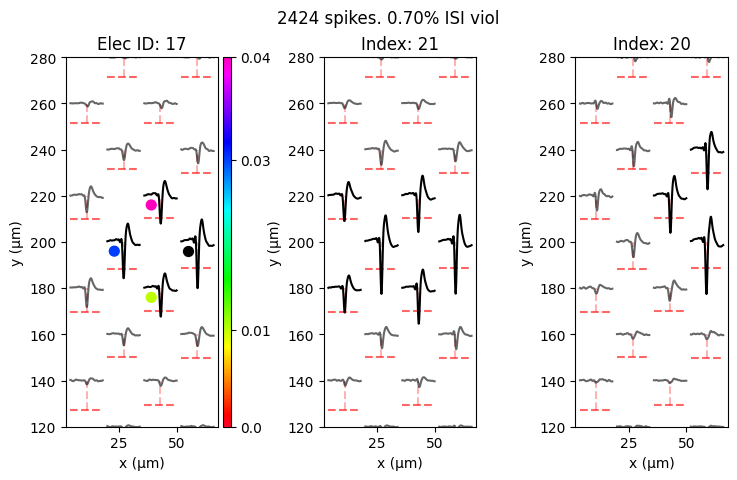

% ISI violations for each unit


21,20
0.0,0.0



Waveform dissimilarity for each unit pair


,21,20
21,-1,187
20,-1,-1


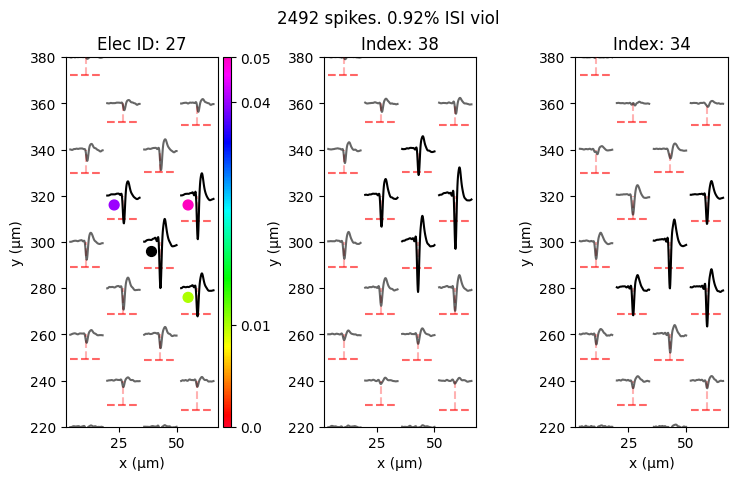

% ISI violations for each unit


38,34
0.06,0.0



Waveform dissimilarity for each unit pair


,38,34
38,-1,177
34,-1,-1


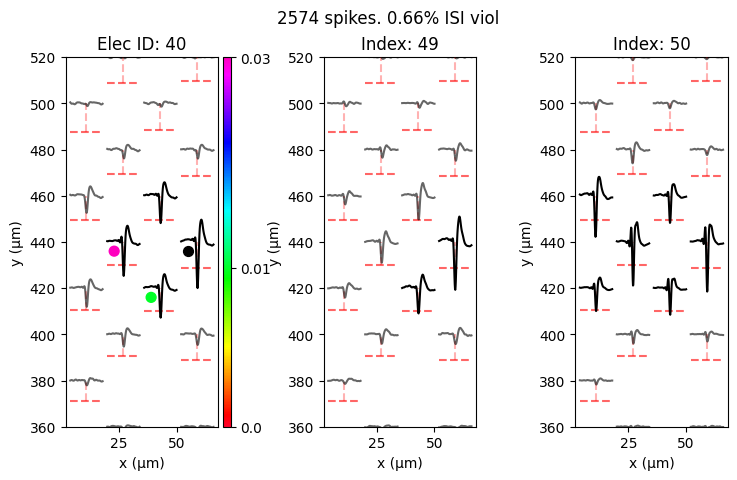

% ISI violations for each unit


49,50
0.0,0.0



Waveform dissimilarity for each unit pair


,49,50
49,-1,219
50,-1,-1


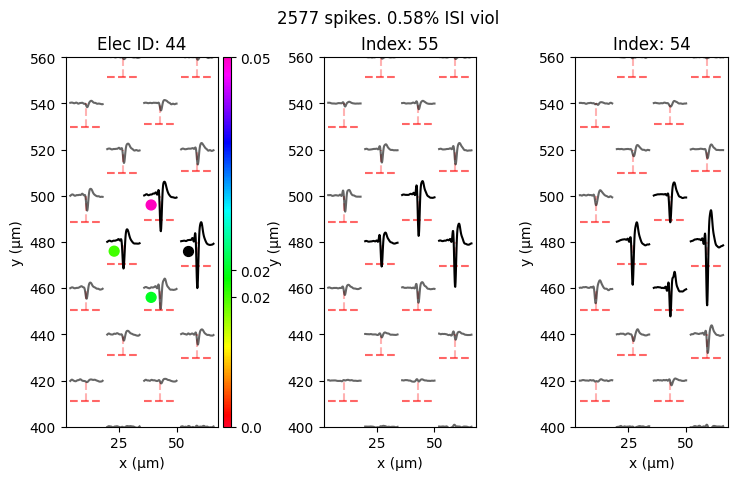

% ISI violations for each unit


55,54
0.0,0.0



Waveform dissimilarity for each unit pair


,55,54
55,-1,175
54,-1,-1


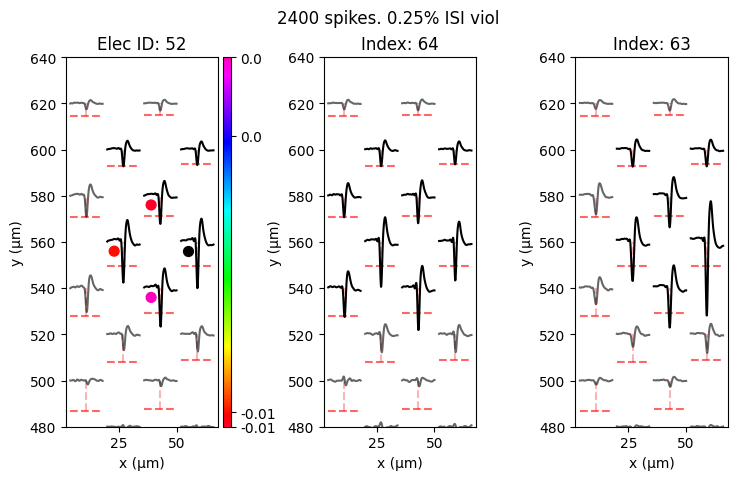

% ISI violations for each unit


64,63
0.0,0.0



Waveform dissimilarity for each unit pair


,64,63
64,-1,207
63,-1,-1


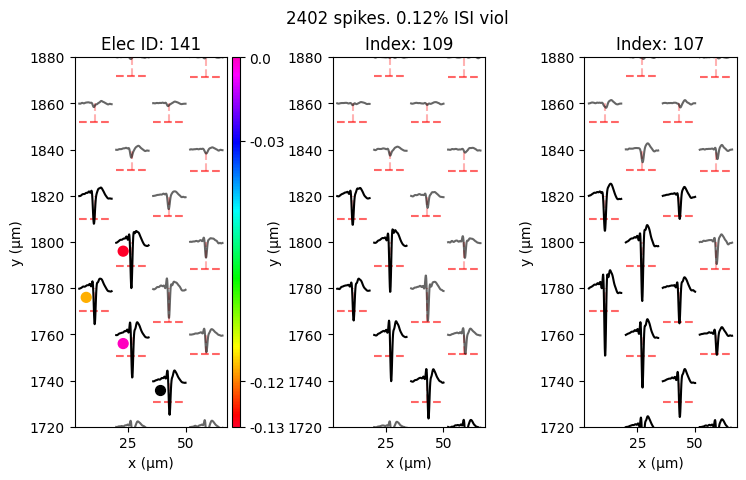

% ISI violations for each unit


109,107
0.0,0.0



Waveform dissimilarity for each unit pair


,109,107
109,-1,192
107,-1,-1


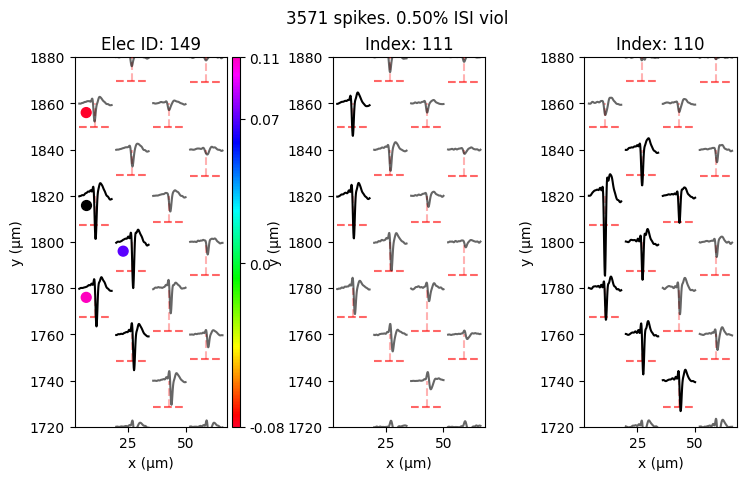

% ISI violations for each unit


111,110
0.03,0.0



Waveform dissimilarity for each unit pair


,111,110
111,-1,277
110,-1,-1


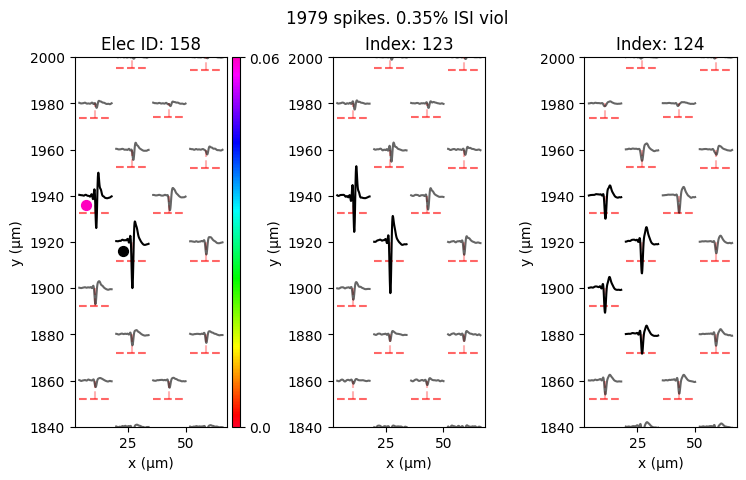

% ISI violations for each unit


123,124
0.0,0.15



Waveform dissimilarity for each unit pair


,123,124
123,-1,300
124,-1,-1


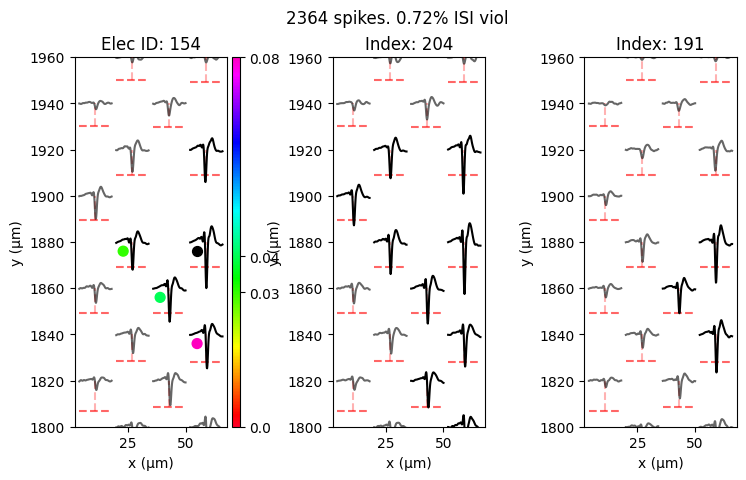

% ISI violations for each unit


204,191
0.0,0.22



Waveform dissimilarity for each unit pair


,204,191
204,-1,266
191,-1,-1


In [ ]:
for merge in merged_ks_units:
    if len(merge) > 1:
        merge.plot(CHANS_RMS)

/data/MEAprojects/PropSignal/src/comparison.py:334: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)


Num RT-Sort: 108
Num Sorter: 198
Num single matches: 26

For RT-Sort:
Num max matches: 26
Num unique max matches: 26

For Sorter:
Num max matches: 27
Num unique max matches: 26


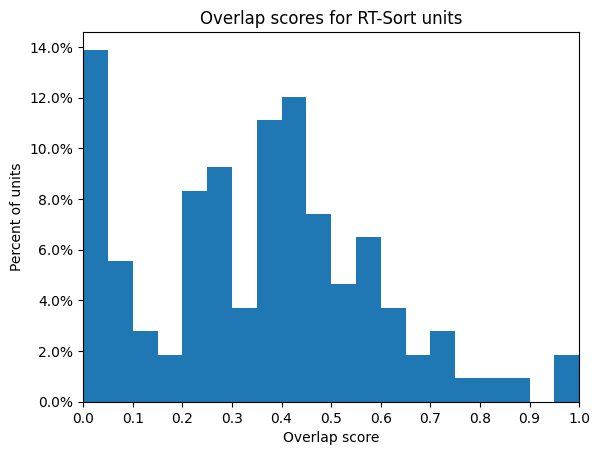

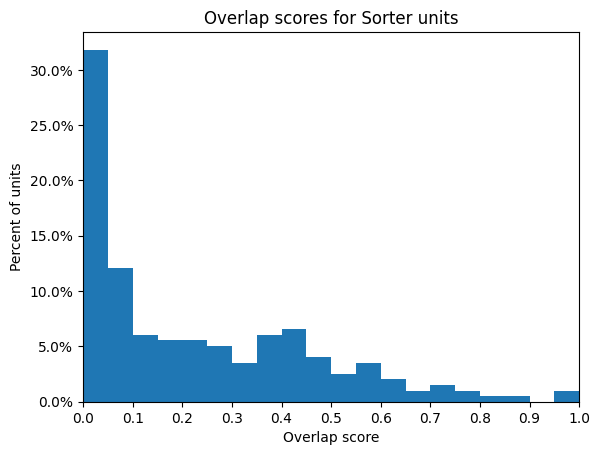

Num RT-Sort: 108
Num Sorter: 198
Num single matches: 50

For RT-Sort:
Num max matches: 55
Num unique max matches: 48

For Sorter:
Num max matches: 52
Num unique max matches: 48


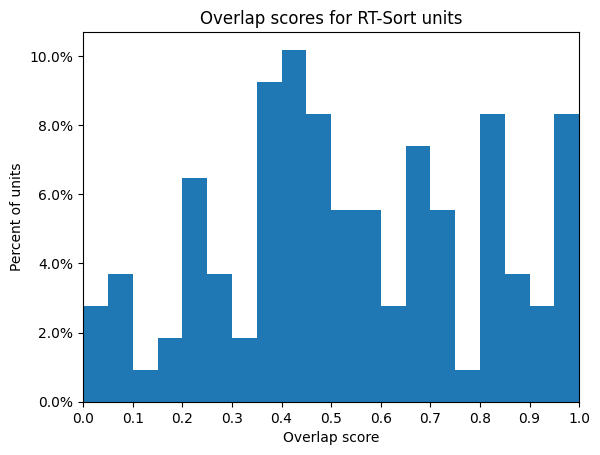

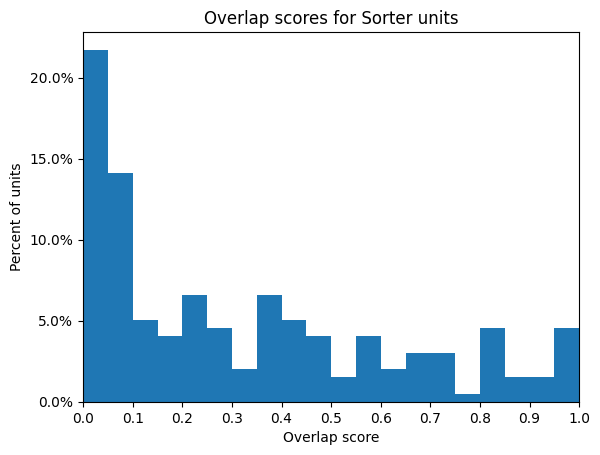

Num RT-Sort: 108
Num Sorter: 198
Num single matches: 68

For RT-Sort:
Num max matches: 69
Num unique max matches: 67

For Sorter:
Num max matches: 79
Num unique max matches: 68


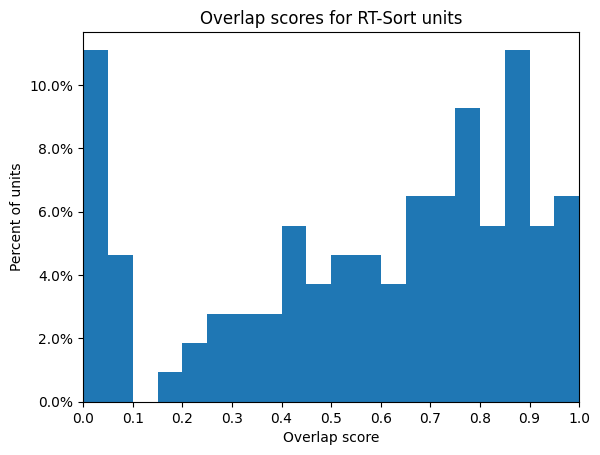

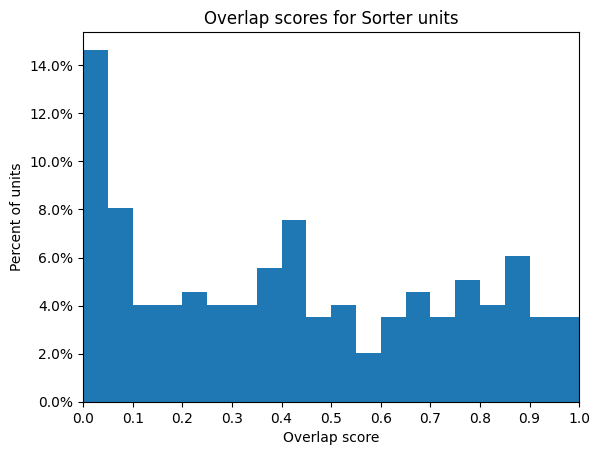

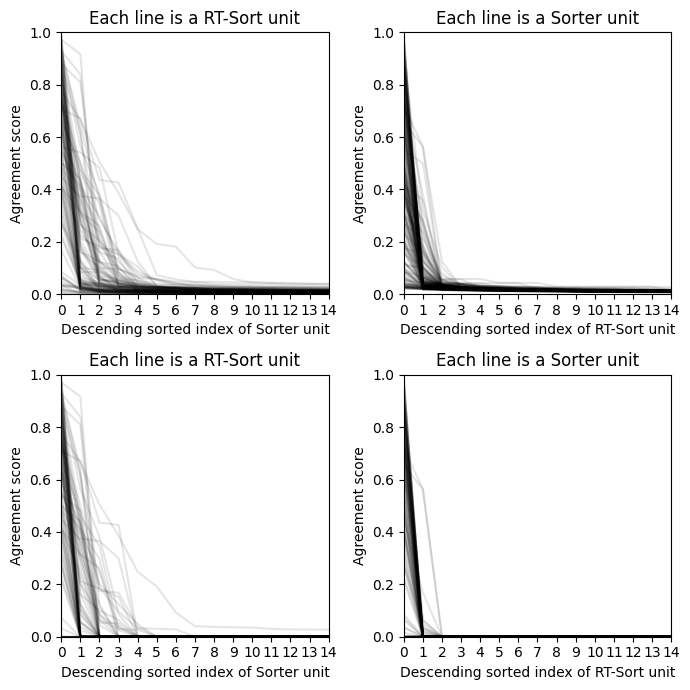

In [213]:
kilosort_dummy = DummySorter.units_to_sorter(merged_ks_units, name="Kilosort2")
_ = Comparison.full(prop_signal, kilosort_dummy)

### Only prop spikes within kilosort spikes

In [231]:
within_prop_units, outside_prop_units = F.select_prop_spikes_within_kilosort_spikes(prop_units, all_ks_units, RECORDING,
                                                                                    max_ms_dist=0.4, max_micron_dist=200)

25.9%


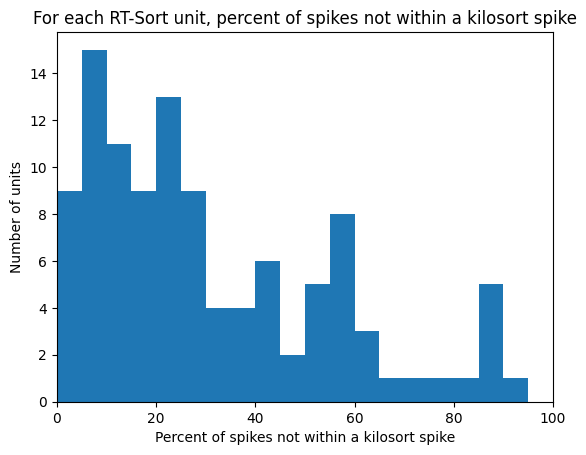

In [233]:
outside_percents = []
total_within = 0
total_outside = 0
for within, outside in zip(within_prop_units, outside_prop_units):
    within, outside = len(within.spike_train), len(outside.spike_train)
    total_within += within
    total_outside += outside
    outside_percents.append(outside / (outside+within) * 100)

print(f"{total_outside/(total_within + total_outside)*100:.1f}%")
plot.hist(outside_percents, xlim=(0, 100), bins=20)
plt.title("For each RT-Sort unit, percent of spikes not within a kilosort spike")
plt.xlabel("Percent of spikes not within a kilosort spike")
plt.ylabel("Number of units")
plt.show()

In [248]:
sorted_ind = np.argsort(outside_percents)
for idx in sorted_ind:
    print(idx, outside_percents[idx])

2 2.690582959641256
17 2.7777777777777777
45 3.2083755488010803
31 3.2841504045692527
78 3.793626707132018
46 3.8917089678511
90 4.262877442273535
69 4.819277108433735
13 4.886293792255685
72 5.217161016949152
51 5.2493438320209975
49 5.305692199578355
76 5.3550178500595
37 5.572380375529982
107 6.495263870094722
100 6.896551724137931
7 6.938603868797309
83 6.9699903194578905
50 7.168718320057929
4 8.045977011494253
11 8.743169398907105
38 8.83944678292243
85 9.150717703349283
91 9.35483870967742
32 10.0
20 10.335403726708075
88 10.52163604030824
16 10.760282509347736
64 11.036225779275483
36 11.252197694862277
33 12.009803921568627
23 13.716245177882556
6 14.144996059889678
59 14.719710669077756
81 14.735772357723578
35 15.052508751458577
84 15.300546448087433
62 15.384615384615385
86 16.773504273504273
15 16.92876965772433
65 17.37012987012987
34 18.6039803865013
22 19.3596425912137
12 19.44129860324651
30 20.342205323193916
8 20.38961038961039
103 20.393974507531865
41 20.9955841027

53.66% percent of spikes not within a kilosort spike


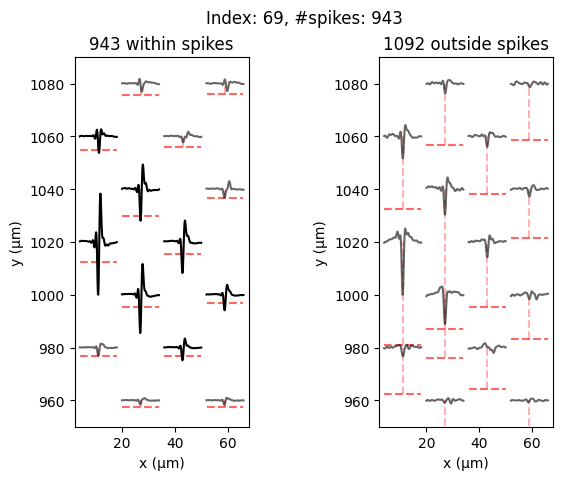

In [257]:
# np.random.seed(501)
# for idx in np.random.choice(len(within_prop_units), 6):
for idx in [44]:
    within, outside, outside_percent = within_prop_units[idx], outside_prop_units[idx], outside_percents[idx]

# for within, outside, outside_percent in zip(within_prop_units, outside_prop_units, outside_percents):
    # if outside_percent < 20:
    #     continue
    
    fig, axes = plt.subplots(1, 2, figsize=(7.2, 4.8))
    # kwargs = within.plot(subplot=(fig, axes[0]), chans_rms=CHANS_RMS)
    kwargs = within.plot(axis=axes[0], chans_rms=CHANS_RMS)
    fig.suptitle(axes[0].get_title())
    axes[0].set_title(f"{len(within.spike_train)} within spikes")
    # outside.plot(subplot=(fig, axes[1]), **kwargs)
    outside.plot(axis=axes[1], chans_rms=CHANS_RMS)# outside.plot(axis=axes[1], **kwargs)
    axes[1].set_title(f"{len(outside.spike_train)} outside spikes")
    print(f"{outside_percent:.2f}% percent of spikes not within a kilosort spike")
    plt.show()

4.0% percent of spikes not within a kilosort spike


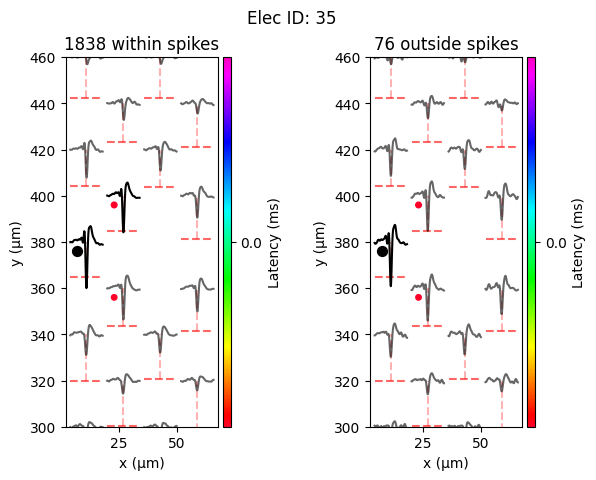

In [ ]:
# Look at a specific example
# IDX = 12
# within, outside, outside_percent = within_prop_units[IDX], outside_prop_units[IDX], outside_percents[IDX]

# fig, axes = plt.subplots(1, 2, figsize=(7.2, 4.8))
# kwargs = within.plot(subplot=(fig, axes[0]), chans_rms=CHANS_RMS)
# fig.suptitle(axes[0].get_title())
# axes[0].set_title(f"{len(within.spike_train)} within spikes")
# outside.plot(subplot=(fig, axes[1]), **kwargs)
# axes[1].set_title(f"{len(outside.spike_train)} outside spikes")
# print(f"{outside_percent:.1f}% percent of spikes not within a kilosort spike")
# plt.show()

/data/MEAprojects/PropSignal/src/comparison.py:334: UserWarning: Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters
  warnings.warn("Using Comparison.count_matching_events_si which is inaccurate when many spikes in succession match between the two sorters", UserWarning)


Num Sorter: 108
Num Uppermerged Kilosort: 91
Num single matches: 35

For Sorter:
Num max matches: 36
Num unique max matches: 35

For Uppermerged Kilosort:
Num max matches: 35
Num unique max matches: 35


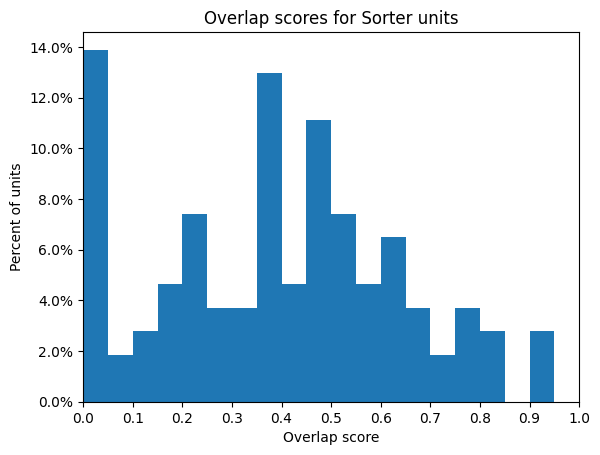

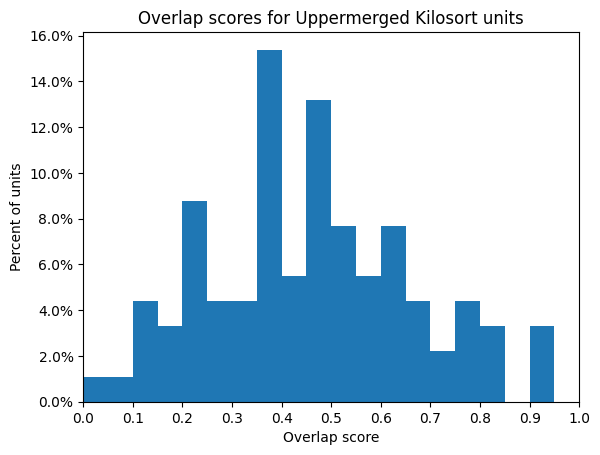

Num Sorter: 108
Num Uppermerged Kilosort: 91
Num single matches: 84

For Sorter:
Num max matches: 101
Num unique max matches: 81

For Uppermerged Kilosort:
Num max matches: 84
Num unique max matches: 83


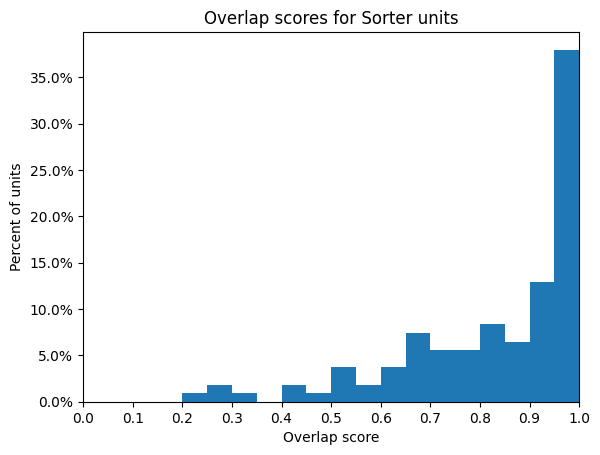

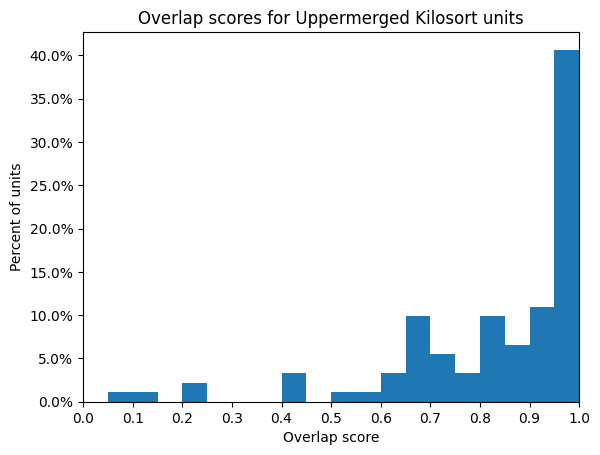

Num Sorter: 108
Num Uppermerged Kilosort: 91
Num single matches: 43

For Sorter:
Num max matches: 45
Num unique max matches: 43

For Uppermerged Kilosort:
Num max matches: 43
Num unique max matches: 43


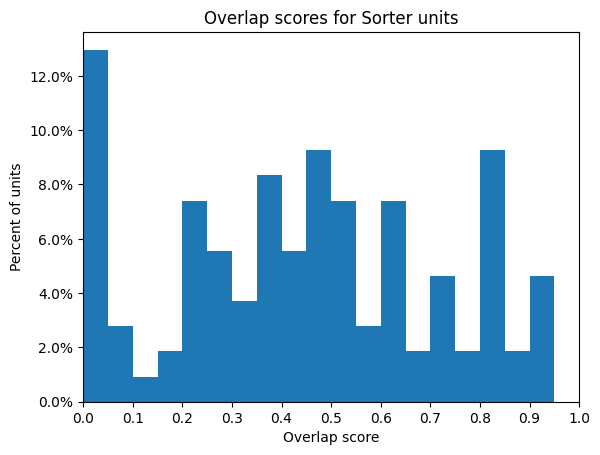

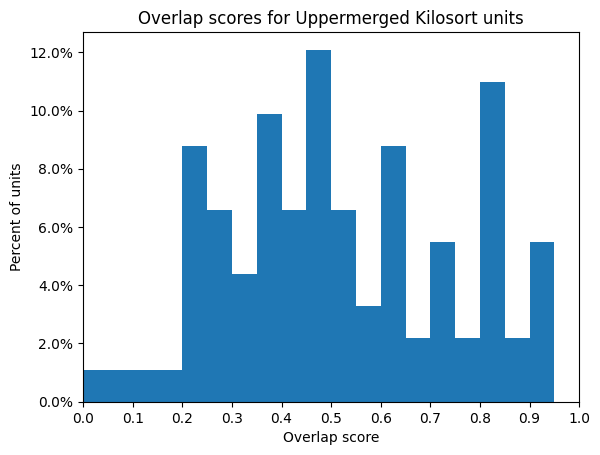

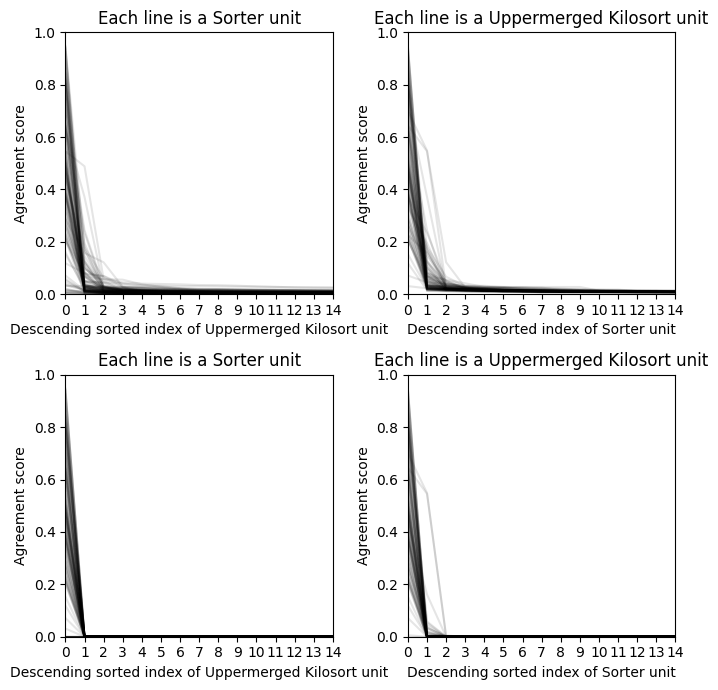

In [243]:
prop_dummy = DummySorter.units_to_sorter([unit for unit in within_prop_units if len(unit.spike_train) > 0], name="RT-Sort")
_ = Comparison.full(prop_dummy, uppermerged_kilosort)
# _ = Comparison.full(prop_dummy, kilosort)